In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
import logging
import music21
from scraper import *
from collections import Counter 
from midi_analysis_helper import *

In [2]:
from selenium import webdriver
from bs4 import BeautifulSoup
import requests

def get_midi_files(composer_url):
    vid_dict = {}
    browser.get(composer_url)
    try:
        items_block = browser.find_element_by_id('items')

        pieces = items_block.find_elements_by_class_name('ytd-playlist-panel-renderer')
        for vid in playlist:
            title = vid.text
            vid_panel = vid.find_element_by_class_name('ytd-playlist-panel-video-renderer')
            href = vid_panel.get_attribute('href')
            vid_dict[title] = href
    except:
        print(f'unable to get data from {playlist_url}')

def is_200_code(page):
    if page.status_code != 200:
        print(page.status_code)
        return False
    else:
        return True


def get_midi_with_bs(composer_url):
    page = requests.get(composer_url)
    if is_200_code(page):
        soup = BeautifulSoup(page.content)
        tags = soup.find_all('tbody')
        return tags

In [3]:
bach_url = 'http://kern.humdrum.org/search?s=t&keyword=Bach+Johann'
tag_test = get_midi_with_bs(bach_url)

In [4]:
type(tag_test)

bs4.element.ResultSet

In [5]:
page = requests.get(bach_url)
if is_200_code(page):
    soup = BeautifulSoup(page.content, 'html.parser')
    tags = soup.find_all('tbody')

In [6]:
trs = soup.find_all('tr')

In [7]:
type(trs)

bs4.element.ResultSet

In [8]:
list_trs = list(trs)

In [9]:
songs_list = list_trs[2:]


In [10]:
len(songs_list)

1352

In [11]:
test_song = songs_list[1000].find_all('a')[2]
type(test_song)

bs4.element.Tag

In [12]:
test_song

<a href="https://kern.humdrum.org/cgi-bin/ksdata?location=users/craig/classical/bach/371chorales&amp;file=chor350.krn&amp;format=midi"><img alt="MIDI File" border="0" src="https://kern.humdrum.org/img/button-M.gif"/></a>

In [13]:
links_with_text = []
for a in soup.find_all('a', href=True): 
    if a.text: 
        links_with_text.append(a['href'])

In [14]:
links_with_text = []
for a in soup.find_all('a', href=True):
    if a.text:
        links_with_text.append(a['href'])

In [15]:
links_with_text

['https://kern.humdrum.org/cgi-bin/ksdata?location=ccarh/class/2005&file=sonata1.krn&format=info',
 'https://kern.humdrum.org/cgi-bin/ksdata?location=ccarh/class/2007/craig/pan&file=wtc2f04-nopan.krn&format=info',
 'https://kern.humdrum.org/cgi-bin/ksdata?location=ccarh/class/2007/craig/pan&file=wtc2f04-pan.krn&format=info',
 'https://kern.humdrum.org/cgi-bin/ksdata?location=ccarh/class/2007/craig/sample&file=chor.krn&format=info',
 'https://kern.humdrum.org/cgi-bin/ksdata?location=ccarh/class/2007/craig/sample&file=chor01.krn&format=info',
 'https://kern.humdrum.org/cgi-bin/ksdata?location=ccarh/class/2007/craig/sample&file=chor02.krn&format=info',
 'https://kern.humdrum.org/cgi-bin/ksdata?location=ccarh/class/2007/craig/sample&file=chor03.krn&format=info',
 'https://kern.humdrum.org/cgi-bin/ksdata?location=ccarh/class/2007/craig/sample&file=chor04.krn&format=info',
 'https://kern.humdrum.org/cgi-bin/ksdata?location=ccarh/class/2007/craig/sample&file=chor05.krn&format=info',
 'https:/

In [16]:
all_href = soup.find_all('a', href=True)
all_midi = []
i = 0
for href in all_href:
    try:
        if href.endswith('midi'):
            all_midi.append(href)
    except:
        i += 1
print(i)

6756


In [17]:
test_href = all_href[123]
test_href

<a href="https://kern.humdrum.org/cgi-bin/ksdata?location=ccarh/class/2007/rob&amp;file=chor110.krn&amp;format=midi"><img alt="MIDI File" border="0" src="https://kern.humdrum.org/img/button-M.gif"/></a>

In [18]:
type(test_href)

bs4.element.Tag

# Getting Bach Chorales from Music21 Corpus


In [19]:
info358 = {'title': 'Wenn wir in höchsten Nöten sein',
 'bwv': 431,
 'kalmus': 358,
 'baerenreiter': 68,
 'budapest': 358,
 'riemenschneider': 68,
 'notes': None}

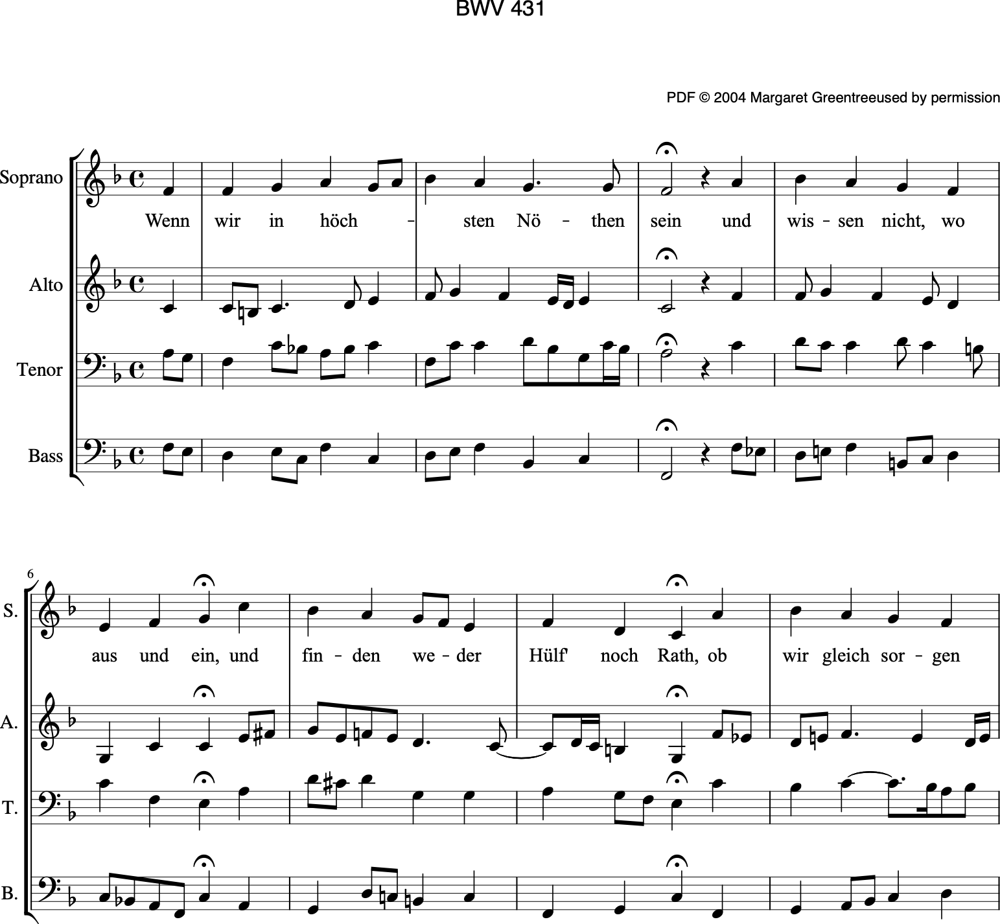

In [20]:
c = music21.corpus.parse('bach/bwv' + str(info358['bwv']))
c.show()  # shows Bach BWV431


In [345]:
def get_parts_dict_from_piece(piece):
    parts = get_parts(piece)
    parts_dict = get_parts_dict(parts)
    return parts_dict


In [21]:
parts_dict = get_parts_dict_from_piece(c)

all_measures = get_all_measures(parts_dict)
measure_notes = get_notes_by_measure(parts_dict)

In [375]:
def get_all_measures(parts_dict: dict):
    """
        returns a reorganized parts_dict, such that it is a list of each measure,
        and each measure is a dict with the measure number and that measure's data

        Params: a dictionary where each key is an instrument name
        Returns: a list of dicts
    """

    all_measures = []
    for key, value in parts_dict.items():
        measure_dict = {}
        measures = value.elements
        for measure in measures:
            try:
                measure_number = measure.measureNumber
                measure_dict[measure_number] = measure.elements
            except:
                print('error in get_all_measures')
                print(measure)
        parts_dict[key] = measure_dict
        all_measures.append(measure_dict)
    return all_measures

In [24]:
# def is_note(note):
#     return len(note)==1 or len(note) == 2

# def remove_rests_from_measure(measure_notes):
#     return [note for note in measure_notes if is_note(note)]

# def remove_rests_from_measure_dict(measure_notes_dict):
#     for meas_num, notes in measure_notes_dict.items():
#         measure_notes_dict[meas_num] = remove_rests_from_measure(notes)
#     return measure_notes_dict

measure_dict_notes = remove_rests_from_measure_dict(measure_notes)

In [25]:
test_measure = measure_dict_notes[1]


# def get_only_note(most_common_tuples: list):
#     """
#         returns only the note letter in the tuple that would be returned 
#         by the most_common method from counter
        
#         Returns: list of note letters
#     """
#     most_common_notes = []
#     for note in most_common_tuples:
#         most_common_notes.append(note[0])
#     return most_common_notes

# def most_frequent(note_list): 
#     occurence_count = Counter(note_list) 
#     most_common_notes = occurence_count.most_common(3)
#     return get_only_note(most_common_notes)
    
most_frequent(test_measure)

['C', 'F', 'A']

In [26]:

# def get_measure_triad(measure_dict_notes: dict):
#     """
#         Given a dictionary of measures with values of each of their notes,
#         return a dictionary with measure num as key
#         and 3 most common notes as values
        
#         Params: a dictionary with keys of measure numbers and values of a list of str 
#         representing notes in that chord
#     """
    
#     measure_chord_dict = {}

#     for measure_num, notes in measure_dict_notes.items():
#         top_3_notes = most_frequent(notes)
#         measure_chord_dict[measure_num] = top_3_notes
# #     print(measure_chord_dict)
#     return measure_chord_dict

# def get_beat_1_notes(measure_dict_notes: dict):
#     """
#         Given a dictionary of measures and the notes container therein, 
#         returns the triadic representation of the notes that occur on the first beat
        
#     """
    
#     measure_beat1_dict = {}
    
#     for measure_num, notes in measure_dict_notes.items():
#         print(notes)
measure_chord_dict = get_measure_triad(measure_dict_notes)

['F', 'C', 'A']
['C', 'F', 'A']
['B-', 'G', 'F']
['F', 'A', 'C']
['D', 'F', 'C']
['C', 'E', 'F']
['G', 'D', 'E']
['F', 'C', 'G']
['B-', 'A', 'D']


In [164]:
# all_measures_test = get_all_measures(parts_dict)

In [28]:

c1 = music21.chord.Chord(measure_chord_dict[3])
c1.pitchedCommonName 


'F-major triad'

In [411]:
def get_parts_dict(c_parts: list):
    """
        Given a list of the parts of a midi score, returns a dictionary
        where the key is the name of each instrument, and the remaining
        data of that part is the key

        Params: list of music21.stream.Part objects
        Returns: dictionary with key->InstrumentName, key-> part data
    """
    parts_dict = {}
    for part in c_parts:
        try:
            instrument = part[0]
            instrument_name = instrument.partName
            parts_dict[instrument_name] = part[1:]
        except:
            print(f'issue printing {part}')
    return parts_dict

In [29]:
def get_chord_name(triad):
    
    #returns the common chord name of a triad
    if len(triad) != 0:
        c1 = music21.chord.Chord(triad)
        return c1.pitchedCommonName
    else:
        return None

def add_chord_name(measure_triad_dict: dict):
    """
        Given a dictionary where the key is a measure number and the value
        is the most common triad found in that measure, returns the common name
        for that chord based on the music21 modules
        
        Params: dict with keys of measure numbers, values of most common triads
        Returns: dict with keys of measure numbers, values with index 0 being triad
        and index 1 being the corresponding chord name
    """
    
    for measure_num, triad in measure_triad_dict.items():
        chord_name = get_chord_name(triad)
        measure_triad_dict[measure_num] = [triad, chord_name]
    return measure_triad_dict

In [30]:
add_chord_name(measure_chord_dict)

{0: [['F', 'C', 'A'], 'F-major triad'],
 1: [['C', 'F', 'A'], 'F-major triad'],
 2: [['B-', 'G', 'F'], 'G-incomplete minor-seventh chord'],
 3: [['F', 'A', 'C'], 'F-major triad'],
 4: [['D', 'F', 'C'], 'D-incomplete minor-seventh chord'],
 5: [['C', 'E', 'F'], 'F-incomplete major-seventh chord'],
 6: [['G', 'D', 'E'], 'E-incomplete minor-seventh chord'],
 7: [['F', 'C', 'G'], 'F-quartal trichord'],
 8: [['B-', 'A', 'D'], 'Bb-incomplete major-seventh chord']}

In [31]:
measure_chord_dict

{0: [['F', 'C', 'A'], 'F-major triad'],
 1: [['C', 'F', 'A'], 'F-major triad'],
 2: [['B-', 'G', 'F'], 'G-incomplete minor-seventh chord'],
 3: [['F', 'A', 'C'], 'F-major triad'],
 4: [['D', 'F', 'C'], 'D-incomplete minor-seventh chord'],
 5: [['C', 'E', 'F'], 'F-incomplete major-seventh chord'],
 6: [['G', 'D', 'E'], 'E-incomplete minor-seventh chord'],
 7: [['F', 'C', 'G'], 'F-quartal trichord'],
 8: [['B-', 'A', 'D'], 'Bb-incomplete major-seventh chord']}

In [32]:
df_test = pd.DataFrame.from_dict(measure_chord_dict)

In [33]:
df_test.swapaxes('index', 'columns')

,0,1
0,"[F, C, A]",F-major triad
1,"[C, F, A]",F-major triad
2,"[B-, G, F]",G-incomplete minor-seventh chord
3,"[F, A, C]",F-major triad
4,"[D, F, C]",D-incomplete minor-seventh chord
5,"[C, E, F]",F-incomplete major-seventh chord
6,"[G, D, E]",E-incomplete minor-seventh chord
7,"[F, C, G]",F-quartal trichord
8,"[B-, A, D]",Bb-incomplete major-seventh chord


In [168]:
# measure_dict

In [35]:
def process_score_vertically(score):
    score_parts = get_parts(score)
    parts_dict = get_parts_dict(score_parts)
    all_measures = get_all_measures(parts_dict)
    measure_notes = get_notes_by_measure(parts_dict)
    measure_notes = remove_rests_from_measure_dict(measure_notes)
    measure_chord_dict = get_measure_triad(measure_notes)
    measure_chord_dict = add_chord_name(measure_chord_dict)
    return measure_chord_dict

In [36]:
bach_scores = music21.corpus.getComposer('bach')

In [37]:

bach_scores = [music21.converter.parse(piece) for piece in bach_scores]

In [38]:
len(bach_scores)

433

In [39]:
palestrina_scores = music21.corpus.getComposer('palestrina')

In [40]:
palestrina_scores = [music21.converter.parse(piece) for piece in palestrina_scores]

In [41]:
len(palestrina_scores)

1318

In [42]:
test_bach = bach_scores[97]

In [43]:
process_score_vertically(test_bach)


[]
['E', 'G', 'B']
['E', 'B', 'A']
['G', 'D', 'A']
['B', 'F#', 'C']
['B', 'E', 'G']
['E', 'G', 'B']
['E', 'G', 'B']
['E', 'B', 'A']
['G', 'D', 'A']
['B', 'F#', 'C']
['B', 'E', 'G']
['E', 'G', 'B']
['E', 'G', 'B']
['G', 'D', 'A']
['G', 'D', 'A']
['E', 'C#', 'F#']
['B', 'E', 'G']
['E', 'F#', 'A']


{0: [[], None],
 1: [['E', 'G', 'B'], 'E-minor triad'],
 2: [['E', 'B', 'A'], 'A-quartal trichord'],
 3: [['G', 'D', 'A'], 'G-quartal trichord'],
 4: [['B', 'F#', 'C'], 'B-tritone-fourth'],
 5: [['B', 'E', 'G'], 'E-minor triad'],
 6: [['E', 'G', 'B'], 'E-minor triad'],
 7: [['E', 'G', 'B'], 'E-minor triad'],
 8: [['E', 'B', 'A'], 'A-quartal trichord'],
 9: [['G', 'D', 'A'], 'G-quartal trichord'],
 10: [['B', 'F#', 'C'], 'B-tritone-fourth'],
 11: [['B', 'E', 'G'], 'E-minor triad'],
 12: [['E', 'G', 'B'], 'E-minor triad'],
 13: [['E', 'G', 'B'], 'E-minor triad'],
 14: [['G', 'D', 'A'], 'G-quartal trichord'],
 15: [['G', 'D', 'A'], 'G-quartal trichord'],
 16: [['E', 'C#', 'F#'], 'F#-incomplete dominant-seventh chord'],
 17: [['B', 'E', 'G'], 'E-minor triad'],
 18: [['E', 'F#', 'A'], 'F#-incomplete minor-seventh chord']}

In [44]:
score_parts = get_parts(test_bach)
parts_dict = get_parts_dict(score_parts)
all_measures = get_all_measures(parts_dict)
measure_notes = get_notes_by_measure(parts_dict)
measure_notes = remove_rests_from_measure_dict(measure_notes)
measure_chord_dict = get_measure_triad(measure_notes)
measure_chord_dict = add_chord_name(measure_chord_dict)


[]
['E', 'G', 'B']
['E', 'B', 'A']
['G', 'D', 'A']
['B', 'F#', 'C']
['B', 'E', 'G']
['E', 'G', 'B']
['E', 'G', 'B']
['E', 'B', 'A']
['G', 'D', 'A']
['B', 'F#', 'C']
['B', 'E', 'G']
['E', 'G', 'B']
['E', 'G', 'B']
['G', 'D', 'A']
['G', 'D', 'A']
['E', 'C#', 'F#']
['B', 'E', 'G']
['E', 'F#', 'A']


In [45]:
print(measure_chord_dict)

{0: [[], None], 1: [['E', 'G', 'B'], 'E-minor triad'], 2: [['E', 'B', 'A'], 'A-quartal trichord'], 3: [['G', 'D', 'A'], 'G-quartal trichord'], 4: [['B', 'F#', 'C'], 'B-tritone-fourth'], 5: [['B', 'E', 'G'], 'E-minor triad'], 6: [['E', 'G', 'B'], 'E-minor triad'], 7: [['E', 'G', 'B'], 'E-minor triad'], 8: [['E', 'B', 'A'], 'A-quartal trichord'], 9: [['G', 'D', 'A'], 'G-quartal trichord'], 10: [['B', 'F#', 'C'], 'B-tritone-fourth'], 11: [['B', 'E', 'G'], 'E-minor triad'], 12: [['E', 'G', 'B'], 'E-minor triad'], 13: [['E', 'G', 'B'], 'E-minor triad'], 14: [['G', 'D', 'A'], 'G-quartal trichord'], 15: [['G', 'D', 'A'], 'G-quartal trichord'], 16: [['E', 'C#', 'F#'], 'F#-incomplete dominant-seventh chord'], 17: [['B', 'E', 'G'], 'E-minor triad'], 18: [['E', 'F#', 'A'], 'F#-incomplete minor-seventh chord']}


In [46]:
test_palestrina = palestrina_scores[0]
print(test_palestrina)

<music21.stream.Score 0xa4316feb8>


In [47]:
pales_parts = get_parts(test_palestrina)
parts_dict = get_parts_dict(pales_parts)
all_measures = get_all_measures(parts_dict)
measure_notes = get_notes_by_measure(parts_dict)
measure_notes = remove_rests_from_measure_dict(measure_notes)
measure_chord_dict = get_measure_triad(measure_notes)

AttributeError: 'MiscTandem' object has no attribute 'partName'

In [48]:
pales_parts

[<music21.stream.Part spine_4>,
 <music21.stream.Part spine_3>,
 <music21.stream.Part spine_2>,
 <music21.stream.Part spine_1>,
 <music21.stream.Part spine_0>]

In [49]:
test_meas=parts_dict['Soprano 1'][5]

In [50]:
test_meas[4].beatDuration

<music21.duration.Duration 1.0>

In [51]:
for note in test_meas:
    if isinstance(note, music21.note.Note):
        print(note.beatDuration)

<music21.duration.Duration 1.0>
<music21.duration.Duration 1.0>
<music21.duration.Duration 1.0>
<music21.duration.Duration 1.0>
<music21.duration.Duration 1.0>


In [ ]:
def get_col_name_from_note(note, measure, beat):
    """
        returns the column name that would correspond to this notes attributes
        to be used in the dataframe
        
        params: note, as str representation of name, measure int, and beat, int
        returns: a concatenated string of the three names
    """
    return note + 'm' + str(measure) + 'beat' + str(beat)

def generate_all_note_columns():
    """
        generates a list of column names for all 12 notes for all 4 beats in all 7 measures
        appends the composer column at the end
        
        returns list of strings in the {notename}m{meas_num}b{beat} format
    """  
    all_columns = []
    note_list = ['A', 'A-', 'G', 'G-', 'F', 'E', 'E-', 'D', 'D-', 'C', 'B', 'B-']
    for measure in range(8):
        for beat in range(1, 5):
            for note in note_list:
                col_name = get_col_name_from_note(note, measure, beat)
                all_columns.append(col_name)
    all_columns.append('composer')
    return all_columns

all_columns = generate_all_note_columns()

In [372]:
composer_df = pd.DataFrame(columns=all_columns)
composer_df.reset_index()

,index,Am0beat1,A-m0beat1,Gm0beat1,G-m0beat1,Fm0beat1,Em0beat1,E-m0beat1,Dm0beat1,D-m0beat1,...,G-m7beat4,Fm7beat4,Em7beat4,E-m7beat4,Dm7beat4,D-m7beat4,Cm7beat4,Bm7beat4,B-m7beat4,composer


In [ ]:
def transpose(s):
    """
        transposes score into C
        ignores major/minor
        
        params: the music21.stream.Score object
        returns: same score transposed to C
    """
    k = s.analyze('key')
    i = music21.interval.Interval(k.tonic, music21.pitch.Pitch('C'))
    sNew = s.transpose(i)
    return sNew

def convert_enharmoic(note):
    """
        Standardizes accidentals and converts all '#'s to their enharmonic flat counterpart
    """
    
    if '#' in note:
        note_name = note[0]
        if note_name == 'A':
            return 'B-'
        elif note_name == 'C':
            return 'D-'
        elif note_name == 'D':
            return 'E-'        
        elif note_name == 'E':
            return 'F'            
        elif note_name == 'B':
            return 'C'
        elif note_name == 'F':
            return 'G-'        
        elif note_name == 'G':
            return 'A-'  
    else:
        return note
        
def set_part_row_to_0(part_row, columns):
    """
        given the part row, a dictionary, set each of the key values of the columns in columns
        equal to 0
        
    """
    
    for column in columns:
        part_row[column] = 0
    return part_row

In [ ]:
def get_measure_by_notes_from_parts(parts_dict):
    all_measures = get_all_measures(parts_dict)
    measure_notes = get_notes_by_measure(parts_dict)
    measure_notes = remove_rests_from_measure_dict(measure_notes)
    return measure_notes

In [ ]:
def get_row_values_from_part_data(part_data, row_dict):
    """
        given a dictionary containing the measure number and the music21 note objects
        contained therin as values, as well as the current row dictionar
        sets value of each note instance to 1 for its corresponding column
        
        params: part_data, a dict object containing the meas_num (int) as keys 
        and a list of music21 note objects as values
            row_dict, a dictionary where keys are all columns and 
            value of each column is whether note exists in measure
        returns: updated row dict
    """
    for meas_num, notes in part_data.items():
        if meas_num < 8:
            for note in notes:
                if isinstance(note, music21.note.Note):
                    note_beat = note.beatStr
                    
    #               Make sure that the beat is not a sub-beat (ie. 1/2)
                    if not '/' in note_beat:
                        note_name = convert_enharmoic(note.name)
                        column = get_col_name_from_note(note_name, meas_num, note_beat)
                        row_dict[column] = 1
    return row_dict


def add_piece_to_df(parts_dict, df, composer):

    #append new row to df with 'title' as the only value known
    if isinstance(parts_dict, dict):
        row_dict = {}
        row_dict = set_part_row_to_0(row_dict, all_columns)
        row_dict['composer'] = composer  
        #convert the parts dict into a dictionary of measures with notes
        parts_with_notes_by_measure = get_all_measures(parts_dict)
        for part in parts_with_notes_by_measure:
            row_dict = get_row_values_from_part_data(part, row_dict)

        df = df.append(row_dict, ignore_index=True)
    else:
        return df

    return df

In [ ]:
def add_all_pieces_to_df(df, piece_list, composer):
    for piece in piece_list:
        piece_in_c = transpose(piece)
        parts_dict = get_parts_dict_from_piece(piece_in_c)
        df = add_piece_to_df(parts_dict, df, composer)
    return df

In [380]:
test_df = add_all_pieces_to_df(test_df, bach_scores, 0)

{'Horn 2': <music21.stream.Part Horn 2>, 'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>,

{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Te

{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano 1': <music21.stream.Part Soprano 1>, 'Soprano 2': <music21.stream.Part Soprano 2>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part

{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Trumpet 1,2': <music21.stream.Part Trumpet 1,2>, 'Trumpet 3': <music21.stream.Part Trumpet 3>, 'Timpani': <music21.stream.Part Timpani>, 'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>, 'Continuo': <music21.stream.Part Continuo>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>, 'Continuo': <music21.stream.Part Continuo>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Horn 1': <music21.stream.Part Horn 1>, 'Horn 2': <music21.stream.Part Horn 2>, 'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Te

{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Trumpet 1': <music21.stream.Part Trumpet 1>, 'Trumpet 2': <music21.stream.Part Trumpet 2>, 'Trumpet 3': <music21.stream.Part Trumpet 3>, 'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>, 'Timpani': <music21.stream.Part Timpani>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <mus

{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Te

{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Te

{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Te

{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Piano': <music21.stream.PartStaff P1-Staff2>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part Soprano>, 'Alto': <music21.stream.Part Alto>, 'Tenor': <music21.stream.Part Tenor>, 'Bass': <music21.stream.Part Bass>}
{'Soprano': <music21.stream.Part S

In [382]:
compser_df = test_df

In [ ]:
def get_parts_dict(c_parts: list):
    """
        Given a list of the parts of a midi score, returns a dictionary
        where the key is the name of each instrument, and the remaining
        data of that part is the key

        Params: list of music21.stream.Part objects
        Returns: dictionary with key->InstrumentName, key-> part data
    """
    parts_dict = {}
    for part in c_parts:
        try:
            instrument = part[0]
            instrument_name = instrument.partName
            parts_dict[instrument_name] = part[1:]
        except:
            print(f'issue printing {part}')
    return parts_dict

In [391]:
test_df = add_all_pieces_to_df(composer_df, palestrina_scores, 1)

issue printing <music21.stream.Part spine_4>
issue printing <music21.stream.Part spine_3>
issue printing <music21.stream.Part spine_2>
issue printing <music21.stream.Part spine_1>
issue printing <music21.stream.Part spine_0>
{}
issue printing <music21.stream.Part spine_4>
issue printing <music21.stream.Part spine_3>
issue printing <music21.stream.Part spine_2>
issue printing <music21.stream.Part spine_1>
issue printing <music21.stream.Part spine_0>
{}
issue printing <music21.stream.Part spine_4>
issue printing <music21.stream.Part spine_3>
issue printing <music21.stream.Part spine_2>
issue printing <music21.stream.Part spine_1>
issue printing <music21.stream.Part spine_0>
{}
issue printing <music21.stream.Part spine_7>
issue printing <music21.stream.Part spine_6>
issue printing <music21.stream.Part spine_5>
issue printing <music21.stream.Part spine_4>
issue printing <music21.stream.Part spine_3>
issue printing <music21.stream.Part spine_2>
issue printing <music21.stream.Part spine_1>
i

issue printing <music21.stream.Part spine_5>
issue printing <music21.stream.Part spine_4>
issue printing <music21.stream.Part spine_3>
issue printing <music21.stream.Part spine_2>
issue printing <music21.stream.Part spine_1>
issue printing <music21.stream.Part spine_0>
{}
issue printing <music21.stream.Part spine_5>
issue printing <music21.stream.Part spine_4>
issue printing <music21.stream.Part spine_3>
issue printing <music21.stream.Part spine_2>
issue printing <music21.stream.Part spine_1>
issue printing <music21.stream.Part spine_0>
{}
issue printing <music21.stream.Part spine_5>
issue printing <music21.stream.Part spine_4>
issue printing <music21.stream.Part spine_3>
issue printing <music21.stream.Part spine_2>
issue printing <music21.stream.Part spine_1>
issue printing <music21.stream.Part spine_0>
{}
issue printing <music21.stream.Part spine_4>
issue printing <music21.stream.Part spine_3>
issue printing <music21.stream.Part spine_2>
issue printing <music21.stream.Part spine_1>
i

KeyboardInterrupt: 

In [412]:
pales_parts = get_parts(test_palestrina)
parts_dict = get_parts_dict(pales_parts)

issue printing <music21.stream.Part spine_4>
issue printing <music21.stream.Part spine_3>
issue printing <music21.stream.Part spine_2>
issue printing <music21.stream.Part spine_1>
issue printing <music21.stream.Part spine_0>


In [397]:
test_parts = get_parts(test_pales)


In [526]:
def get_pales_parts_dict(score):
    score_in_c = transpose(score)
    pales_parts = get_parts(score_in_c)
    all_parts = {}
    for part in pales_parts:
        part_notes = part.notes
        stream_ele = part_notes.srcStreamElements
        all_meas = {}
        for measure in stream_ele:            
            if isinstance(measure, music21.stream.Measure):
                meas_num = measure.measureNumber
                all_notes_in_measure = []
                for note in measure.notes.srcStreamElements:
                    if isinstance(note, music21.note.Note):
                        all_notes_in_measure.append(note)
                all_meas[meas_num] = all_notes_in_measure
        all_parts[part.partName] = all_meas
    return all_parts

def get_row_values_from_palestrina_part(part_data, row_dict):
    """
        Slight variation from other get row values method, but because the 
        part data being passed in is slightly different, the method has to be 
        slightly different as well
        
        given a dictionary containing the measure number and the music21 note objects
        contained therin as values, as well as the current row dictionar
        sets value of each note instance to 1 for its corresponding column
        
        params: part_data, a dict object containing the meas_num (int) as keys 
        and a list of music21 note objects as values
            row_dict, a dictionary where keys are all columns and 
            value of each column is whether note exists in measure
        returns: updated row dict
    """
    print(part_data)
    for meas_num, notes in part_data.items():
        if meas_num < 8:
            for note in notes:
                if isinstance(note, music21.note.Note):
                    note_beat = note.beatStr
                    
    #               Make sure that the beat is not a sub-beat (ie. 1/2)
                    if not '/' in note_beat:
                        note_name = convert_enharmoic(note.name)
                        column = get_col_name_from_note(note_name, meas_num, note_beat)
                        row_dict[column] = 1
    return row_dict

def add_pales_piece_to_df(parts_dict, df, composer=1):
    
    """
        given the slightly different formatting in the palestrina pieces, there needs
        to be a slightly different method for adding a palestrina piece to the dataframe
    """
    
    # make sure the parts dict is actually a dictionary
    if isinstance(parts_dict, dict):
        row_dict = {}
        row_dict = set_part_row_to_0(row_dict, all_columns)
        row_dict['composer'] = composer  
        #convert the parts dict into a dictionary of measures with notes
        for part, measures in parts_dict.items():
            row_dict = get_row_values_from_palestrina_part(measures, row_dict)

        df = df.append(row_dict, ignore_index=True)
    else:
        return df

    return df

In [532]:
def add_palestrina_scores(df, palestrina_scores):
    for score in palestrina_scores:
        pales_parts_dict = get_pales_parts_dict(score)
        df = add_pales_piece_to_df(pales_parts_dict, df, 1)
    return df

In [530]:
def make_data_from_from_columns(columns=all_columns):
    df = pd.DataFrame(columns=all_columns)
    df.reset_index()
    return df

In [524]:
pales_parts_dict = get_pales_parts_dict(test_palestrina)
composer_df = add_pales_piece_to_df(pales_parts_dict, composer_df, 1)


{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note C>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 9: [<music21.note.Note E>, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 14: [<music21.note.Note E>, <music21.note.Note F>], 15: [<music21.note.Note G>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note B>], 17: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 18: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 19: [<music21.note.Note G>, <music21.note.Note A>, <musi

In [531]:
pales_df = make_data_from_from_columns()
pales_df.head()

,Am0beat1,A-m0beat1,Gm0beat1,G-m0beat1,Fm0beat1,Em0beat1,E-m0beat1,Dm0beat1,D-m0beat1,Cm0beat1,...,G-m7beat4,Fm7beat4,Em7beat4,E-m7beat4,Dm7beat4,D-m7beat4,Cm7beat4,Bm7beat4,B-m7beat4,composer


In [534]:
test_df = add_palestrina_scores(test_df, palestrina_scores)
test_df.head()

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note C>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 9: [<music21.note.Note E>, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 14: [<music21.note.Note E>, <music21.note.Note F>], 15: [<music21.note.Note G>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note B>], 17: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 18: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 19: [<music21.note.Note G>, <music21.note.Note A>, <musi

{1: [<music21.note.Note G>, <music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 3: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 4: [<music21.note.Note A>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 6: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note B>, <music21.note.Note A>], 8: [<music21.note.Note B>], 9: [<music21.note.Note G>, <music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 11: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>, <music21.note.Note A>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note A>, <music21.note.Note G>], 15: [<music21.note.Note G>], 16: [], 17: [<music21

{1: [<music21.note.Note G>, <music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>], 6: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 7: [], 8: [], 9: [<music21.note.Note G>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note C>], 13: [], 14: [<music21.note.Note A>, <music21.note.Note B>], 15: [<music21.note.Note C#>, <music21.note.Note D>], 16: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [], 11: [], 12: [], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note C>], 15: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 16: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 17: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 18: [<music21.note.Note G>, <music21.note.Note G>], 19: [<music21.note.Note G>, <music21.note.Note F#>], 20: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 21: [<music21.note.Note B->, <music21.note.Note G>], 22: [<music21.note.Note G>], 23: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>], 24: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note B->], 25: [<music21.note.Note G>, <music21.note.Note F>], 26: [<music21.note.N

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 6: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 8: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B->], 9: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A>], 13: [<music21.note.Note B->, <music21.note.Not

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note D>], 8: [<music21.note.Note G>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>], 13: [], 14: [], 15: [], 16: [], 17: [<music21.note.Note E>, <music21.note.Note E>], 18: [<music21.note.Note D>], 19: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note D>], 20: [<music21.note.Note C>, <music21.note.Note B>], 21: [], 22: [<music21.note.Note A>, <music21.note.Note A>], 23: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note B>], 24: [<music21.note.Not

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note D>], 9: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 10: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note E->], 12: [<music21.note.Note C>], 13: [<music21.note.Note B->, <music21.note.Note G>], 14: [<music21.note.Note B->], 15: [<music21.note.Note B->], 16: [<music21.note.Note B->], 17: [<music21.note.Note C>], 18: [<music21.note.Note B->, <music21.note.Note G>], 19: [<music21.note.Note B->], 20: [<music21.note.Note B->], 21: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note A->], 22: [<music21.note.Note B->], 23: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 24: [<music21.note.Note C>, <music21.

{1: [], 2: [], 3: [], 4: [<music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note E->], 6: [<music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 11: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note G>], 14: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 15: [<mus

{1: [<music21.note.Note G>], 2: [<music21.note.Note E>, <music21.note.Note F>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 6: [<music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note G>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 13: [<music21.note.Note D>], 14: [], 15: [<music21.note.Note C>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B->], 5: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note C>], 8: [<music21.note.Note C>], 9: [], 10: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note A->, <music21.note.Note G>], 13: [], 14: [], 15: [<music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 17: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 18: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note G>], 19: [<music21.note.Note C>, <music21.note.Note B->

{1: [], 2: [<music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 4: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->], 11: [<music21.note.Note B->], 12: [<music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A->], 14: [<music21.note.Note B->, <music21.note.Note F>, <music21.note.Note A->], 15: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 16: [<music21.note.Note E->]

{1: [<music21.note.Note C>], 2: [<music21.note.Note D>], 3: [<music21.note.Note F>], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>], 6: [<music21.note.Note A->], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>], 9: [], 10: [], 11: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note F>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 14: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 15: [], 16: [<music21.note.Note B->], 17: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 19: [<music21.note.Note G>, <music21.note.Note A>], 20: [<m

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [<music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 15: [<music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note C>], 17: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note F>], 18: [<music21.note.Note A->, <music21.note.Note G>], 19: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 20: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note D->], 21: [<music21.note.Note D->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 22: [<music21.note.Note B->], 23: [<music21.note.Note B->], 24: [], 2

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note E>, <music21.note.Note C>], 7: [<music21.note.Note F>, <music21.note.Note E>], 8: [<music21.note.Note D>, <music21.note.Note C>], 9: [], 10: [<music21.note.Note C>, <music21.note.Note E>], 11: [<music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note C>], 13: [<music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note C>], 15: [], 16: [], 17: [], 18: [], 19: [<music21.note.Note D>, <music21.note.Note F>], 20: [<music21.note.Note E>, <music21.note.Note G>], 21: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 22: [<music21.note.Note E>], 23: [], 24: [], 25: [], 26: [], 27: [<music21.note.Note G>, <music21.note.Note F#>], 28: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 29: [<music21.note.Note C>, <music21.note.Note D>], 30: 

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note E>], 6: [<music21.note.Note C>, <music21.note.Note F>], 7: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 10: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note D>], 12: [], 13: [<music21.note.Note C>, <music21.note.Note E>], 14: [<music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 17: [<music21.note.Note E>], 18: [], 19: [], 20: [], 21: [<music21.note.Note

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note E->], 13: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 14: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 15: [<music21.note.Note F>, <music21.note.Note C>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 17: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 18: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 19: [<music21.note.Note B->, <music21.note.Note A>

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note D>], 3: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F#>], 7: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>], 11: [<music21.note.Note D>, <music21.note.Note F>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 13: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.No

{1: [<music21.note.Note C>], 2: [<music21.note.Note G>, <music21.note.Note B->], 3: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note A>], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note B->], 6: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>], 7: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note G>], 13: [<music21.note.Note D>, <music21.note.Note D>], 1

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note A>], 4: [<music21.note.Note G>], 5: [<music21.note.Note A>], 6: [<music21.note.Note B>], 7: [<music21.note.Note C>, <music21.note.Note A>], 8: [<music21.note.Note B>], 9: [], 10: [<music21.note.Note D>], 11: [<music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 15: [], 16: [], 17: [<music21.note.Note D>, <music21.note.Note E>], 18: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 19: [<music21.note.Note B>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 20: [<music21.note.Note D>, <music21.note.Note C#>, <music21.note.Note D>], 21: [<music21.note.Note D>], 22: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.No

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note D>], 4: [<music21.note.Note C>], 5: [<music21.note.Note D>], 6: [<music21.note.Note E>], 7: [<music21.note.Note F>], 8: [], 9: [], 10: [], 11: [<music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 14: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 15: [<music21.note.Note G>], 16: [<music21.note.Note C>, <music21.note.Note D>], 17: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F#>], 19: [<music21.note.Note G>, <music21.note.Note D>], 20: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note C>], 7: [<music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 9: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note D>], 12: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 13: [], 14: [], 15: [<music21.note.Note D>], 16: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note D>], 17: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 18: [<music21.note.Note C>, <music21.note.Note C>], 19: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 20: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <mus

{1: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 47: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>], 48: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 49: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>], 50: [<music21.note.Note G>], 51: [<music21.note.Note A>], 52: [<music21.note.Note A>], 53: [<music21.note.Note G>], 54: [<music21.note.Note G>], 55: [<music21.note.Note A>], 56: [<music21.note.Note A>], 57: [<music21.note.Note C>], 58: [<music21.note.Note C>], 59: [<music21.note.Note B>], 60: [<music21.note.Note A>], 61: [<music21.note.Note G>, <music21.note.Note D>], 62: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note B>], 63: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 64: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note C>, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E>], 10: [<music21.note.Note F>, <music21.note.Note E>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 13: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 15: [<music21.note.Note G>], 16: [<music21.note.Note C>], 17: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 18: [<music21.note.Note A>, <music21.note.Note E>, <music21.note.Note F>], 19: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 20: [<music21.note.Note D>, <music21.note.Note C>], 21:

{1: [<music21.note.Note C>, <music21.note.Note B>], 2: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 3: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 7: [<music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 9: [<music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note B>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 11: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.No

{1: [<music21.note.Note D>], 2: [<music21.note.Note B>, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>], 14: [<music21.note.Note E>, <mus

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 5: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 9: [<music21.note.Note D>], 10: [], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>], 13: [<music21.note.Note D>, <music21.note.Note D>], 14: [<music21.note.Note E->], 15: [<music21.note.Note D>], 16: [<music21.note.Note C>], 17: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 18: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note

{1: [<music21.note.Note G>], 2: [<music21.note.Note F#>, <music21.note.Note G>], 3: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 4: [<music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note C>], 9: [], 10: [<music21.note.Note F>], 11: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 12: [<music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Not

{1: [], 2: [<music21.note.Note B->], 3: [<music21.note.Note B->, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note B->], 9: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 13: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B

{1: [], 2: [], 3: [], 4: [<music21.note.Note F>], 5: [<music21.note.Note F>, <music21.note.Note E>], 6: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note E>], 7: [<music21.note.Note D>, <music21.note.Note C>], 8: [], 9: [], 10: [<music21.note.Note A>, <music21.note.Note B>], 11: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 14: [], 15: [], 16: [<music21.note.Note C>, <music21.note.Note C>], 17: [<music21.note.Note A>, <music21.note.Note A>], 18: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note F>], 19: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 20: [<music21.note.Note F>, <music21.note.Note G>, <

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note B>, <music21.note.Note A>], 4: [<music21.note.Note B>, <music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note D>], 7: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E>], 9: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>], 10: [<music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note B>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note C>], 15: [], 16: [], 17: [], 18: [<music21.note.Note E>, <music21.note.Note A>, <music21.note.Note B>], 19: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 20: [<music21.note.Note A>, <music21.note.Note D>, <music2

{1: [], 2: [], 3: [], 4: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note B>, <music21.note.Note A>], 9: [<music21.note.Note A>], 10: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>], 11: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note D>], 12: [<music21.note.Note G>, <music21.note.Note D>], 13: [<music21.note.Note B>, <music21.note.Note C>], 14: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 15: [<music21.note.Note G>], 16: [], 17: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 18: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note G>], 19: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>], 20: [<music21.note.Note E>, <music21.note.Note F>], 21: [<

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note F>, <music21.note.Note E>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note G>], 10: [], 11: [], 12: [<music21.note.Note C>], 13: [<music21.note.Note B>, <music21.note.Note A>], 14: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note F>], 16: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 17: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 18: [<music21.note.Note C>], 19: [], 20: [<music21.note.Note G>, <music21.note.Note A>], 21: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>]

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note C>, <music21.note.Note G>], 7: [<music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B->], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note G>], 12: [], 13: [], 14: [], 15: [<music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note B->], 17: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note G>], 18: [<music21.note.Note F>, <music21.note.Note E>], 19: [<music21.note.Note F>], 20: [], 21: [], 22: [], 23: [], 24: [], 25: [], 26: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->], 27: [<music21.note.Note E->, <music21.note.Note E->], 28: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note

{1: [<music21.note.Note G>], 50: [<music21.note.Note E->], 51: [<music21.note.Note F>], 52: [<music21.note.Note G>, <music21.note.Note G>], 53: [<music21.note.Note G>, <music21.note.Note D>], 54: [<music21.note.Note E>]}
{1: [<music21.note.Note E->, <music21.note.Note E->], 50: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note A->], 51: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note C>], 52: [<music21.note.Note C>], 53: [<music21.note.Note D>, <music21.note.Note G>], 54: [<music21.note.Note G>]}
{1: [<music21.note.Note B->, <music21.note.Note G>], 50: [<music21.note.Note A->, <music21.note.Note E->, <music21.note.Note C>], 51: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 52: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note

{1: [<music21.note.Note D>], 2: [<music21.note.Note E>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F#>], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>], 6: [<music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note E>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note C>], 12: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>], 13: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 14: [<music21.note.Note C>], 15: [], 16: [], 17: [<music21.note.Note G>], 18: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note A>], 19: [<music21.note.Note B>, <music21.note.N

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note C>], 7: [], 8: [], 9: [<music21.note.Note C>], 10: [<music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note B->], 12: [<music21.note.Note C>], 13: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A->], 15: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->], 16: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 17: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 18: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 19: [<music21.note.Note C>, <music21.

{1: [<music21.note.Note C>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note E>, <music21.note.Note D>], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note G>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note A>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 13: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note G>, <musi

{1: [<music21.note.Note G>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note E>, <music21.note.Note D>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note E>], 5: [<music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 8: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G#>], 12: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.No

{1: [], 2: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note G>], 3: [<music21.note.Note C>], 4: [], 5: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note E>], 8: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note E>], 10: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note D>], 15: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 16: [<music21.note.Note D>, <music21.not

{1: [<music21.note.Note G>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 3: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note A>], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note C>], 10: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 12: [<music21.note.Note F>, <music21.note.Not

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note B->, <music21.note.Note C>], 7: [<music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [], 13: [], 14: [], 15: [<music21.note.Note C>, <music21.note.Note E->], 16: [<music21.note.Note D>, <music21.note.Note C>], 17: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 18: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 19: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 20: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 21: [], 22: [<music21.note.Note D>], 23:

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [<music21.note.Note E>], 9: [<music21.note.Note D>, <music21.note.Note C#>], 10: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 11: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 12: [<music21.note.Note G>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 15: [<music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note D>], 17: [<music21.note.Note E>, <music21.note.Note D>], 18: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 19: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 20: [<music21.note.Note A>, 

{1: [], 2: [], 3: [<music21.note.Note E>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note E>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note B>, <music21.note.Note B>], 12: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note B->], 3: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 4: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 5: [<music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note B->], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 11: [<music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note F>], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.no

{1: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 3: [<music21.note.Note D>, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 5: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note C>, <music21.note.Note G>], 9: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note E->, <music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note D>], 12: [], 13: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Not

{1: [], 2: [], 3: [<music21.note.Note C>], 4: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note C>], 9: [<music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note G>], 11: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 15: [<music21.note.Note C>], 16: [], 17: [], 18: [<music21.note.Note G>], 19: [<music21.note.Note C>, <mu

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note A->], 3: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note A->, <music21.note.Note F>], 10: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B>], 12: [<music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 15: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>, <music21.no

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [<music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note B->], 12: [<music21.note.Note C>, <music21.note.Note E->], 13: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 14: [<music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note C>], 16: [<music21.note.Note C>], 17: [], 18: [], 19: [], 20: [], 21: [], 22: [<music21.note.Note B->, <music21.note.Note E->], 23: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 24: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 25: [<music21.note.Note B->, <music21.note.Note F>, <music21.note.Note G>], 26: [<music21.note.Note F>], 27: [], 28: [], 29: [], 30: [], 31: [], 32: [], 33: [], 34: [], 35: [], 36: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 37: [<music21.note.Note E->, <music21.note.Not

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 3: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 7: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 11: [<music21.note.Note D>, <music21.note.Note D>], 12: [<music21.note.Note D>], 13: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 14: [<music21.note.Not

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note B->], 3: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 6: [<music21.note.Note G>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note B->], 8: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note B->, <music21.note.Note E->, 

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note F#>, <music21.note.Note G>], 4: [<music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 7: [<music21.note.Note C>], 8: [<music21.note.Note C>], 9: [], 10: [<music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 14: [<music21.note.Note G>], 15: [], 16: [], 17: [], 18: [<music21.note.Note G>], 19: [<music21.note.Note A>, <music21.note.Note B>], 20: [<music21.note.Note G>, <music21.note.Note A>], 21: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 22: [<music21.note.Note G>, <music21.note.

{1: [<music21.note.Note G>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>], 3: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>], 5: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 6: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note C>], 8: [], 9: [<music21.note.Note G>, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note F>, <music21.note.N

{1: [], 2: [], 3: [<music21.note.Note D>], 4: [<music21.note.Note E->, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note D->], 6: [<music21.note.Note C>], 7: [<music21.note.Note B->], 8: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>], 9: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 11: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 12: [<music21.note.Note B->], 13: [], 14: [], 15: [<music21.note.Note F>], 16: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 17: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 18: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <m

{1: [<music21.note.Note G>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 6: [<music21.note.Note D>, <music21.note.Note G>], 7: [<music21.note.Note A>, <music21.note.Note G>], 8: [<music21.note.Note D>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B->], 10: [<music21.note.Note A>, <music21.note.Note F#>], 11: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E>], 12: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note A>, <music21.

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note A>], 9: [<music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note E>, <music21.note.Note E>], 12: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note A>, <music21.note.Note G>], 15: [<music21.note.Note G>], 16: [], 17: [], 18: [], 19: [<music21.

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note F>], 6: [<music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F#>], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note C>, <music21.note.Note F>], 14: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 15: [<music21.note.Note G>, <music21.note.Note C>], 16: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>], 17: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 18: [<music21.note.Note E>, <music21.note.Note G>], 19: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 20: [<music21.note.Note G>, <music

{1: [<music21.note.Note C>, <music21.note.Note D>], 2: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 3: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>], 9: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note A>], 12: [<music21.note.Note G>, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note E>], 14: [<music21.note.Note F>, <musi

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [<music21.note.Note G>], 10: [<music21.note.Note B->, <music21.note.Note A->], 11: [<music21.note.Note G>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 13: [<music21.note.Note E->, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note C>], 15: [], 16: [], 17: [], 18: [<music21.note.Note C>], 19: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note B->], 20: [<music21.note.Note C>], 21: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note B->], 22: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note A->, <music21.note.Note F>], 23: [], 24: [], 25: [], 26: [<music21.note.Note F>], 27: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 28: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 29: [<music21.note.Note E->, <music21.no

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 3: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note C>], 7: [], 8: [<music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 10: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 13: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F#>

{1: [], 2: [<music21.note.Note C>, <music21.note.Note G>], 3: [<music21.note.Note A->], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E->], 6: [<music21.note.Note F>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note C>], 10: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 11: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 12: [<music21.note.Note F>, <music21.note.Note E->], 13: [<music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note G>], 15: [<music21.note.Note E>], 16: [<music21.note.Note D>], 17: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 19: [], 20: [], 21: [], 22: [<music2

{1: [], 2: [], 3: [<music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note B->, <music21.note.Note G>], 7: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 8: [<music21.note.Note F>], 9: [<music21.note.Note G>], 10: [], 11: [], 12: [<music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 14: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note A->], 15: [<music21.note.Note G>], 16: [<music21.note.Note G>], 17: [<music21.note.Note B->, <music21.note.Note A>], 18: [<music21.note.Note G>, <music21.note.Note D>], 19: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 20: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B-

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note A->, <music21.note.Note B->], 8: [<music21.note.Note C>, <music21.note.Note B->], 9: [<music21.note.Note G>, <music21.note.Note B->], 10: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note C>], 14: [], 15: [<music21.note.Note B->], 16: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>], 17: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A->], 18: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 19: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 20: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 21: [<

{1: [<music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note A>], 9: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 10: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note D>], 12: [<music21.note.Note G>, <music21.note.Note A>], 13: [<music21.note.Note B->, <music21.note.Note G>], 14

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [<music21.note.Note F>], 9: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 12: [], 13: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->], 15: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 17: [], 18: [], 19: [<music21.note.Note F>, <music21.note.Note G>], 20: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 21: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 22: [<music21.note.Note E->, <music21.note.Note D>], 23: [], 24: [<music21.note.Note F>], 25: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>,

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note E->], 3: [<music21.note.Note E->, <music21.note.Note A->], 4: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note F>], 6: [<music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note C>], 9: [], 10: [], 11: [], 12: [], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A->], 15: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note G>], 16: [<music21.note.Note F>, <music21.note.Note F>], 17: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 18: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 19: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 20: [<music21.note.Note C>], 21: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 22: [<music21

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note D->], 3: [<music21.note.Note D->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 5: [<music21.note.Note C>], 6: [], 7: [<music21.note.Note D>], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->], 13: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note F>], 15: [<music21.note.Note F>], 16: [], 17: [<music21.not

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note D>], 6: [<music21.note.Note B>], 7: [<music21.note.Note D>], 8: [<music21.note.Note E>], 9: [<music21.note.Note D>], 10: [<music21.note.Note D>], 11: [<music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 16: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 17: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 18: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note G>], 19: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note D>, <music21.note.Note D>], 8: [<music21.note.Note E>], 9: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note B>], 16: [<music21.note.Note E>, <music21.note.Note F>], 17: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 18: [<music21.note.Note C>, <music21.note.Note D>], 19: [<music21.note.Note C>], 20: [<music21.note.Note D>], 21: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note A>], 6: [<music21.note.Note B>], 7: [<music21.note.Note C>], 8: [<music21.note.Note D>], 9: [<music21.note.Note E>], 10: [], 11: [], 12: [<music21.note.Note E>], 13: [<music21.note.Note D>], 14: [<music21.note.Note D>], 15: [<music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note A>], 17: [<music21.note.Note G>], 18: [], 19: [], 20: [], 21: [<music21.note.Note G>], 22: [<music21.note.Note A>], 23: [<music21.note.Note B>], 24: [<music21.note.Note C>], 25: [<music21.note.Note D>], 26: [<music21.note.Note E>], 27: [], 28: [], 29: [<music21.note.Note E>], 30: [<music21.note.Note D>], 31: [<music21.note.Note D>], 32: [<music21.note.Note C>, <music21.note.Note B>], 33: [<music21.note.Note A>, <music21.note.Note G>], 34: [], 35: [], 36: [<music21.note.Note G>], 37: [<music21.note.Note A>], 38: [<music21.note.Note A>, <music21.note.Note B>], 39: [<music21.note.Note B>], 40: [<music21.note.Note C>], 41: [<mu

{1: [], 2: [<music21.note.Note D>, <music21.note.Note G>], 3: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>], 4: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 5: [<music21.note.Note F#>, <music21.note.Note G>], 6: [<music21.note.Note G>], 7: [<music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note B>, <music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note E>, <music21.note.Note C>], 14: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 15: [<music21.note.Note A>, <music21.note.Note B>], 16: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note A>], 17: [<music

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note E->], 8: [<music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note F#>], 11: [<music21.note.Note G>], 12: [], 13: [<music21.note.Note G>], 14: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 15: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 16: [<music21.note.Note E->], 17: [], 18: [<music21.note.Note D>], 19: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 20: [<music21.note.Note D>], 21: [<music21.note.Note D>, <music21.note.Note B->], 22: [<music21.note.Note C>], 23: [<music21.note.Note B->], 24: [], 25: [], 26: [

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note E->], 8: [<music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note F#>], 11: [<music21.note.Note G>], 12: [], 13: [<music21.note.Note G>], 14: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 15: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 16: [<music21.note.Note E->], 17: [], 18: [<music21.note.Note D>], 19: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 20: [<music21.note.Note D>], 21: [<music21.note.Note D>, <music21.note.Note B->], 22: [<music21.note.Note C>], 23: [<music21.note.Note B->], 24: [], 25: [], 26: [

{1: [<music21.note.Note C>], 2: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>], 7: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note C>], 14: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 16: [<music21.note.Note E->, <music2

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>], 11: [], 12: [], 13: [<music21.note.Note G>, <music21.note.Note A->], 14: [<music21.note.Note G>, <music21.note.Note B->], 15: [<music21.note.Note G>, <music21.n

{1: [<music21.note.Note C>], 2: [<music21.note.Note G>], 3: [<music21.note.Note A>], 4: [<music21.note.Note G>], 5: [], 6: [<music21.note.Note C>], 7: [<music21.note.Note G>], 8: [<music21.note.Note A>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note C>], 12: [], 13: [], 14: [<music21.note.Note G>, <music21.note.Note G>], 15: [<music21.note.Note E>, <music21.note.Note C>], 16: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 17: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 18: [<music21.note.Note G>, <music21.note.Note A>], 19: [], 20: [<music21.note.Note G>], 21: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note C>], 22: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note E>, <music21.note.Note G>], 4: [<music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>], 9: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note A>], 11: [<music21.note.Note G>, <music21.note.Note E>], 12: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 14: [<music21.note.Note G>, <music21.note.Note E>], 15: [<music21.note.Note F>, <music21.note.Note G>], 16: [<music21.note.Note C>], 17: [<music21.note.Note G>], 18: [<music21.note.Note A>, <music21.note.Note B>], 

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note E>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note C>], 12: [], 13: [<music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note G>, <music21.note.Note F>], 16: [<music21.note.Note E>], 17: [<music21.note.Note D>, <music21.note.Note C>], 18: [<music21.note.Note D>], 19: [<music21.note.Note E>], 20: [], 21: [], 22: [<music21.note.Note C>, <music21.note.Note D>], 23: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 24: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note 

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 7: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note D>], 9: [<music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note D>], 12: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 13: [

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 6: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 9: [<music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note G>, <music21.note.Note D>], 11: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 13: [], 14: [], 15: [], 16: [<music21.note.Note C>, <music21.note.Note C>], 17: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 18: [<music21.note.No

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note E>], 6: [], 7: [<music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E>], 9: [<music21.note.Note F>, <music21.note.Note E>], 10: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 12: [], 13: [<music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note F>, <music21.note.Note E>], 16: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 17: [<music21.note.Note A>, <music21.note.Note G>], 18: [], 19: [], 20: [<music21.note.Note C>, <music21.note.Note D>], 21: [<music21.note.Note E>, <music21.note.Note F>], 22: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note F>], 23: [<music21.note.Note F>, <music21.n

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 3: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 5: [], 6: [], 7: [], 8: [], 9: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>], 11: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note A>], 13: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music2

{1: [], 2: [<music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F#>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F#>], 8: [<music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [], 15: [<music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 17: [<mus

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note D>, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 8: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 10: [<music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note C>, <music21.note.Note E->], 12: [<music21.note.Note E->, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note F>], 14: [<music21.note.Note G>], 15: [], 16: [], 17: [<music21.note.Note G>], 18: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>], 19: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 20: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note D>], 21: [<music21.

{1: [], 2: [], 3: [], 4: [<music21.note.Note F>], 5: [<music21.note.Note E>, <music21.note.Note F>], 6: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A>], 8: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>], 12: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note D>], 13: [<music21.note.Note E>], 14: [<music21.note.Note A>], 15: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 16: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 17: [<music21.note.Note B>], 18: [<music21.note.Note G>], 19: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.

{1: [<music21.note.Note D>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F#>], 7: [<music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 10: [<music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 12: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note G>], 15: [<music21.note.Note G>], 16: [], 17: [<music21.note.Note G>, <music21.note.Note B>], 18: [

{1: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 37: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 38: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 39: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 40: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 41: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>], 42: [<music21.note.Note D>], 43: [<music21.note.Note E>], 44: [<music21.note.Note E>]}
{1: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Not

{1: [<music21.note.Note C>, <music21.note.Note D>], 2: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 5: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 7: [<music21.note.Note F>], 8: [<music21.note.Note F>, <music21.note.Note E>], 9: [<music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 12: [<music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 14: [<music21.note.Note G>, <musi

{1: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 2: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 3: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 4: [<music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 6: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 7: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 8: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 9: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G

{1: [], 2: [], 3: [<music21.note.Note C>, <music21.note.Note F>], 4: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 5: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note B->, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E->], 9: [<music21.note.Note F>, <music21.note.Note G>], 10: [], 11: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note D>], 13: [<music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 15: [<music21.note.Note G>, <music21.note.Note C>], 16: [<music21.note.Note D>, <music21.note.Note E->, <

{1: [<music21.note.Note F>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->], 3: [<music21.note.Note A->, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note F>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 6: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 7: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 11: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note C>], 13: [], 14: [], 15: [<music21.note.Note F>, <music21.note.Note C>], 16: [<music21.note.Note F>, <

{1: [], 2: [], 3: [<music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 5: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note D>], 8: [], 9: [<music21.note.Note G>, <music21.note.Note B>, <music21.note.Note A>], 10: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C#>], 12: [<music21.note.Note D>], 13: [], 14: [], 15: [<music21.note.Note D>], 16: [<music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note F#>], 17: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E>], 18: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 19: [<music21.note.Note C>], 20: [<m

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note C>], 8: [<music21.note.Note B->, <music21.note.Note A->], 9: [<music21.note.Note G>, <music21.note.Note B->], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>], 13: [<music21.note.Note C>], 14: [<music21.note.Note F>, <music21.note.Note C>], 15: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 16: [<music21.note.Note C>], 17: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note F>], 18: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 19: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 20: [], 21: [], 22: [<music21.note.Note D>, <music21.note.Note E->], 23: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 24: [<music21.no

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note F>], 3: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note D>], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 8: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note D>], 10: [], 11: [<music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 15: [<music21.note.Note C>, <music21.note

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>], 4: [<music21.note.Note C>], 5: [<music21.note.Note D>], 6: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F#>], 7: [<music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note A>], 10: [<music21.note.Note B>], 11: [<music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 16: [<music21.note.Note G>], 17: [], 18: [], 19: [], 20: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <musi

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [<music21.note.Note G>, <music21.note.Note E>], 10: [<music21.note.Note F>, <music21.note.Note E>], 11: [<music21.note.Note D>, <music21.note.Note G>], 12: [<music21.note.Note G>], 13: [<music21.note.Note G>], 14: [<music21.note.Note A>, <music21.note.Note G>], 15: [<music21.note.Note F>, <music21.note.Note E>], 16: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F#>], 17: [<music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note F>], 19: [<music21.note.Note A>, <music21.note.Note G>], 20: [<music21.note.Note A>, <music21.note.Note B>], 21: [<music21.note.Note C>, <music21.note.Note B>], 22: [<music21.note.Note A>, <music21.note.Note G#>], 23: [<music21.note.Note A>], 24: [<music21.note.Note A>], 25: [<music21.note.Note G>, <music21.note.Note F>], 26: [<music21.note.Note E>, <music21.note.Note F>], 27: [<music21.note.Note G>, <music21.note.Note F#>], 28: [<music21.note.Note G>], 29: [], 30: [<mu

{1: [<music21.note.Note E->], 2: [<music21.note.Note F>], 3: [<music21.note.Note G>], 4: [<music21.note.Note F>], 5: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->], 6: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note B->], 8: [<music21.note.Note F>], 9: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note F>], 11: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note C>, <music21.note.Note A>], 13: [<music21.note.Note B->, <music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note F>], 15: [<music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note F>], 18: [<music21.note.Note 

{1: [], 2: [], 3: [<music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note G>], 5: [<music21.note.Note B->, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 15: [<music21.

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note A>], 8: [<music21.note.Note A>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note A>], 11: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note A>], 13: [<music21.note.Note E>], 14: [<music21.note.Note E>, <music21.note.Note E>], 15: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 16: [<music21.note.Note B>], 17: [], 18: [], 19: [<music21.note.Note D>, <music21.note.Note D>], 20: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 21: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 22: [<music21.note.Note A>], 23: [], 24: [], 25: [<music21.note.Note E>], 26: [<music21.note.Note E>, <musi

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note E>], 9: [<music21.note.Note F>, <music21.note.Note E>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 11: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note E>], 13: [<music21.note.Note B>], 14: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 17: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 18: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 19: [<music21.note.Note F>, <music21.note.Note G>, <music21

{1: [<music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note G>], 3: [<music21.note.Note C>, <music21.note.Note B>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B>, <music21.note.Note A>], 5: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 6: [<music21.note.Note G>], 7: [], 8: [], 9: [<music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note G>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note A>], 13: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 15: [], 16: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 17: [<music21.note.Note E>, <music21.note.Note D>, <mu

{1: [], 2: [<music21.note.Note C>, <music21.note.Note E>], 3: [<music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 6: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 9: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note D>], 12: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.N

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note E>], 3: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>], 8: [], 9: [], 10: [<music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note G>], 12: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note C>, 

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note B->], 7: [<music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note C>], 13: [], 14: [], 15: [<music21.note.Note G>], 16: [<music21.note.Note D>, <music21.note.Note D>], 17: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->], 18: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 19: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, 

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note B>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note D>], 6: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F#>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note A>, <music21.note.Note D>], 12: [<music21.note.Note E>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 14: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note E>, <music21.note.Note D>], 16: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note B>], 17: [<musi

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [<music21.note.Note B->], 9: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 14: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 15: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 16: [<music21.note.Note D>], 17: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 18: [<music21.note.Note C>, <music21.note.Note D>], 19: [], 20: [], 21: [<music21.note.Note D>], 22: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 23: [<music21.note.N

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 10: [<music21.note.Note F>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 15: [<music21.note.Note A>, <music21.note.Note G#>, <music21.note.Note A>], 16: [<music21.note.Note A>], 17: [

{1: [<music21.note.Note C>], 2: [<music21.note.Note B>, <music21.note.Note A>], 3: [<music21.note.Note B>, <music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 9: [<music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note A>], 12: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <musi

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note G>], 3: [<music21.note.Note E>, <music21.note.Note D>], 4: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>], 5: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note E>], 14: [<music21.note.Note E>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note B

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 9: [<music21.note.Note B>], 10: [], 11: [<music21.note.Note G>], 12: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 16: [<music21.note.Note G>], 17: [], 18: [<music21.note.N

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note A>], 6: [<music21.note.Note B>, <music21.note.Note G>], 7: [<music21.note.Note C>, <music21.note.Note A>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 10: [], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note A>], 13: [<music21.note.Note A>, <music21.note.Note B>], 14: [<music21.note.Note G>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 16: [<music21.note.Note G>], 17: [<music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 19: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 20: [], 21: [], 22: [<music21.note.Note A>], 23: [<music21.note.Note B>, <music21

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note E>, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note F>], 13: [<music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note E>, <music21.note.Note F>], 16: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 17: [<music21.note.Note F>, <music21.note.Note D>], 18: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F#>], 19: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note E>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note A>], 9: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note B->], 10: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note E>], 13: [<music21.note.Note D>], 14: [<music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 17: [<music21.note.Note C>], 18: [], 19: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 20: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 2

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [], 11: [<music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note E->], 13: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 15: [<music21.note.Note G>, <music21.note.Note F>], 16: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 17: [<music21.note.Note F>], 18: [], 19: [], 20: [<music21.note.Note E->, <music21.note.Note G>], 21: [<music21.note.Note B->], 22: [<music21.note.Note F>, <music21.note.Note A->], 23: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->], 24: [<music21.note.Note G>], 25: [<music21.note.Note E->, <music21.note.Note E->], 26: [<music21.note.Note G>, <music21.note.Note B->], 27: [<music21.note.Note B->, <music21.note.Note F>, <music21.note.Note A>], 28: 

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note C>], 9: [], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A->], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 13: [<music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note C>], 15: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music2

{1: [<music21.note.Note G>], 2: [<music21.note.Note E>, <music21.note.Note C>], 3: [<music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note B>], 5: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 8: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 10: [<music21.note.Note G>], 11: [], 12: [<music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note A>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>], 15: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note E>], 3: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 4: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F#>], 7: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 10: [], 11: [<music21.note.Note G>], 12: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note D>], 14: [<music21.note.Note C>, <music21.note.Note B>, <

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 12: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 14: [<music21.note.Note E>, <music21.note.Note D>], 15: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 17: [<music21.note.Note A>, <music21.note.Note G>], 18: [], 19: [], 20: [<music21.note.Note D>]

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 7: [], 8: [<music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>], 12: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 13: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 14: [<music21.note.Note G>, <music21.note.Note A>], 15: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note

{1: [], 2: [], 3: [<music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 11: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 12: [<music21.note.Note D>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 14: [<music21.note.Note E->, <music21.note.Note F>, <music21.note

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note D>], 3: [<music21.note.Note E>, <music21.note.Note D>], 4: [<music21.note.Note C>], 5: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note E>], 8: [<music21.note.Note F>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note E>], 14: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 15: 

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>], 8: [<music21.note.Note E>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note A>], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>], 15: [<music21.note.Note G>], 16: [], 17: [], 18: [], 19: [<music21.note.Note G>], 20: [<music21.note.Note G>], 21: [<music21.note.Note E>], 22: [<music21.note.Note F>], 23: [<music21.note.Note F>, <music21.note.Note G>], 24: [<music21.note.Note G>], 25: [<music21.note.Note F>], 26: [<music21.note.Note F>, <music21.note.Note C>], 27: [<music21.note.Note C>], 28: [<music21.note.Note C>], 29: [], 30: [<music21.note.Note F>, <music21.note.Note F>], 31: [<music21.note.Note F>], 32: [<music21.note.Note D>], 33: [<music21.note.Note F>], 34: [<music21.note.Note F>, <music21.note.Note E>], 35: [], 36: [], 37: [<music21.note.Note D>], 38: [<music21.note.Note D>, <m

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note F>], 12: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note F>], 13: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 14: [<music21.note.Note D>, <music21.note.Note D>], 15: [<music21.note.Note D>], 16: [], 17: [<music21.note.Note G>, <music21.note.Note

{1: [<music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note F>], 3: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 8: [<music21.note.Note G>], 9: [], 10: [<music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note F>], 12: [<music21.note.Note A->, <music21.note.Note G>], 13: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>

{1: [<music21.note.Note C>], 2: [<music21.note.Note F>, <music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->], 4: [<music21.note.Note A->, <music21.note.Note G>], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>], 7: [<music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E->], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note D>], 11: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 14: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 15: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 16: [<mus

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note B->], 4: [<music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note D>], 9: [<music21.note.Note G>, <music21.note.Note B->], 10: [<music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 13: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note C>], 16: [<music21.note.Note C>], 17: [], 18: [<music21.note.Note C>, <music21.not

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 5: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 8: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note F>], 9: [<music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 11: [<music21.note.Note G>], 12: [<music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 15: [<music21.note.Note C>, <mus

{1: [], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note G>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 7: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note E->], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note C>], 12: [], 13: [<music21.note.Note E->], 14: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->], 16: 

{1: [], 2: [<music21.note.Note D>, <music21.note.Note D>], 3: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 4: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>, <mus

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note A>], 4: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 5: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 7: [], 8: [], 9: [<music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 11: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note E->], 12: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note G>], 16: [<

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note C>], 7: [<music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [], 15: [], 16: [], 17: [<music21.note.Note D>], 18: [<music21.note.Note D>, <music21.note.Note D>], 19: [<music21.note.Note D>, <music21.note.Note C#>, <music21.note.Note D>, <music21.note.Note B>], 20: [<music21.note.Note C#>, <music21.note.Note D>], 21: [<music21.note.Note D>, <music21.note.Note D>], 22: [<music21.note.Note D>, <music21.note.Note E>], 23: [<music21.note.Note F>, <music21.note.Note D>, <musi

{1: [<music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note D>, <music21.note.Note E>], 3: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>], 5: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 9: [<music21.note.Note A>], 10: [], 11: [<music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 14: [<mu

{1: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 2: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note D>], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note C>], 7: [<music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 9: [<music21.note.Note F>, <music21.note.Note E->], 10: [<music21.note.Note D->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 11: [<music21.note.Note G>], 12: [], 13: [<music21.note.Note D>, <music21.note.Note E>], 14: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->], 15: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 5: [<music21.note.Note B>, <music21.note.Note G>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 10: [<music21.note.Note G>], 11: [<music21.note.Note C>], 12: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.no

{1: [<music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 12: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>,

{1: [<music21.note.Note F>, <music21.note.Note G>], 2: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 6: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note G>], 9: [], 10: [], 11: [<music21.note.Note C>], 12: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 13: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 15: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 16: [<music21.not

{1: [], 2: [], 3: [<music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note E>], 6: [<music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 8: [<music21.note.Note E>], 9: [], 10: [], 11: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 14: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <m

{1: [<music21.note.Note G>], 2: [<music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note B->, <music21.note.Note C>], 7: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 8: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note A->], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note E->], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note G>], 15: [<music21.note.Note A->, <music21.note.Note F>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note A>, <music

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 7: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A->], 8: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note E->, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note D>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 13: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note B->], 14: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 15: [<m

{1: [], 2: [], 3: [<music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 6: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note F>], 14: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note C>], 5: [<music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note G>], 9: [], 10: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 11: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 12: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 14: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note F>], 16: [], 17: [], 18: [], 19: [<music21.note.Note B->, <music21.note.Note C>], 20: [<music21.note.Note E->, <music21.note.Note 

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note B->], 9: [<music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note G>], 11: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note A->], 13: [<music21.note.Note G>, <music21.note.Note B->], 14: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 15: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 16: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 17: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 18: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 19: [<music21.note.Note C>], 20: [<music21.note.Note G>], 21: [<music21

{1: [<music21.note.Note C>, <music21.note.Note B->], 2: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 3: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 5: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 7: [<music21.note.Note A->, <music21.note.Note G>], 8: [<music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.No

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note G>], 8: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 9: [<music21.note.Note E->, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 11: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->], 14: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 15: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 16: [<music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 18: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 19: [<music21.note.Note G>], 20: [<

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note C>], 4: [<music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note G>], 10: [], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note C>], 13: [<music21.note.Note F>, <music21.note.Note E->], 14: [<music21.note.Note A->, <music21.note.Note G>], 15: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->], 16: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 17: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B->], 6: [<music21.note.Note E->, <music21.note.Note F>], 7: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 9: [<music21.note.Note A->, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 12: [], 13: [<music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B->], 15: [<music21.note.Note E->, <music21.note.Note F>], 16: [<music21.note.Note E->, <music21.note.Note F>], 17: [<music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 19: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 20: [<music21.note.Note G>, <music21.note.Not

{1: [<music21.note.Note D>], 2: [<music21.note.Note B>, <music21.note.Note D>], 3: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 5: [<music21.note.Note D>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note E>], 8: [<music21.note.Note D>], 9: [<music21.note.Note D>], 10: [<music21.note.Note B>, <music21.note.Note G>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note C>], 13: [], 14: [<music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 16: [<music21.note.Note B>, <music21.note.Note G>], 17: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 18: [<m

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note A>], 7: [<music21.note.Note B>], 8: [<music21.note.Note C>], 9: [<music21.note.Note D>], 10: [<music21.note.Note E>], 11: [], 12: [], 13: [], 14: [<music21.note.Note E>], 15: [<music21.note.Note D>], 16: [<music21.note.Note C>], 17: [<music21.note.Note B>], 18: [<music21.note.Note A>], 19: [<music21.note.Note G>], 20: [], 21: [], 22: [], 23: [], 24: [], 25: [<music21.note.Note G>], 26: [<music21.note.Note G>], 27: [<music21.note.Note A>], 28: [<music21.note.Note A>, <music21.note.Note B>], 29: [<music21.note.Note B>, <music21.note.Note B>], 30: [<music21.note.Note C>], 31: [<music21.note.Note C>, <music21.note.Note D>], 32: [<music21.note.Note D>], 33: [<music21.note.Note E>], 34: [<music21.note.Note E>, <music21.note.Note E>], 35: [<music21.note.Note E>], 36: [], 37: [<music21.note.Note E>], 38: [<music21.note.Note E>], 39: [<music21.note.Note D>], 40: [<music21.note.Note D>, <music21.note.Note C>], 41: [<

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note D>], 6: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 7: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 10: [<music21.note.Note G>], 11: [<music21.note.Note E>, <music21.note.Note C>], 12: [<music21.note.Note D>], 13: [<music21.note.Note C>], 14: [<music21.note.Note E>], 15: [<music21.note.Note G>], 16: [<music21.note.Note F>], 17: [], 18: [<music21.note.Note F>, <music21.note.Note A>], 19: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 20: [<music21.note.Note B->, <mus

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E->, <music21.note.Note D>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 11: [<music21.note.Note G>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note B->], 14: [<music21.note.Note B->], 15: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note E->, <music21.note.Note C>], 17: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 18: [<music21.note.Note C>], 19: [], 20: [<music21.note.Note A->, <music21.note.Note B->], 21: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D->], 22: [<music21.note.Note C

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E->, <music21.note.Note D>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 11: [<music21.note.Note G>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note B->], 14: [<music21.note.Note B->], 15: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note E->, <music21.note.Note C>], 17: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 18: [<music21.note.Note C>], 19: [], 20: [<music21.note.Note A->, <music21.note.Note B->], 21: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D->], 22: [<music21.note.Note C

{1: [<music21.note.Note C>, <music21.note.Note F>], 2: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->], 3: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 8: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>], 9: [<music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note C>], 11: [<music21.note.Note C>], 12: [<music21.note.Note C>, <music2

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note F>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note C>], 6: [], 7: [], 8: [], 9: [<music21.note.Note G>, <music21.note.Note D>], 10: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>], 14: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 15: [<music21.note.Note G>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 17: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note E>, <music21.note.Note G>], 4: [<music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note G>, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note G>], 10: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 12: [<music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note A>], 14: [<music21.note.Note B>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [], 8: [], 9: [<music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 13: [<music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note E>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 17: [<music21.note.Note C>, <music21.note.Note G>], 18: [<music21.note.Note A>, <music21.note.Note B>], 19: [<music21.note.N

{1: [], 2: [], 3: [<music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 5: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 12: [], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 6: [<music21.note.Note D>, <music21.note.Note C>], 7: [], 8: [<music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 11: [<music21.note.Note G>], 12: [<music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 14: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note C>, <music21.note.Note C>], 17: [<music21.note.Note E>, <music21.note.Note D>, <mus

{1: [<music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note D>], 3: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 4: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F#>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E>], 10: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note G>, <mus

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 8: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A>], 9: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note F>, <music21.note.Note B->], 11: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note F>], 15: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <m

{1: [], 2: [<music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 8: [<music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [], 15: [<music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 17: [<music

{1: [], 2: [<music21.note.Note F>], 3: [<music21.note.Note E>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 6: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 7: [<music21.note.Note A>], 8: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G#>], 12: [<music21.note.Note A>], 13: [], 14: [], 15: [<music21.note.Note A>, <music21.note.Note C>], 16: [<music21.note.Note B>, <music21.note.Note G>, <music21.

{1: [], 2: [], 3: [], 4: [<music21.note.Note D>], 5: [<music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 9: [<music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 13: [<music21.note.Note G>], 14: [<music21.note.Note A>, <music21.note.Note B>], 15: [<music21.note.Note G>, <music21.note.Note E>], 16: [<music21.note.Note A>, <music21.note.Note G>], 17: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 18: [<music21.note.Note D>], 19: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [<music21.note.Note C>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note C>], 17: [], 18: [], 19: [<music21.note.Note D>], 20: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E>], 21: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 22: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 23: [<music21.note.Note B>, 

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>], 6: [<music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>], 9: [<music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note D>], 11: [<music21.note.Note G>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 14: [<music21.note.Note G>], 15: [<music21.note.Note D>, <music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 17: [<music21.note.Note C>, <music21.note.Note D>], 18: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 19: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note D>], 20: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 21: [<

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->], 8: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E->], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 16: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 17: [<music21.note.Note F>, <music21.note.Note F>, <music21.note

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note F>, <music21.note.Note C>], 9: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 12: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 13: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E->], 15: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 16: [<music21.note.Note D>], 17: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 19: [<mus

{1: [], 2: [<music21.note.Note D>], 3: [<music21.note.Note D>], 4: [<music21.note.Note D>], 5: [<music21.note.Note D>], 6: [<music21.note.Note E>], 7: [<music21.note.Note D>, <music21.note.Note G>], 8: [<music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note C>], 11: [<music21.note.Note C>], 12: [<music21.note.Note E>], 13: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 14: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 15: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 16: [<music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note D>], 18: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 19: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note 

{1: [<music21.note.Note B>], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note E->], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>], 8: [], 9: [], 10: [<music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [], 15: [<music21.note.Note G>], 16: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note F>], 17: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 18: [<music21.note.Note D>, <music21.note.Note C>], 19: [<music21.note.Note C>], 20: [], 21: [], 22: [<music21.note.Note G>, <music21.note.Note C>], 23: [<music21.note.Note F>, <musi

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note F>, <music21.note.Note E->], 4: [<music21.note.Note A->, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 14: [<music21.note.Note G>], 15: [<music21.note.Note G>], 16: [<mus

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>], 7: [<music21.note.Note A>], 8: [<music21.note.Note B>], 9: [], 10: [<music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 13: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 14: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>], 15: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note E>], 16: [<music21.note.Note C>, <music21.note.Note D>], 17: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note C>], 18: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 19: [<music21.note.Note G>, <music21.note.Note E>, <music21.n

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note E>, <music21.note.Note F>], 7: [<music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note E>], 12: [<music21.note.Note D>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F#>], 14: [<music21.note.Note G>, <music21.note.Note G>], 15: [<music21.note.Note F>], 16: [<music21.note.Note A>, <music21.note.Note G>], 17: [<music21.note.Note A>, <music21.note.Note B>], 18: [<music21.note.Note C>, <music21.note.Note B>], 19: [<music21.note.Note A>, <music21.note.Note G>], 20: [<music21.note.Note A>, <music21.note.Note A>], 21: [<music21.note.Note A>], 22: [<music21.note.Note G>, <music21.note.Note F>], 23: [<music21.note.Note E>, <music21.note.Note F>], 24: [<music21.note.Note G>, <music21.note.Note F#>], 25: [<music21.note.Note G>

{1: [<music21.note.Note E->], 2: [<music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 5: [<music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note E->], 7: [<music21.note.Note E->], 8: [<music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 10: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 13: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>], 14: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 15: [<music21.note.Note C>, <music21.note.Note F>, <music21.n

{1: [<music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note C>], 3: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 6: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A>], 10: [<music21.note.Note G>], 11: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music2

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note D>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 4: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 5: [<music21.note.Note E>, <music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C#>, <music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note A>], 11: [<music21.note.Note A>, <music21.note.Note A>], 12: [<music21.note.Note D>], 13: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note E>], 14: [<music21.note.Note E>, <mus

{1: [], 2: [], 3: [], 4: [<music21.note.Note B->], 5: [<music21.note.Note B->, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note B->], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 14: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 15: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 16: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 17: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.No

{1: [<music21.note.Note E>, <music21.note.Note D>], 2: [<music21.note.Note F>, <music21.note.Note E>], 3: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C#>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>], 11: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>,

{1: [], 33: [], 34: [], 35: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 36: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 37: [<music21.note.Note C>, <music21.note.Note B>], 38: [<music21.note.Note A>, <music21.note.Note G>], 39: [<music21.note.Note G>], 40: [<music21.note.Note G>], 41: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 42: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 43: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 44: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 45: [<music21.note.Note G>], 46: [<music21.note.Note G>], 47: [<music21.note.Note G>], 48: [<music21.note.Note G>]}
{1: [], 33: [], 34: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 35: [<music21.note.Note B>, <music21.note.Note F#>], 36: [<music

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note G>], 7: [<music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>], 9: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 15: [<music21.note.Note B>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note C>], 17: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, 

{1: [], 2: [<music21.note.Note B->], 3: [<music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 8: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 12: [], 13: [<music21.note.Note B->], 14: [<music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note D>], 7: [<music21.note.Note C#>, <music21.note.Note D>], 8: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 10: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 11: [<music21.note.Note D>, <music21.note.Note E>], 12: [<music21.note.Note D>], 13: [<music21.note.Note D>, <music21.note.Note D>], 14: [<music21.note.Note G>], 15: [], 16: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 17: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 18: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 19: [<music21.note.Note A>, <music21

{1: [], 2: [], 3: [<music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note A->], 5: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note F>, <music21.note.Note A->], 6: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 7: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->], 11: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 12: [], 13: [<music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B->], 15: [<music21.note.Note A-

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note F>], 6: [<music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 12: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 14: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 15: [<music21.note.Note A>, <music21.not

{1: [<music21.note.Note G>], 35: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 36: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 37: [<music21.note.Note E>, <music21.note.Note D>], 38: [<music21.note.Note E>], 39: [], 40: [], 41: [], 42: [<music21.note.Note E>, <music21.note.Note D>], 43: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 44: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 45: [<music21.note.Note G>, <music21.note.Note F#>], 46: [<music21.note.Note G>], 47: [], 48: [], 49: [], 50: [], 51: [<music21.note.Note E>, <music21.note.Note D>], 52: [<music21.note.Note E>, <music21.note.Note F>], 53: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 54: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 55: [<mu

{1: [<music21.note.Note G>], 44: [<music21.note.Note G>, <music21.note.Note B>], 45: [<music21.note.Note D>, <music21.note.Note C>], 46: [<music21.note.Note B>, <music21.note.Note D>], 47: [<music21.note.Note E>, <music21.note.Note E>], 48: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 49: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 50: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E>], 51: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 52: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 53: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 54: [<music21.note.Note C>, <music21.note.Note C>], 55: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 56

{1: [<music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note G>], 3: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 4: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note E>], 7: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note C>], 12: [<music21.note.Note G>], 13: [<music21.note.Note A>], 14: [<music21.note.Note G>, <music21.note.Note E>], 15: [<music21.note.Note G>,

{1: [<music21.note.Note G>], 40: [<music21.note.Note G>, <music21.note.Note G>], 41: [<music21.note.Note G>, <music21.note.Note F>], 42: [<music21.note.Note E>, <music21.note.Note C>], 43: [<music21.note.Note D>, <music21.note.Note D>], 44: [<music21.note.Note D>, <music21.note.Note B>], 45: [<music21.note.Note G>, <music21.note.Note C>], 46: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 47: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 48: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 49: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 50: [<music21.note.Note C>]}
{1: [<music21.note.Note D>], 40: [<music21.note.Note E>, <music21.note.Note E>], 41: [<music21.note.Note D>], 42: [<music21.note.Note B>, <music21.note.Note G>], 43: [<music21.note.Note A>], 44: [<music21.note.Note B>, <music21.note.Note G>], 45: [<music21.note

{1: [], 2: [<music21.note.Note D>], 3: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 4: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 7: [<music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C#>], 10: [<music21.note.Note D>], 11: [], 12: [<music21.note.Note D>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note D>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note D>], 16: [<music21.note.Note D>, <music21.note.Note C#>, <music21.note.Note D>], 17: [<music21.note.Note D>, <mus

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 4: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 7: [<music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note C>], 9: [], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 12: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note E>], 15: [], 16: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 17: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 18: [<music21.note.Note

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note D>, <music21.note.Note B>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E>], 10: [<music21.note.Note D>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F#>], 12: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note C#>, <music21.note.Note D>], 15: [<music21.note.Note C>], 16: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 17: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 18: [<music21.note.Note A>, <music21.not

{1: [<music21.note.Note C>], 2: [<music21.note.Note E>], 3: [<music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 6: [], 7: [<music21.note.Note D>], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>], 10: [<music21.note.Note A>], 11: [<music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 15: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 16: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 17: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21

{1: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 2: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 4: [<music21.note.Note E>, <music21.note.Note C>], 5: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note F>], 6: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 9: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 10: [<

{1: [<music21.note.Note D>], 39: [<music21.note.Note F>], 40: [<music21.note.Note G>], 41: [<music21.note.Note G>], 42: [<music21.note.Note G>], 43: [<music21.note.Note G>], 44: [<music21.note.Note F>], 45: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 46: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 47: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 48: [<music21.note.Note G>], 49: [<music21.note.Note G>, <music21.note.Note G>], 50: [<music21.note.Note G>], 51: [<music21.note.Note G>], 52: [<music21.note.Note G>]}
{1: [<music21.note.Note D>], 39: [<music21.note.Note D>, <music21.note.Note D>], 40: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 41: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 42: [

{1: [<music21.note.Note C>, <music21.note.Note E>], 35: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 36: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 37: [<music21.note.Note G>, <music21.note.Note F>], 38: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note B>], 39: [<music21.note.Note A>, <music21.note.Note G>], 40: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 41: [<music21.note.Note G>, <music21.note.Note A>], 42: [<music21.note.Note G>], 43: [<music21.note.Note G>, <music21.note.Note G>], 44: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 45: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 46: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 47: [<music21.note.Note G>, <music21.note.Note F>], 48: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 49: [<music21.note.Note A>, <music21

{1: [], 40: [], 41: [], 42: [<music21.note.Note D>], 43: [<music21.note.Note F>, <music21.note.Note E->], 44: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note D>], 45: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 46: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 47: [<music21.note.Note B->, <music21.note.Note A>], 48: [<music21.note.Note G>, <music21.note.Note B->], 49: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 50: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 51: [<music21.note.Note G>, <music21.note.Note G>], 52: [<music21.note.Note C>], 53: [<music21.note.Note E->, <music21.note.Note D>], 54: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 55: [<music21.note.Note C>, <music21.

{1: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>], 37: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 38: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 39: [<music21.note.Note G>], 40: [], 41: [<music21.note.Note D>], 42: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F#>], 43: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note D>], 44: [<music21.note.Note E>], 45: [<music21.note.Note D>, <music21.note.Note G>], 46: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 47: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 48: [<music21.note.Note G>], 49: [<music21.note.Note C>], 50: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note A>], 51: [<music21.note.Note B>, <m

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note F>], 4: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A->, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note E->, <music21.note.

{1: [], 39: [], 40: [], 41: [], 42: [], 43: [], 44: [], 45: [<music21.note.Note A>], 46: [<music21.note.Note B->, <music21.note.Note B->], 47: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note A>], 48: [<music21.note.Note G>, <music21.note.Note D>], 49: [<music21.note.Note G>, <music21.note.Note G>], 50: [<music21.note.Note G>], 51: [<music21.note.Note G>], 52: [<music21.note.Note C>], 53: [<music21.note.Note G>, <music21.note.Note G>], 54: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note F>], 55: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>], 56: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 57: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note G>], 58: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note B->], 59: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B

{1: [], 50: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 51: [<music21.note.Note C>, <music21.note.Note B->], 52: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 53: [<music21.note.Note B->, <music21.note.Note A->], 54: [<music21.note.Note G>], 55: [<music21.note.Note G>], 56: [<music21.note.Note G>, <music21.note.Note A->], 57: [<music21.note.Note B->, <music21.note.Note C>], 58: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 59: [<music21.note.Note C>, <music21.note.Note B>], 60: [<music21.note.Note C>], 61: [<music21.note.Note C>], 62: [], 63: [], 64: [<music21.note.Note D>], 65: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 66: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 67: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 68: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 69: [<music21.note.Note E->, 

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note F#>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note F>], 6: [<music21.note.Note E>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note A>], 8: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 9: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note D>], 12: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 13: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E

{1: [<music21.note.Note C>, <music21.note.Note C>], 47: [<music21.note.Note A>, <music21.note.Note C>], 48: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 49: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 50: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 51: [<music21.note.Note G>], 52: [<music21.note.Note F>, <music21.note.Note A>], 53: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note C>], 54: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 55: [<music21.note.Note C>, <music21.note.Note D>], 56: [<music21.note.Note G>], 57: [<music21.note.Note C>, <music21.note.Note C>], 58: [<music21.note.Note A>, <music21.note.Note C>], 59: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>], 60: [<music21.note.Note E->, <music21.note.Note D>], 61: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>], 62: [<music21.note.Not

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note C>], 9: [], 10: [<music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B->], 13: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 14: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note B->, <mu

{1: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note F>], 2: [<music21.note.Note A->, <music21.note.Note A->, <music21.note.Note G>], 3: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 4: [<music21.note.Note B->, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note C>], 11: [], 12: [<music21.note.Note F>, <music21.note.Note A->, 

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>, <music21.note.Note E->], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->], 9: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note C>, <music21.note.Note F>], 13: [<music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->], 16: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E-

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [], 11: [], 12: [], 13: [], 14: [], 15: [], 16: [], 17: [], 18: [], 19: [], 20: [], 21: [], 22: [], 23: [<music21.note.Note D>], 24: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 25: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 26: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 27: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 28: [], 29: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 30: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 31: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 32: [<music21.note.Note G>, <music21.note.Note G>, <music21.not

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note E->], 7: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 15: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note E->, 

{1: [], 34: [], 35: [], 36: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 37: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 38: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 39: [<music21.note.Note G>], 40: [<music21.note.Note G>], 41: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 42: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 43: [<music21.note.Note G>, <music21.note.Note D>], 44: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 45: [<music21.note.Note C>, <music21.note.Note B>], 46: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 47: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 48: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 49: [<music21.note.Note D>], 50: [<music21.note.Note D>]}
{1: [], 34: [], 35: [], 

{1: [<music21.note.Note G>, <music21.note.Note A->], 26: [<music21.note.Note G>, <music21.note.Note F>], 27: [<music21.note.Note E->, <music21.note.Note F>], 28: [<music21.note.Note G>], 29: [<music21.note.Note B->, <music21.note.Note C>], 30: [<music21.note.Note G>], 31: [<music21.note.Note C>, <music21.note.Note B->], 32: [<music21.note.Note C>, <music21.note.Note D>], 33: [<music21.note.Note C>, <music21.note.Note B->], 34: [<music21.note.Note C>, <music21.note.Note G>], 35: [<music21.note.Note A->, <music21.note.Note G>], 36: [<music21.note.Note F>, <music21.note.Note A->], 37: [<music21.note.Note B->, <music21.note.Note C>], 38: [<music21.note.Note C>, <music21.note.Note B->], 39: [<music21.note.Note A->, <music21.note.Note G>], 40: [<music21.note.Note F>], 41: [<music21.note.Note G>], 42: [<music21.note.Note G>], 43: [<music21.note.Note G>, <music21.note.Note G>], 44: [<music21.note.Note G>]}
{1: [<music21.note.Note E>, <music21.note.Note F>], 26: [<music21.note.Note D>, <music21

{1: [<music21.note.Note G>], 2: [<music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note G>, <music21.note.Note E->], 4: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 6: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 11: [<music21.note.Note G>, <music21.note.Note E->], 12: [<music21.note.Note E->, <music21.note.Note E->, 

{1: [], 2: [], 3: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 6: [<music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 11: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 12: [<music21.note.Note G>], 13: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D

{1: [], 40: [], 41: [], 42: [<music21.note.Note D>], 43: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 44: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 45: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 46: [<music21.note.Note B->], 47: [], 48: [], 49: [<music21.note.Note C>], 50: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 51: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 52: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 53: [], 54: [], 55: [<music21.note.Note D>, <music21.note.Note E->], 56: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 57: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 58: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 59: [<music21.note.Note 

{1: [<music21.note.Note G>, <music21.note.Note B->], 31: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 32: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 33: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note B->], 34: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 35: [<music21.note.Note G>, <music21.note.Note F#>], 36: [<music21.note.Note G>], 37: [<music21.note.Note G>, <music21.note.Note B->], 38: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 39: [<music21.note.Note F>, <music21.note.Note G>], 40: [<music21.note.Note G>], 41: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 42: [<music21.note.Note C>, <music21.note.Note B->], 43: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E>], 9: [<music21.note.Note E>, <music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note E>], 11: [<music21.note.Note E>], 12: [], 13: [], 14: [], 15: [<music21.note.Note D>, <music21.note.Note F>], 16: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>], 17: [<music21.note.Note D>, <music21.note.Note D>], 18: [<music21.note.Note C>], 19: [<music21.note.Note D>, <music21.note.Note D>], 20: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 21: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note F>], 22: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 23: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E>], 24: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 25: [<music21.note

{1: [], 41: [<music21.note.Note G>], 42: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 43: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note E>], 44: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 45: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note D>, <music21.note.Note G>], 46: [<music21.note.Note A>, <music21.note.Note G>], 47: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 48: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 49: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 50: [<music21.note.Note C>], 51: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 52: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 53: [<music21.note.Note D>], 54: [<music21.note.Note D>, <music21.not

{1: [], 37: [], 38: [<music21.note.Note C>, <music21.note.Note E->], 39: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 40: [<music21.note.Note D->, <music21.note.Note C>, <music21.note.Note F>], 41: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 42: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note B->], 43: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 44: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 45: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 46: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 47: [<music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>], 48: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->], 49: [<

{1: [], 42: [<music21.note.Note C>, <music21.note.Note C>], 43: [<music21.note.Note C>, <music21.note.Note F>], 44: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 45: [<music21.note.Note C>, <music21.note.Note B->], 46: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 47: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note G>], 48: [<music21.note.Note G>, <music21.note.Note C>], 49: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 50: [<music21.note.Note E->, <music21.note.Note D>], 51: [<music21.note.Note C>, <music21.note.Note B>], 52: [<music21.note.Note C>], 53: [<music21.note.Note C>, <music21.note.Note C>], 54: [<music21.note.Note C>], 55: [<music21.note.Note C>]}
{1: [], 42: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 43: [<music21.note.Note C>, <music21.note.Note B>], 44: [<music21.note.Note C>, <music21.note.Note A->, <mu

{1: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 36: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note D>], 37: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 38: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 39: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 40: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 41: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note C>], 42: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note A>], 43: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 44: [<music21.note.Note B>], 45: [], 46: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 47: [<

{1: [<music21.note.Note A>], 36: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>], 37: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 38: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note A>], 39: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>], 40: [<music21.note.Note F#>, <music21.note.Note G>], 41: [<music21.note.Note G>, <music21.note.Note A>], 42: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note B>], 43: [<music21.note.Note D>, <music21.note.Note C>], 44: [], 45: [], 46: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note C>], 47: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 48: [<music21.note.

{1: [<music21.note.Note G>, <music21.note.Note E>], 40: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 41: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 42: [<music21.note.Note E>, <music21.note.Note D>], 43: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 44: [<music21.note.Note G>, <music21.note.Note F#>], 45: [<music21.note.Note G>, <music21.note.Note C>], 46: [<music21.note.Note C>, <music21.note.Note B->], 47: [<music21.note.Note A>, <music21.note.Note A>], 48: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 49: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 50: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 51: [<music21.note.Note C>], 52: [], 53: [], 54: [], 55: [<music21.note.Note G>, <music21.note.Note E>], 56: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 57: [<music21.note.Note A>, <musi

{1: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note C>], 33: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note E>], 34: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 35: [<music21.note.Note C>], 36: [<music21.note.Note G>], 37: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 38: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 39: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 40: [<music21.note.Note G>, <music21.note.Note G>], 41: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 42: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 43: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 44: [<music21.note.Note B>, <mu

{1: [<music21.note.Note G>], 2: [<music21.note.Note F>, <music21.note.Note D>], 3: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->], 4: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 5: [<music21.note.Note D>], 6: [], 7: [], 8: [], 9: [<music21.note.Note D>], 10: [<music21.note.Note E->, <music21.note.Note F>], 11: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note B->], 14: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 15: [<music21.note.Note F>, <musi

{1: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 39: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 40: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 41: [<music21.note.Note G>], 42: [<music21.note.Note G>], 43: [<music21.note.Note C>], 44: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 45: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 46: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 47: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 48: [<music21.note.Note D>], 49: [], 50: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 51: [<music21.note.Note C>, <music21.note.Note D>, <music21.n

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note C>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 10: [<music21.note.Note A->, <music21.note.Note G>], 11: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 12: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 14: [<music21.note.Note G>, <music21.note.Note A>], 15: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 16: [<music21.note.Note C>, <

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note A->, <music21.note.Note G>], 6: [<music21.note.Note E->, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note B->, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A->], 15: [<music21.note.Note G>, <music21.note.Note E->], 16: [<music21.note.Note F>

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [<music21.note.Note A->], 9: [<music21.note.Note A->, <music21.note.Note E->], 10: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->], 15: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->], 16: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note A->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 19: [<music21.note.Note G>, <music21.note.Not

{1: [<music21.note.Note G>], 40: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 41: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 42: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 43: [<music21.note.Note G>], 44: [<music21.note.Note G>], 45: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 46: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 47: [<music21.note.Note E->, <music21.note.Note D>], 48: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 49: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 50: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>

{1: [], 34: [<music21.note.Note G>], 35: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 36: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>], 37: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 38: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 39: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 40: [<music21.note.Note C>, <music21.note.Note D>], 41: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 42: [<music21.note.Note G>, <music21.note.Note G>], 43: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 44: [<music21.note.Note G>], 45: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 46: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 47: [<musi

{1: [], 33: [], 34: [], 35: [], 36: [], 37: [<music21.note.Note G>], 38: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note A->], 39: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 40: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 41: [<music21.note.Note C>], 42: [], 43: [<music21.note.Note G>, <music21.note.Note F>], 44: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>], 45: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 46: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 47: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 48: [], 49: [<music21.note.Note E->], 50: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 51: [<music21.note.Note F>, <music21.note.Note E->, <mu

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 35: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 36: [<music21.note.Note E>, <music21.note.Note D>], 37: [<music21.note.Note C>], 38: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 39: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 40: [<music21.note.Note B>, <music21.note.Note A>], 41: [<music21.note.Note G>], 42: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 43: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 44: [<music21.note.Note E>, <music21.note.Note D>], 45: [<music21.note.Note C>, <music21.note.Note D>], 46: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 47: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 48: [<music21.note.Note D>, <music21.note.Note C>], 49: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 50: [<m

{1: [<music21.note.Note G>, <music21.note.Note B->], 2: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 6: [<music21.note.Note G>], 7: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note C>], 10: [<music21.note.Note C>], 11: [], 12: [<music21.note.Note G>, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note B>], 8: [<music21.note.Note C>], 9: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E>], 13: [<music21.note.Note F>], 14: [<music21.note.Note B->], 15: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 16: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 17: [<music21.note.Note D>, <music21.note.Note C>], 18: [<music2

{1: [<music21.note.Note G>, <music21.note.Note B->], 42: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 43: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>], 44: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 45: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 46: [], 47: [], 48: [], 49: [<music21.note.Note G>, <music21.note.Note B->], 50: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 51: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F#>], 52: [<music21.note.Note G>], 53: [], 54: [], 55: [<music21.note.Note G>, <music21.note.Note B->], 56: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 57: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>], 58:

{1: [], 2: [], 3: [<music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note E>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 10: [<music21.note.Note G>], 11: [], 12: [<music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 14: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 16: [<music21.

{1: [<music21.note.Note C>], 42: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 43: [<music21.note.Note F>, <music21.note.Note E>], 44: [<music21.note.Note E>, <music21.note.Note D>], 45: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 46: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 47: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 48: [<music21.note.Note F>], 49: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note F>], 50: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>], 51: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 52: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 53: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 54: [<music21.note.Note E>, <music21.note.Note C

{1: [<music21.note.Note D>], 2: [<music21.note.Note E>, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 5: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 6: [<music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note D>], 8: [<music21.note.Note B>, <music21.note.Note E>], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note D>], 10: [<music21.note.Note B>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note D>], 12: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note G>], 14: [<musi

{1: [<music21.note.Note B>], 39: [<music21.note.Note D>, <music21.note.Note C>], 40: [<music21.note.Note C>, <music21.note.Note B>], 41: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 42: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 43: [<music21.note.Note D>, <music21.note.Note E>], 44: [<music21.note.Note E>, <music21.note.Note D>], 45: [], 46: [<music21.note.Note A>, <music21.note.Note B>], 47: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 48: [<music21.note.Note G>, <music21.note.Note D>], 49: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 50: [<music21.note.Note C>], 51: [<music21.note.Note F>, <music21.note.Note C>], 52: [<music21.note.Note E>, <music21.note.Note G>], 53: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 54: 

{1: [<music21.note.Note E->], 2: [<music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note F>, <music21.note.Note E->], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note G>], 8: [<music21.note.Note B->, <music21.note.Note A->], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note G>], 10: [<music21.note.Note A->, <music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note E->], 13: [<music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note E->, <music21.note.Note C>], 7: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 8: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 11: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>], 13: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>

{1: [], 2: [], 3: [<music21.note.Note C>], 4: [<music21.note.Note E->, <music21.note.Note E->], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note C>], 7: [], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 10: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 15: [<music21.note.Note C>, <music2

{1: [<music21.note.Note E>], 46: [<music21.note.Note D>, <music21.note.Note B>], 47: [<music21.note.Note C>, <music21.note.Note D>], 48: [<music21.note.Note E>], 49: [<music21.note.Note D>, <music21.note.Note D>], 50: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 51: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note D>, <music21.note.Note D>], 52: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 53: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 54: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 55: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B>, <music21.note.Note B>], 56: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note E>, <music21.note.Note E>, <music21.

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note G>], 8: [], 9: [<music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note E->, <music21.note.Note D>], 15: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note D>, <music21.note.Note C

{1: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>], 33: [<music21.note.Note C>, <music21.note.Note D>], 34: [<music21.note.Note E->, <music21.note.Note C>], 35: [<music21.note.Note B>], 36: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 37: [<music21.note.Note A->, <music21.note.Note G>], 38: [<music21.note.Note F>, <music21.note.Note A->], 39: [<music21.note.Note G>], 40: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note D>], 41: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note B->], 42: [<music21.note.Note B->, <music21.note.Note A>], 43: [<music21.note.Note B->], 44: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 45: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 46: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 47: [<music21.note.Note 

{1: [<music21.note.Note B->], 38: [<music21.note.Note D>], 39: [<music21.note.Note C>], 40: [<music21.note.Note C>], 41: [<music21.note.Note F>], 42: [<music21.note.Note E->], 43: [<music21.note.Note D>], 44: [<music21.note.Note C>], 45: [<music21.note.Note D>], 46: [<music21.note.Note E->, <music21.note.Note D>], 47: [<music21.note.Note C>], 48: [<music21.note.Note C>], 49: [<music21.note.Note C>]}
{1: [], 38: [<music21.note.Note F>], 39: [<music21.note.Note A>], 40: [<music21.note.Note G>, <music21.note.Note C>], 41: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 42: [<music21.note.Note C>], 43: [<music21.note.Note A>, <music21.note.Note B->], 44: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 45: [<music21.note.Note F>, <music21.note.Note G>], 46: [<music21.note.Note G>, <music21.note.Note C>], 47: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G

{1: [], 33: [], 34: [], 35: [], 36: [<music21.note.Note C>, <music21.note.Note A>], 37: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 38: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 39: [<music21.note.Note C>, <music21.note.Note B>], 40: [<music21.note.Note C>], 41: [<music21.note.Note C>], 42: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 43: [<music21.note.Note G>, <music21.note.Note F>], 44: [<music21.note.Note E>, <music21.note.Note D>], 45: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>], 46: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 47: [<music21.note.Note G>], 48: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 49: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 50: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note D>], 51: [<music21.note.Not

{1: [<music21.note.Note F>, <music21.note.Note A>], 2: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note G>], 7: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note C>], 10: [<music21.note.Note G>], 11: [<music21.note.Note A>, <music21.note.Note C>], 12: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 13: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 14: [<musi

{1: [<music21.note.Note C>], 2: [<music21.note.Note E>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note D>], 9: [<music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note D>], 14: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note G>], 15: [<music21.note.Note B>

{1: [<music21.note.Note D>], 2: [<music21.note.Note C>, <music21.note.Note D>], 3: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note B->], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 7: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 12: [<music

{1: [], 40: [], 41: [], 42: [<music21.note.Note C>, <music21.note.Note E->], 43: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 44: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 45: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 46: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>], 47: [], 48: [<music21.note.Note D>], 49: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 50: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 51: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 52: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->],

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 7: [<music21.note.Note C>, <music21.note.Note G>], 8: [], 9: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 10: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note C>], 13: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 16: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 17: [<music21.note.Note E>, <music21.note.Note F>, 

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 3: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 6: [<music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.no

{1: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 31: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 32: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 33: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note A>, <music21.note.Note D>], 34: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 35: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 36: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 37: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 38: [<music21.note.Note C>, <music21.note.Note D>], 39: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>], 40: [<music21.note.Note D>, <music21.not

{1: [], 2: [], 3: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 4: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 5: [<music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 8: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 9: [<music21.note.Note G>], 10: [], 11: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 13: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>

{1: [], 2: [], 3: [], 4: [<music21.note.Note D>], 5: [<music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 12: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note D>], 13: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note B>], 15: [], 16: [], 17: [<music21.note.Note G>, <music21.note.Note B>, <music21.note.Note C>], 18: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Not

{1: [<music21.note.Note G>], 2: [<music21.note.Note F>, <music21.note.Note E>], 3: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 4: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 6: [<music21.note.Note C>], 7: [], 8: [], 9: [<music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 12: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>], 13: [<music21.note.Note C>], 14: [<music21.note.Note C>], 15: [<music21.note.Note C>], 16: [<music21.note.Note B>], 17: [<music21.note.Note B>, <music21.note.Note B>], 18: [<music21.note.Note B>], 19: [<music21.note.Note A>], 20: [<music21.note.Note A>, <music21.note.Note A>], 21: [<music21.note.Note A>], 22: [<music21.note.Note G>], 23: [<music21.note.Note G>, <music21.note.Note G>], 24: [<music21.note.Note G>], 25: [], 26: [], 27: [], 28: [<music21.note.Note G>], 29: [<music21.note.Note G>, <music21.note.Note C>], 30: [<music21.note.Note C>, <music21.note.Note C>], 31: [<music21.note.Note B>], 32: [<music21.note.Note A>], 33: [<music21.note.Note G>], 34: [], 35: [<music21.note.Note G>], 36: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 37: [<music21.note.Note B>, <music21.note.Note A>], 38: [<music21.note.Note 

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->], 6: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 7: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 9: [<music21.note.Note D>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 13: [<music21.note.Note G>], 14: [<music21.note.Note

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note E->, <music21.note.Note D>], 9: [<music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 11: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note B->], 13: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 14: [<music21.note.Note G>, <music21.note.Note C>], 15: [<music21.note.Note C>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 18: [<music21.note.Note D>], 19: [<music21.note.Note D>, <mu

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note C>], 6: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->], 7: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note F>, <music21.note.Note F>], 13: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note F>], 14: [<music21.note.Note A->, <music21.note.Note G>], 15: [<music21.note.Note F>], 16: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note G>], 17: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note B->], 18: [<music21.note.Note B->, <music21.note.Note G>, <music21.n

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note F>, <music21.note.Note C>], 4: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note F>, <music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 11

{1: [<music21.note.Note G>], 45: [<music21.note.Note G>, <music21.note.Note F#>], 46: [<music21.note.Note G>, <music21.note.Note G>], 47: [<music21.note.Note A>], 48: [<music21.note.Note G>], 49: [<music21.note.Note G>, <music21.note.Note G>], 50: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 51: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 52: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 53: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 54: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->], 55: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note F>], 56: [<music21.note.Note G>, <music21.note.Note A>], 57: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 58: [<music21.n

{1: [], 40: [], 41: [], 42: [<music21.note.Note E->, <music21.note.Note D>], 43: [<music21.note.Note C>, <music21.note.Note B>], 44: [<music21.note.Note C>, <music21.note.Note A->], 45: [<music21.note.Note G>, <music21.note.Note C>], 46: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->], 47: [<music21.note.Note C>], 48: [], 49: [], 50: [<music21.note.Note E->, <music21.note.Note D>], 51: [<music21.note.Note C>, <music21.note.Note B->], 52: [<music21.note.Note C>, <music21.note.Note A->], 53: [<music21.note.Note G>, <music21.note.Note C>], 54: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note C>], 55: [<music21.note.Note B->, <music21.note.Note A>], 56: [<music21.note.Note B->], 57: [<music21.note.Note B->], 58: [], 59: [], 60: [<music21.note.Note E->, <music21.note.Note D>], 61: [<music21.note.Note C>, <music21.note.Note B>], 62: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note G>], 63: [<music21.note.Note C>, <music21.note.Note

{1: [], 37: [<music21.note.Note G>, <music21.note.Note F>], 38: [<music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>], 39: [<music21.note.Note G>, <music21.note.Note F>], 40: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 41: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 42: [<music21.note.Note E->, <music21.note.Note D>], 43: [], 44: [<music21.note.Note G>, <music21.note.Note F>], 45: [<music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>], 46: [<music21.note.Note G>, <music21.note.Note F>], 47: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 48: [<music21.note.Note C>, <music21.note.Note B>], 49: [<music21.note.Note C>], 50: [], 51: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>], 52: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 53: [<music21.note.Note G>, <music21.note.Note F>], 54: [<music21.note.Note 

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 8: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>], 13: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 14: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 15: [<music21.note.Note C>], 16: [<music21.note.Note D

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E>], 4: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 5: [<music21.note.Note B>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 7: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>], 8: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note E>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E>], 12: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note B>], 14: [<music21.note.Note E>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F

{1: [<music21.note.Note G>, <music21.note.Note F>], 2: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 3: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>], 9: [<music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note A->, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 12: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 14

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>], 7: [<music21.note.Note F>], 8: [<music21.note.Note E>], 9: [<music21.note.Note D>], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note F#>], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>], 15: [], 16: [], 17: [], 18: [], 19: [], 20: [<music21.note.Note G>], 21: [<music21.note.Note G>], 22: [<music21.note.Note F>], 23: [<music21.note.Note E>], 24: [<music21.note.Note D>], 25: [<music21.note.Note G>], 26: [<music21.note.Note G>], 27: [<music21.note.Note F#>], 28: [<music21.note.Note G>], 29: [<music21.note.Note G>], 30: [], 31: [], 32: [], 33: [<music21.note.Note G>, <music21.note.Note G>], 34: [<music21.note.Note F>, <music21.note.Note E>], 35: [<music21.note.Note D>, <music21.note.Note G>], 36: [<music21.note.Note G>, <music21.note.Note F#>], 37: [<music21.note.Note G>], 38: [<music21.note.Note G>], 39: [<music21.note.Note G>]}
{1: [<music21.note.Note G>], 2: [<

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note C>], 3: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 4: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 7: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F#>], 8: [<music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->], 11: [<music21.note.Note F>, <music21.note.Note D>], 12: [<music21.note.Note C>, <music21.note.Note E->], 13: [<music21.note.Note D>], 14: [<music21.note.Not

{1: [<music21.note.Note G>, <music21.note.Note D>], 2: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note B->], 3: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 4: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 6: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note G>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 1

{1: [<music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>], 3: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note G>], 7: [<music21.note.Note G>], 8: [], 9: [<music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 12: [<music21.note.Note B>, <music21.note.Note A>], 13: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 15: [<music21.note.Note G

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note D>], 4: [<music21.note.Note C>], 5: [<music21.note.Note D>], 6: [<music21.note.Note E>], 7: [<music21.note.Note F>], 8: [<music21.note.Note D>], 9: [<music21.note.Note E>], 10: [], 11: [<music21.note.Note D>], 12: [<music21.note.Note E>], 13: [<music21.note.Note F>], 14: [<music21.note.Note D>], 15: [<music21.note.Note C>], 16: [<music21.note.Note D>], 17: [<music21.note.Note F>], 18: [<music21.note.Note E>], 19: [<music21.note.Note F>], 20: [<music21.note.Note G>], 21: [<music21.note.Note F>], 22: [<music21.note.Note E>], 23: [], 24: [<music21.note.Note D>], 25: [<music21.note.Note E>], 26: [<music21.note.Note F>], 27: [<music21.note.Note G>], 28: [<music21.note.Note E>], 29: [<music21.note.Note F>], 30: [<music21.note.Note F>], 31: [<music21.note.Note E>], 32: [], 33: [<music21.note.Note D>], 34: [<music21.note.Note E>], 35: [<music21.note.Note F>], 36: [<music21.note.Note E>], 37: [<music21.note.Note D>], 38: [<music21.note.

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 4: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 5: [<music21.note.Note G>], 6: [<music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 9: [<music21.note.Note A>, <music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note A>], 11: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note A>], 14: [<music21.note.Note B>, <music21.note.Note G>], 15: [<music21.note.Note C

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 3: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 5: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note B>], 8: [], 9: [], 10: [], 11: [<music21.note.Note G>, <music21.note.Note E>], 12: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 13: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 15: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 16: [<music21.note.Note G>, <music21.n

{1: [<music21.note.Note E>, <music21.note.Note F>], 84: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 85: [<music21.note.Note C>, <music21.note.Note B>], 86: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 87: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 88: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 89: [<music21.note.Note E>], 90: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F#>], 91: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note E>], 92: [<music21.note.Note F>, <music21.note.Note C>], 93: [<music21.note.Note E>, <music21.note.Note D>]}
{1: [<music21.note.Note C>, <music21.note.Note C>], 84: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 85: [<music21.note.Note E>, <music21.note.Note D>], 86: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 87: [<music21.note.Note B>, <music21.note.Note C>, <music2

{1: [<music21.note.Note C>], 2: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 4: [<music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note G>], 6: [], 7: [<music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note B>], 9: [<music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note E>], 12: [<music21.note.Note D>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 14: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>], 15: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note G>], 16: [<music21.note.Note G>], 17: [<music21.note.Note G>], 18: [<music21.note.Note G>,

{1: [<music21.note.Note G>], 76: [<music21.note.Note G>, <music21.note.Note F>], 77: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 78: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 79: [<music21.note.Note G>, <music21.note.Note F>], 80: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 81: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 82: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 83: [<music21.note.Note D>], 84: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 85: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 86: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 87: [<music21.note.Note C>, <music21.note.Note A>], 88: [<music21.note.Note A>, <music21.note.Note G

{1: [<music21.note.Note D>], 114: [<music21.note.Note E>, <music21.note.Note D>], 115: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 116: [<music21.note.Note D>], 117: [<music21.note.Note E>], 118: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 119: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 120: [<music21.note.Note E>, <music21.note.Note C>], 121: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 122: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 123: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 124: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 125: [<music21.note.Note A>, <music21.note.Note B>], 126: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note A>], 127: [<music21.note.Note G>, <music21.note.Note G>],

{1: [], 157: [<music21.note.Note C>], 158: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 159: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 160: [<music21.note.Note D>, <music21.note.Note G>], 161: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 162: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 163: [<music21.note.Note G>], 164: [], 165: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 166: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>], 167: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 168: [<music21.note.Note G>, <music21.note.Note A>], 169: [<music21.note.Note D>], 170: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note

{1: [<music21.note.Note B>], 2: [<music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 4: [<music21.note.Note B>], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note E>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 11: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note A>, <music21.note.Note D>], 13: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 15: [], 16: [], 17: [<music21.note.Note B>], 18: [

{1: [<music21.note.Note B>], 68: [<music21.note.Note D>, <music21.note.Note C>], 69: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note D>], 70: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 71: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 72: [<music21.note.Note D>, <music21.note.Note B>], 73: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 74: [<music21.note.Note D>, <music21.note.Note G>], 75: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 76: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 77: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E>], 78: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 79: [<mu

{1: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 118: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 119: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 120: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>], 121: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note B>], 122: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 123: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 124: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note C>], 125: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note B->], 126: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note G>], 127: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note B->], 128: [<music21.note.Note B->, <music21.n

{1: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 160: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 161: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 162: [<music21.note.Note G>], 163: [], 164: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>], 165: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 166: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 167: [<music21.note.Note C>, <music21.note.Note E>], 168: [<music21.note.Note F>, <music21.note.Note E>], 169: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>], 170: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 171: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 172: [<music21.note.Note C>], 173: [<music21.note.Note C>], 174: [<music21.note.Note C>]}
{1: [<music21

{1: [<music21.note.Note C>, <music21.note.Note C>], 83: [<music21.note.Note F>, <music21.note.Note E->], 84: [<music21.note.Note A->, <music21.note.Note G>], 85: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 86: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 87: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 88: [<music21.note.Note G>], 89: [], 90: [], 91: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 92: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 93: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 94: [<music21.note.Note C>, <music21.note.Note C>], 95: [<music

{1: [<music21.note.Note D>, <music21.note.Note D>], 144: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 145: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 146: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 147: [<music21.note.Note D>], 148: [<music21.note.Note C>, <music21.note.Note C>], 149: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 150: [<music21.note.Note E>, <music21.note.Note C>], 151: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 152: [<music21.note.Note C>, <music21.note.Note D>], 153: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E->], 154: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 155: [<music21.note.Note B>, <music21.note.Note D>], 156: [<music21.note.Note D>, <music21.note.Note C>, 

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 7: [<music21.note.Note B>], 8: [<music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 10: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note F>], 12: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note D>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21

{1: [], 48: [], 49: [], 50: [<music21.note.Note F>], 51: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 52: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note F>], 53: [], 54: [], 55: [<music21.note.Note E->, <music21.note.Note D>], 56: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 57: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 58: [<music21.note.Note C>], 59: [], 60: [<music21.note.Note F>, <music21.note.Note E->], 61: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 62: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note B>], 63: [<music21.note.Note C>], 64: [<music21.note.Note C>]}
{1: [], 48: [], 49: [], 50: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note F>], 51: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music2

{1: [], 100: [<music21.note.Note C>, <music21.note.Note E>], 101: [<music21.note.Note F>, <music21.note.Note G>], 102: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 103: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>], 104: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 105: [<music21.note.Note G>, <music21.note.Note D>], 106: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 107: [<music21.note.Note F>, <music21.note.Note E>], 108: [<music21.note.Note D>], 109: [<music21.note.Note G>, <music21.note.Note A>], 110: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 111: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 112: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>], 113: [<music21.note.Not

{1: [], 135: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 136: [<music21.note.Note G>, <music21.note.Note A>], 137: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 138: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 139: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 140: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 141: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 142: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note D>], 143: [<music21.note.Note E>], 144: [<music21.note.Note E>], 145: [], 146: [<music21.note.Note C>], 147: [<music21.note.Note G>, <music21.note.Note E>], 148: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 149: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 150: [<music21.note.Note D>, <music21.note.Note C>], 151: [<music21.note.Note C>

{1: [], 67: [], 68: [<music21.note.Note D>], 69: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 70: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 71: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 72: [<music21.note.Note E>], 73: [<music21.note.Note E>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 74: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 75: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>], 76: [<music21.note.Note D>, <music21.note.Note E>], 77: [<music21.note.Note C>, <music21.note.Note A>], 78: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C#>], 79: [<music21.note.Note D>], 80: [<music21.note.Note B>, <music21.note.Note C>, <music21.

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note B->, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note D>], 9: [<music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 11: [<music21.note.Note F>, <music21.note.Note E->], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 14: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->], 15: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 17: [<music21.note.Note B->, <music21.note.Note A>], 18: [<music21.note.Note B->], 19: [<music21.note.Note D>, <music21.note.Note D>], 20: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.

{1: [<music21.note.Note E->, <music21.note.Note C>], 93: [<music21.note.Note G>, <music21.note.Note C>], 94: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 95: [<music21.note.Note A->, <music21.note.Note G>], 96: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 97: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note E->], 98: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 99: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 100: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 101: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 102: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>]

{1: [], 139: [], 140: [], 141: [], 142: [], 143: [], 144: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 145: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->], 146: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 147: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 148: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 149: [<music21.note.Note F>, <music21.note.Note E->], 150: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 151: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 152: [<music21.note.Note A->, <music21.note.Note A->, <music21.note.Note G>], 153: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note F>], 6: [<music21.note.Note E>, <music21.note.Note F>], 7: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note G>], 10: [<music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note D>], 12: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note G>], 15: [<music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note A>], 17: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 18: [<music21.note.Note C>, <music21.note.Note A>], 19: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 20: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music2

{1: [], 89: [], 90: [<music21.note.Note G>], 91: [<music21.note.Note G>, <music21.note.Note C>], 92: [<music21.note.Note B>], 93: [<music21.note.Note G>, <music21.note.Note F#>], 94: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>], 95: [<music21.note.Note C>, <music21.note.Note D>], 96: [<music21.note.Note G>, <music21.note.Note F#>], 97: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 98: [<music21.note.Note D>, <music21.note.Note E>], 99: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 100: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 101: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 102: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 103: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 104: [<music21.note

{1: [<music21.note.Note G>], 166: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 167: [<music21.note.Note A>, <music21.note.Note B>], 168: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 169: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 170: [<music21.note.Note E>], 171: [<music21.note.Note D>], 172: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 173: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 174: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 175: [<music21.note.Note A>], 176: [], 177: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>], 178: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 179: [<music21.note.Note A>

{1: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 3: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 9: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 12: [<music21.note.Note D>, <music21.note.Note E>], 13: [], 14: [], 15: [<music21.note.Note E>], 16: [<music21.

{1: [<music21.note.Note G>], 39: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 40: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 41: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F#>], 42: [<music21.note.Note G>], 43: [], 44: [<music21.note.Note D>], 45: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 46: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note D>, <music21.note.Note B->], 47: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 48: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note F>], 49: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 50: [<music21.note.Note D>, <music21.note.Note C>], 51: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 52: [<music21.note.Note B>, <music21

{1: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 86: [<music21.note.Note D>, <music21.note.Note F>], 87: [<music21.note.Note G>], 88: [], 89: [], 90: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 91: [<music21.note.Note C>, <music21.note.Note B->], 92: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 93: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note F#>], 94: [<music21.note.Note G>], 95: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 96: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 97: [<music21.note.Note E>, <music21.note.Note D>], 98: [<music21.note.Note C>, <music21.note.Note E>], 99: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note D>], 100: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 101: [<music21.note.Note E>], 102: [<music21.note.Note E>, <music21

{1: [], 130: [<music21.note.Note C>, <music21.note.Note E>], 131: [<music21.note.Note F>, <music21.note.Note G>], 132: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B->], 133: [<music21.note.Note A>, <music21.note.Note G>], 134: [<music21.note.Note G>], 135: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 136: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 137: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 138: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 139: [<music21.note.Note G>], 140: [<music21.note.Note G>], 141: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>], 142: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 143: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.

{1: [<music21.note.Note C>], 172: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 173: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 174: [<music21.note.Note D>, <music21.note.Note C>], 175: [<music21.note.Note C>], 176: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 177: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 178: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 179: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note B>], 180: [<music21.note.Note C>], 181: [<music21.note.Note C>], 182: [<music21.note.Note C>, <music21.note.Note G>], 183: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note A>], 184: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music2

{1: [], 100: [], 101: [], 102: [], 103: [<music21.note.Note C>], 104: [<music21.note.Note C>, <music21.note.Note E>], 105: [<music21.note.Note F>, <music21.note.Note G>], 106: [<music21.note.Note G>, <music21.note.Note F>], 107: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 108: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 109: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>], 110: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 111: [<music21.note.Note F>, <music21.note.Note E>], 112: [], 113: [<music21.note.Note A>, <music21.note.Note G>], 114: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 115: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 116: [<music21.note.Note E>, <music21.note.Note E>], 117: [<music21.note.Note E>, <music21

{1: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 151: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 152: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 153: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 154: [], 155: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 156: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 157: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 158: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 159: [<music21.note.Note B>, <music21.note.Note B>], 160: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 161: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 162: [<music21.note.Note D>], 163: [<musi

{1: [], 2: [], 3: [], 4: [<music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note G>], 6: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C#>], 8: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B>], 9: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>], 12: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C#>, <music21.note.Note E>], 13: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>], 14: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 15: [<music21.note.Note E>, <music21.note.Note C>], 16: [<music21.note.Note D>], 17: [<music21.note.Note E>, <m

{1: [<music21.note.Note D>], 59: [<music21.note.Note E>, <music21.note.Note F#>], 60: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 61: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 62: [<music21.note.Note A>, <music21.note.Note D>], 63: [<music21.note.Note D>, <music21.note.Note E>], 64: [<music21.note.Note F#>, <music21.note.Note G>], 65: [<music21.note.Note D>, <music21.note.Note E>], 66: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>], 67: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note G>], 68: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 69: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note D>], 70: [<music21.note.Note B>, <music21.note.Note D>], 71: [<music21.note.Note E>, <music21.note.Note D>], 72: [<music21.note.Note D>, <music21.note.Note B>], 73: [<music

{1: [<music21.note.Note F>, <music21.note.Note F>], 106: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 107: [<music21.note.Note D>, <music21.note.Note F>], 108: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 109: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 110: [<music21.note.Note G>, <music21.note.Note G>], 111: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B->], 112: [<music21.note.Note A>, <music21.note.Note G>], 113: [<music21.note.Note F>, <music21.note.Note E>], 114: [<music21.note.Note D>, <music21.note.Note C>], 115: [<music21.note.Note G>, <music21.note.Note G>], 116: [<music21.note.Note G>], 117: [], 118: [], 119: [], 120: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 121: [<music21.note.Note A>, <music21.note.Note G>], 122: [<music21.note.Note A>, <music21.note.Note B>], 123: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E>], 124: [<mus

{1: [], 2: [], 3: [], 4: [<music21.note.Note D>, <music21.note.Note E->], 5: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note C>], 8: [<music21.note.Note C>], 9: [<music21.note.Note A>], 10: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [<music21.note.Note A>, <music21.note.Note B->], 15: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 17: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 18: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.N

{1: [], 91: [], 92: [], 93: [<music21.note.Note F>, <music21.note.Note G>], 94: [<music21.note.Note F>, <music21.note.Note D>], 95: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 96: [<music21.note.Note F>, <music21.note.Note G>], 97: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 98: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 99: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 100: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 101: [<music21.note.Note G>], 102: [<music21.note.Note G>, <music21.note.Note F#>], 103: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note F>], 104: [<music21.note.Note E->, <music21.note.Note D>], 105: [<music21.note.Note C>], 106: [<music21.note.Note F>], 107: [<music21.note.Note F>, <music21.note.Note E

{1: [<music21.note.Note G>], 146: [<music21.note.Note G>, <music21.note.Note A->], 147: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->], 148: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 149: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 150: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>], 151: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 152: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D->], 153: [<music21.note.Note C>, <music21.note.Note C>], 154: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note C>], 155: [<music21.note.Note D->, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 156: [<music21.note.Note A->, <music21.note.Note G>], 157: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note B

{1: [<music21.note.Note G>], 2: [<music21.note.Note E>, <music21.note.Note E>], 3: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 4: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note D>, <music21.note.Note E>], 8: [], 9: [], 10: [<music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note A>], 12: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note E>], 16: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note E>], 17: [<music21.note.Note D>, <music21.note.Note E>, <mu

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 7: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note E->], 11: [<music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 14: [<music21.note.Note B->], 15: [<music21.note.Note B->], 16: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note G>], 17: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 18: [<music21.note.Note A->], 19: [], 20: [], 21: [], 22: [], 23: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A->], 24: 

{1: [], 79: [], 80: [], 81: [], 82: [<music21.note.Note G>], 83: [<music21.note.Note G>, <music21.note.Note A>], 84: [<music21.note.Note B->, <music21.note.Note G>], 85: [<music21.note.Note A->, <music21.note.Note G>], 86: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 87: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 88: [<music21.note.Note F>], 89: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note E->], 90: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 91: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note C>], 92: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 93: [<music21.note.Note D>, <music21.note.Note B->], 94: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 95: [<music21.note.Note G>

{1: [], 120: [], 121: [<music21.note.Note G>], 122: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 123: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 124: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 125: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 126: [<music21.note.Note C>], 127: [<music21.note.Note G>, <music21.note.Note A->], 128: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 129: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 130: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 131: [<music21.note.Note D>, <music21.note.Note G>], 132: [<music21.note.Note A->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 133: [<music21.note.Note G>, <music21.note.Note A->], 134:

{1: [], 165: [], 166: [<music21.note.Note G>, <music21.note.Note G>], 167: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 168: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->], 169: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 170: [<music21.note.Note C>, <music21.note.Note F>], 171: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>], 172: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 173: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 174: [<music21.note.Note B->], 175: [], 176: [], 177: [], 178: [], 179: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 180: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note G>], 181: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note B->], 182

{1: [<music21.note.Note F>, <music21.note.Note G>], 2: [<music21.note.Note C>, <music21.note.Note F>], 3: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 4: [<music21.note.Note E>, <music21.note.Note E>], 5: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A>], 7: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 8: [<music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>], 10: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C#>], 12: [<music21.note.Note D>], 13: [<music21.note.Note A>], 14: [<music21.note.Note B->, <music21.note.Note A>], 15: [<music21.note.Note G>, <music21.note.Note F>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 17: [<music2

{1: [], 92: [], 93: [], 94: [], 95: [<music21.note.Note D>, <music21.note.Note E>], 96: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 97: [<music21.note.Note B>, <music21.note.Note C>], 98: [<music21.note.Note D>, <music21.note.Note E>], 99: [<music21.note.Note E>], 100: [<music21.note.Note E>, <music21.note.Note F>], 101: [<music21.note.Note E>, <music21.note.Note D>], 102: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>], 103: [<music21.note.Note D>, <music21.note.Note C#>, <music21.note.Note D>], 104: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 105: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 106: [<music21.note.Note A>, <music21.note.Note D>], 107: [<music21.note.Note D>, <music21.note.Note C#>, <music21.note.Note D>], 108: [<music21.note.Note D>, <music21.note.Note C>], 109: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.N

{1: [<music21.note.Note A>], 155: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 156: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 157: [<music21.note.Note C>, <music21.note.Note B->], 158: [<music21.note.Note A>, <music21.note.Note G>], 159: [<music21.note.Note G>, <music21.note.Note G>], 160: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 161: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note E->], 162: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 163: [<music21.note.Note G>], 164: [<music21.note.Note A>], 165: [], 166: [], 167: [], 168: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 169: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 170: [<music21.note.Note

{1: [<music21.note.Note B>, <music21.note.Note C>], 202: [<music21.note.Note A>, <music21.note.Note D>], 203: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 204: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 205: [<music21.note.Note C>, <music21.note.Note E>], 206: [<music21.note.Note D>, <music21.note.Note C>]}
{1: [<music21.note.Note G>, <music21.note.Note G>], 202: [<music21.note.Note F#>, <music21.note.Note G>], 203: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note G>], 204: [<music21.note.Note C>, <music21.note.Note F>], 205: [<music21.note.Note G>, <music21.note.Note G>], 206: [<music21.note.Note G>, <music21.note.Note G>]}
{1: [], 202: [], 203: [], 204: [], 205: [], 206: []}
{1: [], 202: [], 203: [], 204: [], 205: [], 206: []}
{1: [<music21.note.Note D>, <music21.note.Note F>], 208: [<music21.note.Note G>, <music21.note.Note F>], 209: [<music21.note.Note D>, <music21.note.Note E->], 210: [<music21.note.Note D>, <m

{1: [], 93: [], 94: [], 95: [], 96: [], 97: [<music21.note.Note G>], 98: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 99: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note G>], 100: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 101: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 102: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E>], 103: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 104: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 105: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 106: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G

{1: [<music21.note.Note C>, <music21.note.Note G>], 140: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 141: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 142: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 143: [<music21.note.Note D>], 144: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 145: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>], 146: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note D>], 147: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 148: [<music21.note.Note G>, <music21.note.Note G>], 149: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 150: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>], 151: [<music21.note.Note A>, <music21.note.

{1: [], 2: [], 3: [<music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 5: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note A>, <music21.note.Note A>], 9: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note A>], 12: [<music21.note.Note A>], 13: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 15: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.not

{1: [], 73: [], 74: [], 75: [], 76: [<music21.note.Note F>], 77: [<music21.note.Note D>, <music21.note.Note C>], 78: [<music21.note.Note B->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->], 79: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 80: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 81: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 82: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 83: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 84: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 85: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->], 86: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Not

{1: [<music21.note.Note B>, <music21.note.Note C>], 165: [<music21.note.Note D>, <music21.note.Note D>], 166: [<music21.note.Note E>, <music21.note.Note E>], 167: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 168: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 169: [<music21.note.Note B>, <music21.note.Note A>], 170: [<music21.note.Note D>, <music21.note.Note E>], 171: [<music21.note.Note D>, <music21.note.Note B>], 172: [<music21.note.Note C>, <music21.note.Note C>], 173: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 174: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 175: [<music21.note.Note G>, <music21.note.Note F#>], 176: [<music21.note.Note G>]}
{1: [<music21.note.Note G#>, <music21.note.Note A>], 165: [<music21.note.Note B>, <music21.note.Note B>], 166: [<music21.note.Note C>, <music21.note.Note C>], 167: [<music21.note.Note B>, <music21.note.Note A>, <music21

{1: [<music21.note.Note D>], 78: [<music21.note.Note B>, <music21.note.Note E>], 79: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 80: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 81: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 82: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 83: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 84: [], 85: [], 86: [], 87: [<music21.note.Note G>], 88: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 89: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 90: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 91: [<music21.note.Note B>, <music21.note.Note E>], 92: [<m

{1: [<music21.note.Note C>, <music21.note.Note C>], 140: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 141: [<music21.note.Note F>, <music21.note.Note F>], 142: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 143: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 144: [<music21.note.Note C>, <music21.note.Note C>], 145: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note D>], 146: [<music21.note.Note E>, <music21.note.Note D>], 147: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 148: [<music21.note.Note F>, <music21.note.Note E>], 149: [<music21.note.Note D>, <music21.note.Note D>], 150: [<music21.note.Note C>, <music21.note.Note C>], 151: [<music21.note.Note C>, <music21.note.Note C>], 152: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note A>], 153: [<music21.note.Note G#>], 154: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 155: [<music21

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>], 7: [<music21.note.Note D>, <music21.note.Note G>], 8: [<music21.note.Note G>], 9: [], 10: [], 11: [], 12: [], 13: [], 14: [<music21.note.Note G>, <music21.note.Note G>], 15: [<music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note A>, <music21.note.Note A>], 17: [<music21.note.Note A>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note E>], 19: [<music21.note.Note A>], 20: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 21: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>,

{1: [<music21.note.Note D>], 79: [<music21.note.Note D>, <music21.note.Note E>], 80: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 81: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 82: [<music21.note.Note A>, <music21.note.Note B>], 83: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 84: [<music21.note.Note E>, <music21.note.Note B>], 85: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 86: [<music21.note.Note C>, <music21.note.Note A>], 87: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 88: [<music21.note.Note G>, <music21.note.Note G>], 89: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 90: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 91: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B

{1: [<music21.note.Note G>], 137: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 138: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 139: [<music21.note.Note G>], 140: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 141: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 142: [], 143: [], 144: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 145: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 146: [<music21.note.Note A>, <music21.note.Note G>], 147: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 148: [<music21.note.Note G>], 149: [], 150: [<music21.note.Note C>], 151: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 152: [<music21.note.Note F>, <music21.note.Note E>, <m

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note F>], 3: [<music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note D>], 6: [], 7: [<music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note B->], 11: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note C>], 15: [<music21.note.Note B->], 16: [<music21.note.Note B->, <music21.note.Note B->], 17: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note 

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note D>], 3: [<music21.note.Note E>, <music21.note.Note D>], 4: [<music21.note.Note C>], 5: [<music21.note.Note B>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 7: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note E>], 8: [<music21.note.Note F>], 9: [<music21.note.Note E>], 10: [], 11: [<music21.note.Note E>], 12: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note A>, <music21.note.Note B>], 15: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 16: [<music21.note.Note E>, <music21.note.Note E>], 17: [<music21.note.Note D>], 18: [<music21.note.Note F>, <music21.note.Note E>], 19: [<music21.note.Note D>], 20: [<music21.note.Note E>], 21: [], 22: 

{1: [<music21.note.Note D>], 71: [<music21.note.Note B>, <music21.note.Note C>], 72: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 73: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 74: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note D>], 75: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 76: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 77: [<music21.note.Note C>, <music21.note.Note C>], 78: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 79: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 80: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 81: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 82: [<mu

{1: [<music21.note.Note E>, <music21.note.Note D>], 130: [<music21.note.Note C#>, <music21.note.Note C#>, <music21.note.Note C#>], 131: [<music21.note.Note D>, <music21.note.Note D>], 132: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 133: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 134: [<music21.note.Note B>, <music21.note.Note A>], 135: [<music21.note.Note B>], 136: [], 137: [], 138: [], 139: [], 140: [<music21.note.Note B>, <music21.note.Note B>], 141: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 142: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 143: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 144: [<music21.note.Note F>, <music21.note.Note D>], 145: [<music21.note.Note C>, <music21.note.Note F>], 146: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 147: [<music21.note.Note C>, <music21.note.Note B>], 148: [<music21.note.Note C>],

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note B>], 3: [<music21.note.Note D>, <music21.note.Note E>], 4: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 8: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 10: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 12: [<music21.note.Note D>, <music21.note.No

{1: [], 104: [], 105: [], 106: [], 107: [], 108: [<music21.note.Note D>], 109: [<music21.note.Note D>, <music21.note.Note B>], 110: [<music21.note.Note E>], 111: [<music21.note.Note D>, <music21.note.Note C>], 112: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 113: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 114: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 115: [<music21.note.Note B>, <music21.note.Note A>], 116: [<music21.note.Note A>], 117: [<music21.note.Note G>, <music21.note.Note D>], 118: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note C>], 119: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 120: [<music21.note.Note B->, <music21.note.Note A>, <music21.note

{1: [<music21.note.Note D>], 163: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 164: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 165: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 166: [<music21.note.Note A>, <music21.note.Note B>], 167: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 168: [<music21.note.Note G>], 169: [<music21.note.Note G>], 170: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 171: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>], 172: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 173: [<music21.note.Note D>], 174: [], 175: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 176: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 3: [<music21.note.Note B->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 4: [<music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note F>], 8: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 9: [<music21.note.Note D>], 10: [], 11: [<music21.note.Note D>, <music21.note.Note G>], 12: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->], 13: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.

{1: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 74: [<music21.note.Note F>, <music21.note.Note F>], 75: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 76: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 77: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F>], 78: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 79: [<music21.note.Note B->, <music21.note.Note A>], 80: [<music21.note.Note G>], 81: [], 82: [<music21.note.Note F>], 83: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->], 84: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 85: [<music21.note.Note C>], 86: [<music21.note.Note D>], 87: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 88: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 89: [<music21.note.Note G>], 90: [<music21.

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note C>], 3: [<music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->], 8: [<music21.note.Note D>], 9: [], 10: [], 11: [<music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 13: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 14: [], 15: [], 16: [<music21.note.Note C>, <music21.note.Note C>], 17: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.

{1: [], 79: [<music21.note.Note G>], 80: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 81: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 82: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 83: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 84: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 85: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 86: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note B->], 87: [<music21.note.Note C>, <music21.note.Note B>], 88: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 89: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 90: [<music21.note.Note C>, <music21.note.Note E->, <music21.no

{1: [<music21.note.Note D>], 140: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note B->], 141: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 142: [<music21.note.Note C>, <music21.note.Note D>], 143: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 144: [<music21.note.Note D>, <music21.note.Note D>], 145: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 146: [<music21.note.Note A>, <music21.note.Note G>], 147: [], 148: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 149: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 150: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 151: [], 152: [<music21.note.Note D>], 153: [<music21.note.Note B->, <music21

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note F>], 4: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 6: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [], 13: [], 14: [<music21.note.Note F>, <music21.note.Note E->], 15: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 16: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note F>], 4: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 6: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [], 13: [], 14: [<music21.note.Note F>, <music21.note.Note E->], 15: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 16: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 7: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note G>, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 13: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note C>

{1: [], 77: [], 78: [], 79: [<music21.note.Note G>], 80: [<music21.note.Note G>, <music21.note.Note C>], 81: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note E->], 82: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 83: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 84: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 85: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 86: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 87: [<music21.note.Note C>, <music21.note.Note G>], 88: [<music21.note.Note A>, <music21.note.Note B->], 89: [<music21.note.Note B->, <music21.note.Note C>], 90: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note B->], 91: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 92: [<music21.note.Note G>, <music2

{1: [], 125: [], 126: [], 127: [], 128: [<music21.note.Note C>], 129: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 130: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 131: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 132: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 133: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 134: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 135: [<music21.note.Note B->, <music21.note.Note E->], 136: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 137: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 138: [<music21.note.Note G>], 139: [<music21.note.Note 

{1: [<music21.note.Note B>], 2: [<music21.note.Note B>, <music21.note.Note C>], 3: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 4: [<music21.note.Note C>, <music21.note.Note C>], 5: [], 6: [], 7: [<music21.note.Note B>, <music21.note.Note B>], 8: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 10: [], 11: [<music21.note.Note E>, <music21.note.Note E>], 12: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note E>], 16: [<music21.note.Note D>], 17: [], 18: [], 19: [], 20: [], 21: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 22: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 23: [<music21.note.Note E>, <music

{1: [<music21.note.Note G>], 64: [<music21.note.Note E>, <music21.note.Note A>], 65: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E>], 66: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 67: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 68: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 69: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 70: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note G>], 71: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 72: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 73: [<music21.note.Note D>, <music21.note.Note E>], 74: [<music21.note.Note G>, <music21.note.Note G>], 75: [<music21.note.Note E>, <music21.note.Note D>], 76: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E

{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 151: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note D>], 152: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 153: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 154: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 155: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 156: [<music21.note.Note B>], 157: [], 158: [], 159: [], 160: [<music21.note.Note E>, <music21.note.Note E>], 161: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F#>], 162: [<music21.note.Note F#>, <music21.note.Note G>], 163: [<music21.note.Note D>, <music21.note.Note E>], 164: [<music21.note.Note E>], 165: [<music21.note.Note D>], 166: [<music21.note.Note D>, <music21.note.Note C#>, <music21.note.Note D>], 167: [<music21.note.Note D>], 168: [<music21.note.Note D>, <music21.note.Note D>], 169: [<m

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 9: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->], 10: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 11: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note A->], 12: [<music21.note.Note G>, <music21.note.Note B->], 13: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 14: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 15: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 16: [<music21.n

{1: [], 90: [], 91: [], 92: [], 93: [<music21.note.Note E>, <music21.note.Note E>], 94: [<music21.note.Note F>, <music21.note.Note E>], 95: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 96: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 97: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 98: [], 99: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 100: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>], 101: [<music21.note.Note D>, <music21.note.Note C>], 102: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note G>], 103: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 104: [<music21.note.Note E>, <music21.note.Note C>], 105: [<music21.note.Note C>, <music21.note.Note B>], 106: [<music21.note.Note D>, <music21.note.Note D>], 107: [<music21.note.Note G>, <music21.note.Not

{1: [<music21.note.Note E>], 141: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note G>], 142: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 143: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 144: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 145: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 146: [<music21.note.Note B>, <music21.note.Note G>], 147: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note E>, <music21.note.Note F>], 148: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 149: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 150: [<music21.note.Note A>], 151: [<music21.note.Note A>, <music21.note.Note C>

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 230: [<music21.note.Note F>, <music21.note.Note A>], 231: [<music21.note.Note G>, <music21.note.Note B>, <music21.note.Note B>], 232: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 233: [<music21.note.Note C>, <music21.note.Note B>], 234: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 235: [<music21.note.Note G>, <music21.note.Note F>]}
{1: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note B>], 230: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 231: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note G>], 232: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 233: [<music21.note.Note F>, <music21.note.Note G>], 234: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 235: [<music21.note.Note C>, <music21.note.Note D>]}
{1: [<music21.note.Note B>, <music21.note.Note B>, <m

{1: [<music21.note.Note G>, <music21.note.Note F>], 25: [<music21.note.Note A->, <music21.note.Note G>], 26: [<music21.note.Note B->, <music21.note.Note C>], 27: [<music21.note.Note G>, <music21.note.Note B->], 28: [<music21.note.Note A->, <music21.note.Note F>, <music21.note.Note C>], 29: [<music21.note.Note B->], 30: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 31: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 32: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 33: [], 34: [<music21.note.Note C>], 35: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->], 36: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 37: [<music21.note.Note A->, <music21.note.Note G>], 38: [<music21.note.Note G>], 39: [<music21.note.Note G>], 40: [<music21.note.Note G>], 41: [<music21.note.Note G>]}
{1: [<music21.note.Note D>]

{1: [], 84: [], 85: [], 86: [], 87: [], 88: [], 89: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 90: [<music21.note.Note A->, <music21.note.Note G>], 91: [<music21.note.Note G>, <music21.note.Note C>], 92: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 93: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 94: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 95: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 96: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 97: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 98: [<music21.note.Note F>, <music21.note.Note C>], 99: [<music21.note.Note C>, <music21.note.Note B-

{1: [], 135: [<music21.note.Note G>, <music21.note.Note F>], 136: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note F>, <music21.note.Note G>], 137: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>], 138: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 139: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 140: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 141: [<music21.note.Note G>], 142: [<music21.note.Note C>, <music21.note.Note E->], 143: [<music21.note.Note F>, <music21.note.Note F>], 144: [<music21.note.Note E>, <music21.note.Note G>], 145: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 146: [<music21.note.Note F>, <music21.note.Note G>], 147: [<music21.note.Note G>], 148: [<music21.note.Note G>, <music21.note.Note A->], 149: [<mus

{1: [<music21.note.Note G>], 2: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->], 6: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note D>], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note B>], 10: [], 11: [<music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.No

{1: [<music21.note.Note C>], 55: [<music21.note.Note B>, <music21.note.Note C>], 56: [<music21.note.Note B->, <music21.note.Note A->], 57: [<music21.note.Note G>], 58: [<music21.note.Note G>], 59: [<music21.note.Note C>, <music21.note.Note B->], 60: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 61: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 62: [<music21.note.Note C>], 63: [], 64: [<music21.note.Note E->], 65: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 66: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 67: [<music21.note.Note C>], 68: [<music21.note.Note C>], 69: [<music21.note.Note C>], 70: [<music21.note.Note B->], 71: [<music21.note.Note A->], 72: [<music21.note.Note G>], 73: [<music21.note.Note G>, <music21.note.Note G>], 74: [<music21.note.Note G>]}
{1: [<music21.note.Note G>], 55: [<music21.note.Note G>, <music21.note.Note E->, 

{1: [<music21.note.Note C>], 121: [<music21.note.Note B->, <music21.note.Note C>], 122: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 123: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 124: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 125: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 126: [<music21.note.Note C>, <music21.note.Note B->], 127: [<music21.note.Note A->, <music21.note.Note G>], 128: [<music21.note.Note G>], 129: [], 130: [<music21.note.Note D>], 131: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 132: [<music21.note.Note C>, <music21.note.Note D>], 133: [], 134: [<music21.note.Note G>, <music21.note.Note A->], 135: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note C>], 136: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A->], 137: [<music21.n

{1: [<music21.note.Note C>, <music21.note.Note E->], 164: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 165: [<music21.note.Note C>, <music21.note.Note D>], 166: [<music21.note.Note E->], 167: [<music21.note.Note D>], 168: [<music21.note.Note C>, <music21.note.Note C>], 169: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 170: [<music21.note.Note C>], 171: [<music21.note.Note C>, <music21.note.Note E->], 172: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 173: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 174: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B->], 175: [<music21.note.Note B->, <music21.note.Note E->], 176: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 177: [<music21.note.Note B>], 178: [<music21.note.Note B>], 179:

{1: [<music21.note.Note D>], 60: [], 61: [], 62: [], 63: [], 64: [<music21.note.Note G>, <music21.note.Note A>], 65: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 66: [<music21.note.Note A>, <music21.note.Note G#>]}
{1: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 60: [<music21.note.Note E>, <music21.note.Note C>], 61: [<music21.note.Note D>, <music21.note.Note E>], 62: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 63: [<music21.note.Note C>, <music21.note.Note B>], 64: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 65: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 66: [<music21.note.Note F>, <music21.note.Note E>]}
{1: [<music21.note.Note D>], 60: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 61: [<music21.note.Note B>, <music21.note.Note G>], 62: [<music21.note.Note A>, <music21.note.Note A>], 63: [<music21.note.Note G>, <music21.note.N

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 5: [<music21.note.Note G>], 6: [], 7: [<music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 9: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note G>], 10: [<music21.note.Note G>], 11: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note B->], 14: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 15: [<music21.note.Note E->, <music21.note.Note D>, <music21

{1: [], 2: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 3: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 4: [<music21.note.Note D>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 6: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 8: [], 9: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note G>], 14: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note C>, <music21.

{1: [<music21.note.Note G>], 88: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 89: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 90: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 91: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 92: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 93: [<music21.note.Note C>, <music21.note.Note D>], 94: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 95: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 96: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 97: [<music21.note.Note G>], 98: [], 99: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 100: [<music21.note.Note F>, <music21.note.Note G>, <music21.n

{1: [<music21.note.Note D>, <music21.note.Note D>], 144: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 145: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 146: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 147: [<music21.note.Note D>], 148: [<music21.note.Note A>], 149: [<music21.note.Note B->, <music21.note.Note B->], 150: [<music21.note.Note C>, <music21.note.Note B->], 151: [<music21.note.Note B->], 152: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note B->], 153: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 154: [<music21.note.Note D>, <music21.note.Note B->], 155: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 156: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 157: [<music21.note.Note B->, <music21.note.Note B->, <music

{1: [<music21.note.Note C>], 2: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 5: [<music21.note.Note B->, <music21.note.Note G>], 6: [<music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->], 9: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 12: [], 13: [<music21.note.Note B->], 14: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 15: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>], 16: [<music2

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note E>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 4: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note D>], 6: [<music21.note.Note B>, <music21.note.Note E>], 7: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note A>], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note E>], 13: [], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 16: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.

{1: [<music21.note.Note E>], 64: [<music21.note.Note D>, <music21.note.Note C#>], 65: [<music21.note.Note D>, <music21.note.Note D>], 66: [<music21.note.Note G>, <music21.note.Note G>], 67: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 68: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 69: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note B>], 70: [<music21.note.Note C>, <music21.note.Note C>], 71: [<music21.note.Note C>, <music21.note.Note C>], 72: [<music21.note.Note C>, <music21.note.Note E>], 73: [<music21.note.Note F>, <music21.note.Note G>], 74: [<music21.note.Note A>], 75: [<music21.note.Note D>], 76: [<music21.note.Note E>]}
{1: [<music21.note.Note C>], 64: [<music21.note.Note A>, <music21.note.Note A>], 65: [<music21.note.Note A>, <music21.note.Note B>], 66: [<music21.note.Note C>, <music21.note.Note B>], 67: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 68: [<music

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 3: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note E>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note C>], 9: [], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 12: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.N

{1: [<music21.note.Note B->], 91: [<music21.note.Note C>, <music21.note.Note D>], 92: [<music21.note.Note B->], 93: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note D>], 94: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 95: [<music21.note.Note B->, <music21.note.Note B->], 96: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 97: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 98: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 99: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 100: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>], 101: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C

{1: [], 136: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 137: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 138: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note A>], 139: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 140: [<music21.note.Note C>], 141: [], 142: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 143: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 144: [<music21.note.Note B>, <music21.note.Note C>], 145: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note A>], 146: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 147: [<music21.note.Note C>], 148: [<mu

{1: [], 2: [<music21.note.Note G>, <music21.note.Note A->], 3: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 4: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note C>], 8: [], 9: [<music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 11: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 12: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 13: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music

{1: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>], 75: [<music21.note.Note C>], 76: [<music21.note.Note D>, <music21.note.Note E->], 77: [<music21.note.Note F>, <music21.note.Note F>], 78: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 79: [<music21.note.Note B>, <music21.note.Note C>], 80: [], 81: [], 82: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 83: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 84: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 85: [<music21.note.Note D>, <music21.note.Note E->], 86: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 87: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 88: [<music21.note.Note C>], 89: [<music21.note.Note C>, <music21.note.Note B->], 90: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.

{1: [<music21.note.Note C>], 105: [], 106: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 107: [<music21.note.Note D>, <music21.note.Note E>], 108: [<music21.note.Note F>, <music21.note.Note C>], 109: [<music21.note.Note D>, <music21.note.Note E->]}
{1: [<music21.note.Note A->, <music21.note.Note C>, <music21.note.Note B->], 105: [<music21.note.Note G>, <music21.note.Note B->], 106: [<music21.note.Note B->, <music21.note.Note E->], 107: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>], 108: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 109: [<music21.note.Note B->, <music21.note.Note A>]}
{1: [<music21.note.Note F>], 105: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 106: [<music21.note.Note G>, <music21.note.Note A->], 107: [<music21.note.Note B->, <music21.note.Note G>], 108: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 109: [<music21.note.Note F>, <music21.not

{1: [], 157: [<music21.note.Note G>, <music21.note.Note G>], 158: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 159: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 160: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 161: [<music21.note.Note G>], 162: [<music21.note.Note C>, <music21.note.Note B>], 163: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 164: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 165: [], 166: [], 167: [], 168: [], 169: [<music21.note.Note E->, <music21.note.Note D>], 170: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 171: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 172: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->], 173: [<music21.note.Note G>, <mu

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note E>], 12: [<music21.note.Note A>], 13: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note B>], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>], 16: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note E>], 1

{1: [], 93: [], 94: [<music21.note.Note C>], 95: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 96: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 97: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 98: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 99: [<music21.note.Note D>], 100: [<music21.note.Note G>], 101: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note D>, <music21.note.Note F>], 102: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 103: [<music21.note.Note D>, <music21.note.Note E>], 104: [<music21.note.Note E>, <music21.note.Note D>], 105: [<music21.note.Note G>, <music21.note.Note F>], 106: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note G>], 10

{1: [], 142: [<music21.note.Note G>, <music21.note.Note C>], 143: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 144: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 145: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 146: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 147: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 148: [<music21.note.Note A>], 149: [<music21.note.Note G>], 150: [<music21.note.Note C>, <music21.note.Note C>], 151: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 152: [<music21.note.Note G>, <music21.note.Note E>], 153: [], 154: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 155: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 156: [<music21.no

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F#>], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>], 6: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note A>, <music21.note.Note A>], 8: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note A>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note F#>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 13: [<music21.note.Note B>], 14: [], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note F>], 17: [<musi

{1: [], 74: [], 75: [], 76: [], 77: [<music21.note.Note G>], 78: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 79: [<music21.note.Note B>, <music21.note.Note G>], 80: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 81: [<music21.note.Note C>, <music21.note.Note B>], 82: [<music21.note.Note G>, <music21.note.Note G>], 83: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>], 84: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note C>], 85: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 86: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 87: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note A>], 88: [<music21.note.Note G>, <music21.note.Note G>], 89: [<music21.note.Note G>, <music21.note.Note C>], 90: [<music21.note.Note C>, <music21.note.Note C>, <music21.no

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 131: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 132: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F#>], 133: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note E>], 134: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F#>], 135: [<music21.note.Note G>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>], 136: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 137: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 138: [<music21.note.Note F>, <music21.note.Note D>], 139: [], 140: [], 141: [<music21.note.Note G>], 142: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 143: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>],

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note B>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note C>], 10: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 11: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note F>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 14: [], 15: [], 16: [<music21.note.Note G>, <music21.note.Note F>], 17: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <

{1: [], 101: [], 102: [<music21.note.Note C>, <music21.note.Note G>], 103: [<music21.note.Note A>, <music21.note.Note G>], 104: [<music21.note.Note F>, <music21.note.Note E>], 105: [<music21.note.Note D>, <music21.note.Note C>], 106: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note A>], 107: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 108: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 109: [<music21.note.Note A>, <music21.note.Note G#>, <music21.note.Note A>], 110: [<music21.note.Note A>, <music21.note.Note F>], 111: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 112: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 113: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note F>], 114: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note F>, <music21.note.Note G>], 115: [<music21.note.Note C>, <music21.no

{1: [<music21.note.Note C>], 170: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 171: [<music21.note.Note G>, <music21.note.Note E>], 172: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 173: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 174: [<music21.note.Note G>, <music21.note.Note A>], 175: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 176: [<music21.note.Note E>, <music21.note.Note C>], 177: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 178: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 179: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 180: [<music21.note.Note G>, <music21.note.Note F>], 181: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note E>], 5: [<music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 8: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [], 13: [], 14: [], 15: [<music21.note.No

{1: [], 87: [<music21.note.Note G>, <music21.note.Note C>], 88: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 89: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 90: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 91: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 92: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 93: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 94: [<music21.note.Note C>], 95: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note A>], 96: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 97: [<music21.note.Note E>, <music2

{1: [], 149: [], 150: [], 151: [], 152: [<music21.note.Note C>], 153: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 154: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 155: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 156: [<music21.note.Note G>, <music21.note.Note B>], 157: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note D>], 158: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 159: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 160: [<music21.note.Note G>], 161: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>], 162: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 163: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 164: [<

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A->], 7: [<music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 10: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E->], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 14: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E->], 15: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, 

{1: [], 109: [], 110: [], 111: [<music21.note.Note C>, <music21.note.Note A->], 112: [<music21.note.Note B->, <music21.note.Note C>], 113: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note B->], 114: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 115: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 116: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B>], 117: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 118: [<music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>], 119: [<music21.note.Note F>], 120: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 121: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 122: [<music21.note.Note E->, <music21.note.Note D>], 123: [<music21.note.Note C>, <music21.note.Note 

{1: [], 177: [], 178: [], 179: [<music21.note.Note G>, <music21.note.Note G>], 180: [<music21.note.Note B->, <music21.note.Note B->], 181: [<music21.note.Note A->, <music21.note.Note C>, <music21.note.Note C>], 182: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 183: [], 184: [<music21.note.Note B->, <music21.note.Note C>], 185: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 186: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note F>], 187: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 188: [<music21.note.Note C>], 189: [], 190: [], 191: [<music21.note.Note B->], 192: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note D->], 193: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note B->], 194: [<music21.note.Note C>, <music21.note.Note G>], 195: [<music21.note.Note G>, <music21.note.Note E->, <mus

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note E->, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 11: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note G>], 13: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 15: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>], 16: [<music21.note.Note F>, 

{1: [<music21.note.Note C>], 63: [<music21.note.Note C>, <music21.note.Note D->], 64: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 65: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 66: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 67: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 68: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 69: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 70: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 71: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 72: [<music21.note.Note C>, <music21.note.Note B->], 73: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note 

{1: [], 115: [], 116: [], 117: [], 118: [], 119: [<music21.note.Note F>], 120: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 121: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 122: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 123: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note G>], 124: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 125: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 126: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 127: [<music21.note.Note F>, <music21.note.Note G>], 128: [<music21.note.Note E->], 129: [<music21.note.Note E->, <music21.note.Note F>], 130: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 131: [<music21.note.Note G>, <music21.note.Note E->], 132: [<music21.note.Note E->, <music21.note.Note B->, <music21.note.Note A>], 133: [<music21.note.Not

{1: [<music21.note.Note D>, <music21.note.Note D>], 2: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note C>], 3: [<music21.note.Note B>], 4: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 6: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C#>], 7: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 8: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 11: 

{1: [<music21.note.Note D>], 100: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 101: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 102: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B->], 103: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 104: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note G>], 105: [<music21.note.Note G>, <music21.note.Note G>], 106: [<music21.note.Note G>], 107: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 108: [<music21.note.Note D>, <music21.note.Note C>], 109: [<music21.note.Note B->], 110: [<music21.note.Note G>, <music21.note.Note F>], 111: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 112: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 113: [<music21.note

{1: [<music21.note.Note C>], 139: [<music21.note.Note C>, <music21.note.Note C>], 140: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 141: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note E>], 142: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 143: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 144: [<music21.note.Note G>], 145: [<music21.note.Note C>, <music21.note.Note B>], 146: [<music21.note.Note A>, <music21.note.Note G>], 147: [<music21.note.Note F>, <music21.note.Note E>], 148: [<music21.note.Note A>, <music21.note.Note G>], 149: [<music21.note.Note C>, <music21.note.Note B>], 150: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>], 151: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music2

{1: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note D>], 187: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 188: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 189: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 190: [<music21.note.Note B>, <music21.note.Note D>], 191: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 192: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note E>], 193: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 194: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 195: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note A>, <music21.note.Note D>], 196: [<music21.note.Note C>, <musi

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 3: [<music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->], 6: [<music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 8: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 10: [<music21.note.Note B->, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 12: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 14: [<music21.note.Note B-

{1: [], 78: [], 79: [<music21.note.Note G>, <music21.note.Note D>], 80: [<music21.note.Note F>, <music21.note.Note G>], 81: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 82: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 83: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 84: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 85: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 86: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 87: [], 88: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 89: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 90: [<music21.note.Note G>, <musi

{1: [<music21.note.Note B>], 125: [<music21.note.Note C>, <music21.note.Note D>], 126: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 127: [<music21.note.Note D>], 128: [<music21.note.Note D>, <music21.note.Note D>], 129: [<music21.note.Note E->, <music21.note.Note D>], 130: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 131: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F#>], 132: [<music21.note.Note G>, <music21.note.Note C>], 133: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 134: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note G>], 135: [<music21.note.Note F>, <music21.note.Note E->], 136: [], 137: [], 138: [<music21.note.Note B->, <music21.note.Note D>, <music21.note.Note E->], 139: [<music21.note.Note E

{1: [<music21.note.Note E>, <music21.note.Note G>], 183: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 184: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 185: [<music21.note.Note G>], 186: [<music21.note.Note F>, <music21.note.Note G>], 187: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note B->], 188: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 189: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 190: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 191: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->], 192: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note F#>], 193: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 194: [<musi

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note E->], 8: [<music21.note.Note D>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 10: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 15: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 16: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 17: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 18: [<music21.note.Note F>], 19: [], 20: [<music21.note.No

{1: [<music21.note.Note C>, <music21.note.Note C>], 96: [<music21.note.Note E->, <music21.note.Note D>], 97: [<music21.note.Note G>, <music21.note.Note F>], 98: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 99: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 100: [<music21.note.Note G>], 101: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E->], 102: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note G>], 103: [<music21.note.Note D>], 104: [<music21.note.Note G>, <music21.note.Note F>], 105: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 106: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 107: [<music21.note.Note G>, <music21.note.Note G>], 108: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <m

{1: [<music21.note.Note F#>, <music21.note.Note F#>], 171: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 172: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 173: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 174: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 175: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 176: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>], 177: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E->], 178: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 179: [<music21.note.Note D>, <music21.note.Note G>], 180: [], 181: [], 182: [<music21.note.Note G>], 183: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.not

{1: [<music21.note.Note F>, <music21.note.Note G>], 2: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note B->], 3: [<music21.note.Note C>, <music21.note.Note B->], 4: [<music21.note.Note E->, <music21.note.Note D>], 5: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 6: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 9: [<music21.note.Note B->], 10: [<music21.note.Note B->], 11: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>], 12: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A->], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note E->], 15: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note B->, <music21.note.Note E->], 16: [<music21.note.Note E->, <music21.not

{1: [<music21.note.Note B->, <music21.note.Note B->], 101: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 102: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 103: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 104: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 105: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 106: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 107: [<music21.note.Note B->, <music21.note.Note B->], 108: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 109: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 110: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.

{1: [], 157: [], 158: [], 159: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 160: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 161: [<music21.note.Note E->, <music21.note.Note D>], 162: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 163: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 164: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 165: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 166: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 167: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note A->], 168: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 169: [], 170: 

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note A->, <music21.note.Note A->, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note E->], 4: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 10: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.

{1: [], 86: [], 87: [], 88: [<music21.note.Note D>], 89: [<music21.note.Note B->, <music21.note.Note E->], 90: [<music21.note.Note D>, <music21.note.Note G>], 91: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 92: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 93: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 94: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>], 95: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 96: [<music21.note.Note A>, <music21.note.Note G>], 97: [<music21.note.Note G>], 98: [<music21.note.Note C>], 99: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 100: [<music21.note.Note B->, <music21.note.Note B->], 101: [<music21.note.Note B->, <mu

{1: [<music21.note.Note G>, <music21.note.Note C>], 130: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 131: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 132: [<music21.note.Note C>], 133: [], 134: [<music21.note.Note D>, <music21.note.Note B->], 135: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 136: [<music21.note.Note B->], 137: [<music21.note.Note B->, <music21.note.Note B->], 138: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 139: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 140: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 141: [<music21.note.Note C>, <music21.note.Note C>], 142: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 6: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note E->], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 15: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 16: [<music21.note.Note F>, <music21.note.Note F>, <m

{1: [<music21.note.Note G>], 69: [<music21.note.Note G>, <music21.note.Note G>], 70: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 71: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 72: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 73: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 74: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 75: [<music21.note.Note G>, <music21.note.Note E->], 76: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note A->], 77: [<music21.note.Note G>, <music21.note.Note G>], 78: [<music21.note.Note G>, <music21.note.Note A>], 79: [<music21.note.Note B->, <music21.note.Note G>], 80: [<music21.note.Note A->, <music21.note.Note G>], 81: [<music21.note.Note G>, <music21.note.Note C>], 82: [<music21.note.Note B->, <music21.note.Note A->,

{1: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 109: [<music21.note.Note G>, <music21.note.Note E->], 110: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 111: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 112: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 113: [<music21.note.Note C>, <music21.note.Note F>], 114: [], 115: [], 116: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 117: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->], 118: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note G>], 119: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 120: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 121: [<music21.note.Note C>, <music21.note.

{1: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>], 152: [<music21.note.Note C>], 153: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 154: [<music21.note.Note G>], 155: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 156: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 157: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note G>], 158: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 159: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 160: [<music21.note.Note B->, <music21.note.Note C>], 161: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 162: [<music21.note.Note D>, <music21.note.Note C>], 163: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 164: [<music21.note.Note D>,

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note B->], 8: [<music21.note.Note B->], 9: [<music21.note.Note C>], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 14: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 15: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note 

{1: [], 114: [], 115: [<music21.note.Note C>], 116: [<music21.note.Note E->, <music21.note.Note D>], 117: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note E->], 118: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 119: [<music21.note.Note G>], 120: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 121: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 122: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 123: [<music21.note.Note E>, <music21.note.Note F>], 124: [<music21.note.Note G>, <music21.note.Note E->], 125: [<music21.note.Note E->, <music21.note.Note D>], 126: [<music21.note.Note C>], 127: [<music21.note.Note C>], 128: [], 129: [], 130: [], 131: [<music21.note.Note E->, <music21.note.Note F>], 132: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 133: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music2

{1: [<music21.note.Note G>, <music21.note.Note F>], 171: [<music21.note.Note E->, <music21.note.Note D>], 172: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 173: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note B->], 174: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 175: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 176: [<music21.note.Note E->], 177: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 178: [<music21.note.Note E->, <music21.note.Note F>], 179: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 180: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 181: [<music21.note.Note G>], 182: [<music21.note.Note C>, <music21.note.Note C>], 183: [<music21.note.No

{1: [<music21.note.Note G>], 2: [<music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note A>], 4: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 5: [<music21.note.Note A>, <music21.note.Note F#>], 6: [<music21.note.Note E>], 7: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 10: [<music21.note.Note G>], 11: [], 12: [], 13: [<music21.note.Note G>], 14: [<music21.note.Note A>, <music21.note.Note G>], 15: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 17: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 18: [<music21.note.Note F>, <music21.note.Note F

{1: [<music21.note.Note B>], 84: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 85: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 86: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 87: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C#>], 88: [<music21.note.Note C#>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 89: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 90: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C#>], 91: [<music21.note.Note D>], 92: [<music21.note.Note C#>, <music21.note.Note C#>], 93: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 94: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>], 95: [<music21.note.Note G>

{1: [<music21.note.Note D>], 135: [<music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note F#>], 136: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 137: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 138: [<music21.note.Note G>, <music21.note.Note A>], 139: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A>], 140: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 141: [<music21.note.Note G>], 142: [], 143: [], 144: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 145: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F>], 146: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 147: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 148: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.

{1: [<music21.note.Note D>], 2: [<music21.note.Note B->, <music21.note.Note E->], 3: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note B->, <music21.note.Note A>], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>], 8: [], 9: [<music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note B->], 11: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 15: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 16: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>], 17: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 18: [<music21.note.

{1: [<music21.note.Note C>], 86: [<music21.note.Note E->, <music21.note.Note F>], 87: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 88: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 89: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 90: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>], 91: [<music21.note.Note B->, <music21.note.Note A>], 92: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 93: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 94: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 95: [<music21.note.Note E->, <music21.note.Note D>], 96: [<music21.note.Note G>], 97: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.N

{1: [<music21.note.Note G>], 136: [<music21.note.Note C>, <music21.note.Note B->], 137: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>], 138: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 139: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 140: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 141: [<music21.note.Note D>], 142: [<music21.note.Note G>], 143: [<music21.note.Note C>, <music21.note.Note B->], 144: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>], 145: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 146: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.no

{1: [<music21.note.Note D>], 196: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 197: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 198: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 199: [<music21.note.Note D>], 200: [], 201: [<music21.note.Note G>, <music21.note.Note F>], 202: [<music21.note.Note B->, <music21.note.Note G>], 203: [<music21.note.Note C>, <music21.note.Note B->], 204: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 205: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 206: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>], 207: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note B->], 208: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 209: [<music21.no

{1: [<music21.note.Note C>], 241: [<music21.note.Note D>], 242: [<music21.note.Note C>], 243: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 244: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 245: [<music21.note.Note B->, <music21.note.Note C>]}
{1: [<music21.note.Note G>, <music21.note.Note C>], 241: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 242: [<music21.note.Note D>, <music21.note.Note C>], 243: [<music21.note.Note G>, <music21.note.Note F>], 244: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 245: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>]}
{1: [<music21.note.Note C>], 241: [<music21.note.Note G>, <music21.note.Note F>], 242: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 243: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 244: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 2

{1: [<music21.note.Note G>], 84: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 85: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 86: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 87: [<music21.note.Note A->, <music21.note.Note G>], 88: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note B->], 89: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 90: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 91: [<music21.note.Note G>], 92: [], 93: [<music21.note.Note E->, <music21.note.Note A->, <music21.note.Note A->], 94: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->], 95: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 96: [<music21.note.Note C>, <music21.note.Note F>], 97:

{1: [<music21.note.Note C>], 132: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 133: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note G>, <music21.note.Note C>], 134: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 135: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 136: [<music21.note.Note C>], 137: [], 138: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note E->], 139: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 140: [<music21.note.Note G>], 141: [<music21.note.Note C>, <music21.note.Note B->], 142: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->], 143: [<music21.note.Note B->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Not

{1: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note C>], 170: [<music21.note.Note B>, <music21.note.Note G>], 171: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 172: [<music21.note.Note G>, <music21.note.Note G>], 173: [<music21.note.Note F#>, <music21.note.Note G>], 174: [], 175: [], 176: [], 177: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 178: [<music21.note.Note G>, <music21.note.Note G>], 179: [<music21.note.Note G>, <music21.note.Note C>], 180: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 181: [<music21.note.Note C>, <music21.note.Note B>], 182: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note C>], 183: [<music21.note.Note B>, <music21.note.Note A>], 184: [<music21.note.Note G>, <music21.note.Note A>], 185: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 186: [<music21.note.Note A>, <music21.note.Note G#>]}
{1: [<music21.note.Note E>, <music21.no

{1: [<music21.note.Note F>, <music21.note.Note F>], 2: [<music21.note.Note E->, <music21.note.Note A->], 3: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B>], 4: [<music21.note.Note C>], 5: [], 6: [], 7: [<music21.note.Note G>, <music21.note.Note A->], 8: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->], 9: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B>], 10: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 13: [], 14: [<music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note E->], 17: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 18: [<music21.

{1: [<music21.note.Note E>], 66: [<music21.note.Note F>, <music21.note.Note G>], 67: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 68: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 69: [<music21.note.Note D>], 70: [], 71: [], 72: [<music21.note.Note G>], 73: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>], 74: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 75: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 76: [<music21.note.Note C>, <music21.note.Note C>], 77: [<music21.note.Note C>, <music21.note.Note D>], 78: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 79: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>],

{1: [<music21.note.Note G>, <music21.note.Note A->], 117: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E->], 118: [<music21.note.Note F>, <music21.note.Note F>], 119: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 120: [<music21.note.Note A->, <music21.note.Note A->, <music21.note.Note A->], 121: [<music21.note.Note G>, <music21.note.Note F>], 122: [<music21.note.Note E->, <music21.note.Note B->, <music21.note.Note A>], 123: [<music21.note.Note G>, <music21.note.Note G>], 124: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 125: [<music21.note.Note E->, <music21.note.Note D>], 126: [<music21.note.Note C>, <music21.note.Note D>], 127: [<music21.note.Note E->, <music21.note.Note F>], 128: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 129: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 130: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 131: [<music

{1: [], 2: [], 3: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note B>], 4: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 5: [<music21.note.Note D>], 6: [<music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note C>], 11: [<music21.note.Note G>, <music21.note.Note E>], 12: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note E>], 15: [], 16: [], 17: [<music21.note.Note D>, <music21.note.Note D>], 18: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 19: [<music21.note.Note F>, <music21.note.Note F>], 20: [<music2

{1: [<music21.note.Note D>], 81: [<music21.note.Note B>, <music21.note.Note C>], 82: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 83: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 84: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 85: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 86: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 87: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 88: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 89: [<music21.note.Note C>, <music21.note.Note F>], 90: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 91: [<music21.note.Note A>, <music21.note.Note G>], 92: [], 93: [<music21.note.Note E>], 94: [<music21.not

{1: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 132: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 133: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 134: [], 135: [], 136: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 137: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 138: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 139: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note D>], 140: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 141: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 142: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 143: [<music21.note.Note D>, <music21.note.Note E>], 144: [<music21.note.Note F>], 145: [<music21.note.Note E>, <music21.note.Note 

{1: [], 2: [], 3: [<music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 6: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note D>], 9: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note F>], 11: [<music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>], 13: [<music21.note.Note D>, <music21.note.Note A>], 14: [<music21.note.Note B>, <music21.note.Note D>, <

{1: [<music21.note.Note D>], 64: [<music21.note.Note D>, <music21.note.Note E>], 65: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note G>], 66: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 67: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note G>], 68: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>], 69: [<music21.note.Note B>], 70: [], 71: [], 72: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note A>], 73: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 74: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 75: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>], 76: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 77: [<music21.note.Note B>, <music21.note.Note A>], 78: [<music21.note.Note B>, <mus

{1: [], 120: [], 121: [], 122: [<music21.note.Note D>], 123: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 124: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 125: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C#>], 126: [<music21.note.Note D>], 127: [], 128: [], 129: [], 130: [<music21.note.Note B>, <music21.note.Note C>], 131: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 132: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 133: [<music21.note.Note E>, <music21.note.Note E>], 134: [<music21.note.Note E>, <music21.note.Note D>], 135: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 136: [<music21.note.Note B>, <music21.note.Note B>], 137: [<music21.note.Note C>, <music21.note.Note C>], 138: [<music21.note.Note C>, <music21.note.Note B>], 139: [<music21.note.Note C>, <music21.note.

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 6: [<music21.note.Note B>, <music21.note.Note B>], 7: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 9: [<music21.note.Note E>], 10: [], 11: [], 12: [], 13: [<music21.note.Note E>, <music21.note.Note E>], 14: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 15: [<music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note B>], 17: [<music21.note.Note A>], 18: [<music21.note.Note G>], 19: [], 20: [], 21: [<music21.note.Note G>, <music21.note.Note G>], 22: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 23: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>], 24: [<music21.note.Note C>, <music21.note.Note C>

{1: [<music21.note.Note A>, <music21.note.Note G>], 74: [<music21.note.Note B>, <music21.note.Note C>], 75: [<music21.note.Note D>, <music21.note.Note E>], 76: [<music21.note.Note D>, <music21.note.Note C>], 77: [<music21.note.Note B>, <music21.note.Note A>], 78: [<music21.note.Note G>], 79: [], 80: [], 81: [], 82: [], 83: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 84: [<music21.note.Note C>, <music21.note.Note D>], 85: [<music21.note.Note E>, <music21.note.Note D>], 86: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 87: [<music21.note.Note A>, <music21.note.Note G>], 88: [<music21.note.Note A>, <music21.note.Note B>], 89: [<music21.note.Note C>, <music21.note.Note D>], 90: [<music21.note.Note E>], 91: [<music21.note.Note D>, <music21.note.Note C>], 92: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 93: [<music21.note.Note G>, <music21.note.Note G>], 94: [<music21.note.Note A>, <music21.note.Note B>, <music21.n

{1: [<music21.note.Note D>], 2: [<music21.note.Note E>, <music21.note.Note E>], 3: [<music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note C#>, <music21.note.Note D>], 5: [<music21.note.Note E>], 6: [<music21.note.Note E>, <music21.note.Note F>], 7: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 8: [<music21.note.Note A>, <music21.note.Note B>], 9: [<music21.note.Note C>], 10: [], 11: [], 12: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 13: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 14: [<music21.note.Note E>], 15: [], 16: [<music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 18: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note B>], 19: [<music21.note.Note E>], 20: [<music21.note.Note B>], 21: [<music21.note.Note D>], 2

{1: [<music21.note.Note F>, <music21.note.Note D>], 76: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 77: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 78: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 79: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 80: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->], 81: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 82: [<music21.note.Note B->], 83: [], 84: [<music21.note.Note F>], 85: [<music21.note.Note G>, <music21.note.Note E->], 86: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 87: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.

{1: [<music21.note.Note B>, <music21.note.Note B>], 138: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note F>], 139: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 140: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note F>], 141: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 142: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 143: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E>], 144: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 145: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>], 146: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 147: [<music21.note.Note B>], 148: [], 149: [], 150: [<mu

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note F>], 7: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note G>], 10: [], 11: [<music21.note.Note E->, <music21.note.Note F>], 12: [<music21.note.Note G>, <music21.note.Note A->], 13: [<music21.note.Note G>, <music21.note.Note F>], 14: [<music21.note.Note G>, <music21.note.Note G>], 15: [<music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note B->], 17: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 19: [<musi

{1: [<music21.note.Note C>], 91: [<music21.note.Note B>, <music21.note.Note C>], 92: [<music21.note.Note C>, <music21.note.Note D>], 93: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 94: [<music21.note.Note C>, <music21.note.Note B->], 95: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->], 96: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 97: [<music21.note.Note C>], 98: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 99: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 100: [<music21.note.Note F>, <music21.note.Note E->], 101: [<music21.note.Note E->], 102: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 103: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 104: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note F>], 7: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note G>], 10: [], 11: [<music21.note.Note E->, <music21.note.Note F>], 12: [<music21.note.Note G>, <music21.note.Note A->], 13: [<music21.note.Note G>, <music21.note.Note F>], 14: [<music21.note.Note G>, <music21.note.Note G>], 15: [<music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note B->], 17: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 19: [<musi

{1: [<music21.note.Note C>], 91: [<music21.note.Note B>, <music21.note.Note C>], 92: [<music21.note.Note C>, <music21.note.Note D>], 93: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 94: [<music21.note.Note C>, <music21.note.Note B->], 95: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->], 96: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 97: [<music21.note.Note C>], 98: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 99: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 100: [<music21.note.Note F>, <music21.note.Note E->], 101: [<music21.note.Note E->], 102: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 103: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 104: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->

{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A->], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 7: [<music21.note.Note G>], 8: [<music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 11: [<music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.

{1: [], 92: [], 93: [<music21.note.Note C>], 94: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 95: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 96: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 97: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 98: [<music21.note.Note C>], 99: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 100: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>], 101: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>], 102: [<music21.note.Note F>], 103: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 104: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 105: [<music21.note.Not

{1: [], 132: [], 133: [], 134: [], 135: [<music21.note.Note D>], 136: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 137: [<music21.note.Note B->, <music21.note.Note A>], 138: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 139: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 140: [<music21.note.Note G>, <music21.note.Note G>], 141: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note A>], 142: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 143: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 144: [<music21.note.Note G>, <music21.note.Note F>], 145: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>], 146: [<music21.note.Note G>], 147: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 148: [<music21.note.Note D>, <music21.no

{1: [<music21.note.Note F>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note D>], 3: [<music21.note.Note C>, <music21.note.Note A>], 4: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 5: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 7: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 9: [<music21.note.Note C>], 10: [], 11: [], 12: [], 13: [<music21.note.Note F>], 14: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 15: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note G>, <m

{1: [<music21.note.Note A>], 100: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note C>], 101: [<music21.note.Note B>, <music21.note.Note D>], 102: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 103: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 104: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 105: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 106: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 107: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 108: [<music21.note.Note B>], 109: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 110: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>

{1: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note D>], 155: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 156: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 157: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 158: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B>], 159: [<music21.note.Note A>], 160: [], 161: [], 162: [<music21.note.Note G>, <music21.note.Note B>, <music21.note.Note C>], 163: [<music21.note.Note D>, <music21.note.Note E>], 164: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note D>], 165: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>], 166: [<music21.

{1: [], 2: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>], 6: [], 7: [], 8: [<music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 11: [], 12: [], 13: [<music21.note.Note D>, <music21.note.Note E->], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 17: [<music21.note.Note C>, <music21.note.Note D>], 18: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 19: [<music21.note.Note D>, <m

{1: [], 40: [], 41: [], 42: [<music21.note.Note G>], 43: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 44: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 45: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 46: [], 47: [], 48: [], 49: [<music21.note.Note D>, <music21.note.Note F>], 50: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 51: [<music21.note.Note E->, <music21.note.Note D>], 52: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 53: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B>], 54: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 55: [<music21.note.Note G>, <music2

{1: [], 80: [], 81: [], 82: [], 83: [<music21.note.Note C>], 84: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->], 85: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 86: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 87: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note F#>], 88: [<music21.note.Note G>], 89: [], 90: [], 91: [<music21.note.Note F>, <music21.note.Note G>], 92: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 93: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 94: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note G>], 95: [<music21.note.Note E>], 96: [<music21.note.Note E>]}
{1: [], 80: [], 81: [<music21.note.Note F>], 82: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->], 83: [<music21.note.Note F>, <music21.

{1: [], 125: [], 126: [], 127: [], 128: [<music21.note.Note G>], 129: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 130: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 131: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 132: [<music21.note.Note G>], 133: [], 134: [<music21.note.Note C>], 135: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 136: [<music21.note.Note E->, <music21.note.Note F>], 137: [<music21.note.Note F>, <music21.note.Note F>], 138: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note E->], 139: [<music21.note.Note B->], 140: [<music21.note.Note G>, <music21.note.Note C>], 141: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 142: [<music21.note.Note F>, <music21.note.Note G>], 143: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.No

{1: [], 170: [], 171: [], 172: [<music21.note.Note G>], 173: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->], 174: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 175: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 176: [<music21.note.Note C>], 177: [<music21.note.Note G>], 178: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->], 179: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 180: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 181: [<music21.note.Note C>], 182: [<music21.note.Note C>], 183: [], 184: [], 185: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 186: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 187: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 188: [<music21.note.Note 

{1: [], 26: [], 27: [], 28: [], 29: [<music21.note.Note D>], 30: [<music21.note.Note E->, <music21.note.Note F>], 31: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 32: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 33: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 34: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 35: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 36: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 37: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 38: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 39: [<music21.note.Note C>, <music21.note.Note D>], 40: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 41: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 42: [<music21.note.Note C>], 43: [<music21.note.Not

{1: [<music21.note.Note G>], 69: [<music21.note.Note G>, <music21.note.Note G>], 70: [<music21.note.Note G>, <music21.note.Note F#>], 71: [<music21.note.Note G>], 72: [<music21.note.Note G>], 73: [], 74: [<music21.note.Note G>, <music21.note.Note B->], 75: [<music21.note.Note A>, <music21.note.Note G>], 76: [<music21.note.Note B->, <music21.note.Note C>], 77: [<music21.note.Note C>], 78: [], 79: [], 80: [<music21.note.Note B->, <music21.note.Note A>], 81: [<music21.note.Note G>, <music21.note.Note F>], 82: [<music21.note.Note E->, <music21.note.Note G>], 83: [<music21.note.Note F>], 84: [], 85: [], 86: [<music21.note.Note G>], 87: [<music21.note.Note F>], 88: [<music21.note.Note G>], 89: [<music21.note.Note F>], 90: [<music21.note.Note E->], 91: [<music21.note.Note D>], 92: [<music21.note.Note D>], 93: [<music21.note.Note D>], 94: [<music21.note.Note D>]}
{1: [<music21.note.Note E->], 69: [<music21.note.Note D>, <music21.note.Note E->], 70: [<music21.note.Note D>, <music21.note.Note D>

{1: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 114: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note F>], 115: [<music21.note.Note G>, <music21.note.Note F>], 116: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 117: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 118: [], 119: [], 120: [<music21.note.Note G>], 121: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 122: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 123: [<music21.note.Note G>, <music21.note.Note F>], 124: [<music21.note.Note G>, <music21.note.Note F>], 125: [<music21.note.Note E->, <music21.note.Note D>], 126: [<music21.note.Note C>, <music21.note.Note B->], 127: [<music21.note.Note D>, <music21.note.Note F>], 128: [<music21.note.Note G>, <music21.note.Note F>], 129

{1: [], 168: [], 169: [], 170: [<music21.note.Note D>], 171: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note E->], 172: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 173: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 174: [<music21.note.Note C>], 175: [], 176: [], 177: [], 178: [<music21.note.Note C>, <music21.note.Note B->], 179: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 180: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 181: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 182: [<music21.note.Note C>, <music21.note.Note D>], 183: [<music21.note.Note C>, <music21.note.Note D>], 184: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 185: [<music21.note.Note E->, <music21.note.Note D->, <music21.note.Note C>], 186: [<music21.note.Note C>], 187: [<musi

{1: [], 2: [], 3: [<music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B->], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note G>], 8: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [<music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 15: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note G>],

{1: [<music21.note.Note C>], 80: [<music21.note.Note C>, <music21.note.Note B->], 81: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 82: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 83: [<music21.note.Note G>, <music21.note.Note B->], 84: [<music21.note.Note B->, <music21.note.Note B->], 85: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 86: [<music21.note.Note C>, <music21.note.Note B->], 87: [<music21.note.Note A->, <music21.note.Note A->], 88: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->], 89: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 90: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 91: [<music21.note.Note G>, <music21.note.Note B->], 92: [<music21.note.Note A->, <music21.note.Note C>, <music21.note.Note D>], 93: [<music21.note.Note E->, <music21.note.Note 

{1: [<music21.note.Note C#>, <music21.note.Note C#>, <music21.note.Note C#>], 111: [<music21.note.Note D>, <music21.note.Note D>], 112: [<music21.note.Note E>, <music21.note.Note E>], 113: [<music21.note.Note F>, <music21.note.Note D>]}
{1: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 111: [<music21.note.Note B>, <music21.note.Note B>], 112: [<music21.note.Note C>], 113: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>]}
{1: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 111: [<music21.note.Note G>, <music21.note.Note G>], 112: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note C>], 113: [<music21.note.Note C>, <music21.note.Note D>]}
{1: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 111: [<music21.note.Note G>, <music21.note.Note G>], 112: [<music21.note.Note C>, <music21.note.Note A>], 113: [<music21.note.Note F>, <music21.note.Note B->]}
{1: [<music21.note.Note B>, <music21.

{1: [<music21.note.Note C#>, <music21.note.Note C#>], 202: [<music21.note.Note D>, <music21.note.Note D>], 203: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 204: [<music21.note.Note F>, <music21.note.Note D>], 205: [<music21.note.Note C>, <music21.note.Note B->], 206: [<music21.note.Note A>, <music21.note.Note G>]}
{1: [<music21.note.Note A>, <music21.note.Note A>], 202: [<music21.note.Note B>, <music21.note.Note B>], 203: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 204: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>], 205: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 206: [<music21.note.Note C>, <music21.note.Note C>]}
{1: [<music21.note.Note E>, <music21.note.Note E>], 202: [<music21.note.Note G>, <music21.note.Note G>], 203: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E>], 204: [<music21.note.Note C>, <music21.note.Note D>], 205: [<music21.note.Note E>, <music21

{1: [], 114: [], 115: [], 116: [], 117: [<music21.note.Note G>], 118: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note G>, <music21.note.Note A->], 119: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->], 120: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 121: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 122: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 123: [<music21.note.Note A>], 124: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 125: [<music21.note.Note E->, <music21.note.Note D>], 126: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 127: [<music21.note.Note B->, <music21.note.Note F>, <music21.note.Note D>], 128: [<music21.note.Note G>, <music21.note.Note F>

{1: [], 165: [], 166: [<music21.note.Note C>], 167: [<music21.note.Note E->, <music21.note.Note D>], 168: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 169: [<music21.note.Note C>, <music21.note.Note G>], 170: [<music21.note.Note A>, <music21.note.Note A>], 171: [<music21.note.Note G>], 172: [], 173: [], 174: [<music21.note.Note A>, <music21.note.Note B->], 175: [<music21.note.Note C>, <music21.note.Note B->], 176: [<music21.note.Note A>, <music21.note.Note G>], 177: [], 178: [], 179: [], 180: [], 181: [], 182: [<music21.note.Note D>, <music21.note.Note C>], 183: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 184: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 185: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 186: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note F>], 187: [<music21.note.Note G>, <music

{1: [<music21.note.Note C>, <music21.note.Note D>], 202: [<music21.note.Note E>, <music21.note.Note C>], 203: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 204: [<music21.note.Note A>], 205: [<music21.note.Note C>, <music21.note.Note C>], 206: [<music21.note.Note B>, <music21.note.Note C>], 207: [<music21.note.Note C>, <music21.note.Note D>], 208: [<music21.note.Note C#>], 209: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 210: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 211: [<music21.note.Note B>, <music21.note.Note C>], 212: [<music21.note.Note D>], 213: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 214: [<music21.note.Note E>, <music21.note.Note C>], 215: [<music21.note.Note F>, <music21.note.Note E>], 216: [<music21.note.Note D>, <music21.note.Note C#>]}
{1: [<music21.note.Note A>, <music21.note.Note A>], 202: [<music21.note.Note C>, <music21.note.Note G>], 203: [<music21.note.Not

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 5: [<music21.note.Note F>, <music21.note.Note C>], 6: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note G>], 8: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 15: [<music21.not

{1: [], 104: [<music21.note.Note C>, <music21.note.Note B->], 105: [<music21.note.Note C>, <music21.note.Note D>], 106: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 107: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 108: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 109: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 110: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E>], 111: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note F>], 112: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 113: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note

{1: [<music21.note.Note G>, <music21.note.Note C>], 164: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note F>], 165: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 166: [<music21.note.Note D>, <music21.note.Note C>], 167: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 168: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 169: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 170: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 171: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 172: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 173: [<music21.note.Note C>, <music21.note.Note G>], 174: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 175: [<music21.note.Note G>, <music21.note.Note A>, <music2

{1: [<music21.note.Note G>], 2: [<music21.note.Note F>, <music21.note.Note E>], 3: [<music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note F>, <music21.note.Note E>], 5: [<music21.note.Note D>, <music21.note.Note C>], 6: [], 7: [], 8: [<music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 12: [], 13: [], 14: [<music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note E>, <music21.note.Note F>], 16: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 17: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note 

{1: [<music21.note.Note G>, <music21.note.Note A>], 39: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 40: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 41: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 42: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 43: [<music21.note.Note E>], 44: [], 45: [], 46: [], 47: [<music21.note.Note C>, <music21.note.Note G>], 48: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 49: [<music21.note.Note E>, <music21.note.Note D>], 50: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note G>], 51: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 52: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note E>], 53: [<music21.note.Note C>, <m

{1: [], 78: [], 79: [], 80: [], 81: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 82: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>], 83: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 84: [<music21.note.Note D>, <music21.note.Note C>], 85: [<music21.note.Note D>], 86: [<music21.note.Note G>], 87: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 88: [<music21.note.Note E>, <music21.note.Note D>], 89: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 90: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 91: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 92: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 93: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Not

{1: [], 129: [], 130: [<music21.note.Note G>], 131: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 132: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 133: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 134: [<music21.note.Note D>], 135: [], 136: [<music21.note.Note E>, <music21.note.Note D>], 137: [<music21.note.Note E>, <music21.note.Note F#>], 138: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 139: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 140: [<music21.note.Note E>], 141: [], 142: [], 143: [], 144: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 145: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 146: [<music21.note.Note C>], 147: [], 148: [], 149: [], 150: [<music21.note.Not

{1: [<music21.note.Note G>, <music21.note.Note E>], 179: [<music21.note.Note F>, <music21.note.Note D>], 180: [<music21.note.Note C>], 181: [<music21.note.Note F>, <music21.note.Note E>], 182: [<music21.note.Note D>, <music21.note.Note C>], 183: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 184: [<music21.note.Note A>, <music21.note.Note C>], 185: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 186: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 187: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 188: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note B>], 189: [<music21.note.Note C>], 190: [<music21.note.Note C>], 191: [], 192: [<music21.note.Note C>, <music21.note.Note A>], 193: [<music21.note.Note G>, <music21.note.

{1: [<music21.note.Note C>], 20: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 21: [<music21.note.Note E>, <music21.note.Note D>], 22: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note C>], 23: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 24: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 25: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 26: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>], 27: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 28: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note G>], 29: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.

{1: [], 71: [], 72: [], 73: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 74: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>], 75: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 76: [<music21.note.Note C>], 77: [<music21.note.Note G>, <music21.note.Note D>], 78: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 79: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 80: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 81: [<music21.note.Note B>, <music21.note.Note D>], 82: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 83: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 84: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note D>, <music21

{1: [], 113: [], 114: [], 115: [], 116: [<music21.note.Note G>], 117: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 118: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 119: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note E>], 120: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 121: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 122: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 123: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 124: [], 125: [], 126: [], 127: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 128: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 129: [<music21.no

{1: [<music21.note.Note D>, <music21.note.Note B>], 160: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 161: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 162: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 163: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>], 164: [<music21.note.Note C>, <music21.note.Note C>], 165: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note F>], 166: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 167: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>], 168: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 169: [<music21.note.Note C>], 170:

{1: [], 73: [], 74: [], 75: [<music21.note.Note C>], 76: [<music21.note.Note C>, <music21.note.Note E->], 77: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>], 78: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 79: [<music21.note.Note E->, <music21.note.Note D>], 80: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 81: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 82: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 83: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 84: [<music21.note.Note C>], 85: [<music21.note.Note C>, <music21.note.Note E->], 86: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 87: [<music21.note.Note G>, <music21.note

{1: [], 134: [], 135: [], 136: [], 137: [<music21.note.Note B->], 138: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 139: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 140: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 141: [<music21.note.Note C>], 142: [<music21.note.Note C>], 143: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>], 144: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note F>], 145: [<music21.note.Note G>, <music21.note.Note F>], 146: [<music21.note.Note B->, <music21.note.Note A>], 147: [<music21.note.Note G>], 148: [], 149: [<music21.note.Note C>, <music21.note.Note B->], 150: [<music21.note.Note E->, <music21.note.Note D>], 151: [<music21.note.Note C>, <music21.note.Note B->], 152: [<music21.note.N

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note A>], 10: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 12: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 14: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note E>], 16: [<music21.note.Note E>], 17: [], 18: [], 19: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 20: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note E>], 21: [<music21.note.

{1: [<music21.note.Note G>, <music21.note.Note G>], 89: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 90: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 91: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 92: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 93: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 94: [<music21.note.Note A>, <music21.note.Note G>], 95: [], 96: [<music21.note.Note A>, <music21.note.Note B>], 97: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 98: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 99: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note C>], 100: [<music21.note.Note D>, <music21.note.Note E>, 

{1: [<music21.note.Note B>], 142: [<music21.note.Note C>, <music21.note.Note C>], 143: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 144: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 145: [], 146: [<music21.note.Note G>, <music21.note.Note A>], 147: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 148: [<music21.note.Note G>, <music21.note.Note C>], 149: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 150: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 151: [<music21.note.Note C>], 152: [], 153: [], 154: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 155: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 156: [<music21.note.Note D>, <music21.note.Note C>], 157: [<music21.note.Note B>, <mu

{1: [], 2: [], 3: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note E>], 5: [<music21.note.Note F>, <music21.note.Note E>], 6: [<music21.note.Note D>], 7: [<music21.note.Note E>], 8: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note A>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note A>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 13: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>], 14: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 15: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 17: [<music

{1: [], 92: [], 93: [<music21.note.Note C>], 94: [<music21.note.Note E>, <music21.note.Note F>], 95: [<music21.note.Note E>], 96: [<music21.note.Note E>, <music21.note.Note D>], 97: [<music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>], 98: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 99: [<music21.note.Note D>], 100: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 101: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 102: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 103: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 104: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 105: [<music21.note.Note B>, <music21.note.Note C>], 106: [<music21.note.Note C>, <music21.note.Note D>], 107: [<music21.not

{1: [], 145: [], 146: [], 147: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 148: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 149: [<music21.note.Note A>, <music21.note.Note G>], 150: [<music21.note.Note B>], 151: [<music21.note.Note B>, <music21.note.Note C#>, <music21.note.Note D>], 152: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 153: [<music21.note.Note B>], 154: [<music21.note.Note E>], 155: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 156: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 157: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note F>], 158: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 159: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G#>, <music21.note.Note A>], 160: [<

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 3: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note E->], 5: [<music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note C>], 7: [], 8: [<music21.note.Note D>], 9: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note

{1: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note E->], 111: [<music21.note.Note F>, <music21.note.Note G>], 112: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 113: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>], 114: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 115: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 116: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 117: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->], 118: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 119: [<music21.note.Note B>], 120: [], 121: [<music21.note.Note G>, <music21.note.Note G>], 122: [<music21.note.Note F>, <

{1: [], 165: [], 166: [], 167: [], 168: [], 169: [], 170: [<music21.note.Note E->, <music21.note.Note E->], 171: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note G>], 172: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 173: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 174: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 175: [<music21.note.Note C>], 176: [], 177: [], 178: [<music21.note.Note G>, <music21.note.Note G>], 179: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note F>], 180: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 181: [<music21.note.Note G>, <music21.note.Note F>], 182: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 183: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 184: [<music21.note.Note E->, <mu

{1: [<music21.note.Note G>, <music21.note.Note A>], 2: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 4: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F#>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note B>], 10: [], 11: [<music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <m

{1: [<music21.note.Note F>, <music21.note.Note F>], 2: [<music21.note.Note A->, <music21.note.Note F>], 3: [<music21.note.Note E->, <music21.note.Note A->, <music21.note.Note B->], 4: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 5: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note B->, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note F>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>,

{1: [], 72: [], 73: [], 74: [<music21.note.Note C>, <music21.note.Note E->], 75: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note F>], 76: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 77: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 78: [<music21.note.Note G>], 79: [<music21.note.Note G>], 80: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note F>], 81: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 82: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note G>], 83: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 84: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 85: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 86: [<music21.note.Note F>, <music21.note.

{1: [<music21.note.Note G>, <music21.note.Note A>], 124: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A->], 125: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 126: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 127: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 128: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 129: [<music21.note.Note C>], 130: [], 131: [<music21.note.Note G>, <music21.note.Note A>], 132: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 133: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 134: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 135: [

{1: [<music21.note.Note B->], 2: [<music21.note.Note B->, <music21.note.Note A>], 3: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A->], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->, <music21.note.Note B->], 5: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 7: [<music21.note.Note F>], 8: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note A->], 11: [<music21.note.Note G>], 12: [], 13: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 15:

{1: [<music21.note.Note C>], 129: [], 130: [], 131: [], 132: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note B->], 133: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 134: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 135: [<music21.note.Note F>], 136: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->], 137: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 138: [<music21.note.Note D>, <music21.note.Note C>], 139: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 140: [<music21.note.Note B>, <music21.note.Note C>], 141: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 142: [<music21.note.Note G>, <music21.note.Note A->]}
{1: [<music21.note.Note G>], 129: [], 130: [], 131: [], 132: [<music21.note.Note A->, <music21.note.Note F>, <music21.note.Note G>], 133: [<music21.note.Note A->, <music21.note.Note A->, <music21.note.Note G>], 13

{1: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 6: [<music21.note.Note D>], 7: [], 8: [<music21.note.Note A>], 9: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note E>], 10: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 11: [<music21.note.Note E>, <music21.note.Note F#>], 12: [<music21.note.Note F#>, <music21.note.Note F#>, <music21.note.Note F#>, <music21.note.Note F#>], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 14: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 15: [<music21.note.N

{1: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 119: [<music21.note.Note D>, <music21.note.Note C>], 120: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 121: [<music21.note.Note F#>, <music21.note.Note G>], 122: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note D>], 123: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F#>]}
{1: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note G>], 119: [<music21.note.Note B->, <music21.note.Note A>], 120: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 121: [<music21.note.Note C>, <music21.note.Note B>], 122: [<music21.note.Note C>, <music21.note.Note A>], 123: [<music21.note.Note C>, <music21.note.Note D>]}
{1: [<music21.note.Note E>, <music21.note.Note E>], 119: [<music21.note.Note F>, <music21.note.Note F>], 120: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 121: [<music21.note.N

{1: [], 81: [], 82: [], 83: [], 84: [], 85: [], 86: [], 87: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F#>], 88: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note E>], 89: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note E>], 90: [<music21.note.Note E>, <music21.note.Note D#>, <music21.note.Note E>], 91: [<music21.note.Note G>], 92: [<music21.note.Note F#>, <music21.note.Note E>], 93: [<music21.note.Note E>, <music21.note.Note D>], 94: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>]}
{1: [<music21.note.Note D>], 81: [<music21.note.Note B>, <music21.note.Note C>], 82: [<music21.note.Note D>, <music21.note.Note E>], 83: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 84: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.n

{1: [<music21.note.Note C>], 137: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 138: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note B>], 139: [<music21.note.Note C>, <music21.note.Note B>], 140: [<music21.note.Note A>, <music21.note.Note C>], 141: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note A>], 142: [<music21.note.Note G>, <music21.note.Note B>, <music21.note.Note C>], 143: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 144: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 145: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 146: [<music21.note.Note A>, <music21.note.Note B>], 147: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>], 148: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.

{1: [], 184: [], 185: [], 186: [<music21.note.Note E>], 187: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 188: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 189: [<music21.note.Note G>], 190: [<music21.note.Note G>], 191: [], 192: [], 193: [], 194: [], 195: [<music21.note.Note D>], 196: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 197: [<music21.note.Note F>, <music21.note.Note E>], 198: [<music21.note.Note D>], 199: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 200: [<music21.note.Note G>], 201: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note A>], 202: [<music21.note.Note G>, <music21.note.Note F>], 203: [<music21.note.Note E>, <music21.note.Note F>], 204: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 205: [<music21.note.Note E>, <music21.note.Note E>]

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note B>], 11: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 15: [], 16: [<music21.note.Note C>, <music21.note.Note C>, <mus

{1: [<music21.note.Note D>, <music21.note.Note D>], 105: [<music21.note.Note C>, <music21.note.Note B>], 106: [<music21.note.Note E>, <music21.note.Note D>], 107: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 108: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 109: [<music21.note.Note F>, <music21.note.Note E>], 110: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 111: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B>], 112: [<music21.note.Note C>, <music21.note.Note B>], 113: [<music21.note.Note D>], 114: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F#>], 115: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E

{1: [<music21.note.Note G>, <music21.note.Note G>], 166: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 167: [<music21.note.Note G>, <music21.note.Note E>], 168: [<music21.note.Note F>, <music21.note.Note F>], 169: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 170: [<music21.note.Note A>], 171: [<music21.note.Note G>, <music21.note.Note A>], 172: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>], 173: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 174: [<music21.note.Note E>, <music21.note.Note G>], 175: [<music21.note.Note C>, <music21.note.Note E>], 176: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 177: [<music21.note.Note D>, <music21.note.Note E>], 178: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 179: [<music21.note.Note F>, <music21.note.Note E>], 180: [<music21.note.Note F>], 181: [], 182: [], 183: [<music21.note.

{1: [<music21.note.Note E>], 214: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 215: [<music21.note.Note F>], 216: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 217: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note G>], 218: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 219: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C#>], 220: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 221: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 222: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 223: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 224: [<music21.note.Note D>, <music21.note.Note C

{1: [<music21.note.Note C>], 2: [<music21.note.Note F>, <music21.note.Note F>], 3: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 4: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 5: [<music21.note.Note C>], 6: [], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note G>], 9: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 10: [<music21.note.Note C>], 11: [<music21.note.Note C>], 12: [], 13: [<music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 16: [<music21.note.Note A->, <music21.note.Note G>], 17: [<music21.note.Note F>, <music21.note.Note C>], 18: [<music21.note.Note C>, <music21.note.Note C>], 19: [<music21.note.Note C>, <music21.no

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note B->], 3: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A->], 5: [<music21.note.Note G>, <music21.note.Note E->], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note C>], 10: [], 11: [<music21.note.Note E->], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note F>, <music21.note.Note B->], 14: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note A->, <music21

{1: [<music21.note.Note C>], 2: [<music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->], 4: [<music21.note.Note A->, <music21.note.Note E->, <music21.note.Note F>], 5: [<music21.note.Note C>], 6: [], 7: [], 8: [], 9: [<music21.note.Note A->, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 11: [<music21.note.Note E->, <music21.note.Note D->, <music21.note.Note C>], 12: [], 13: [], 14: [], 15: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 16: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>], 17: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note C>], 18: [<music21.note.Note B->], 19: [], 20: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 21: [<music21.note.Note C>, <music21.note.Note F>], 22: [

{1: [], 127: [], 128: [], 129: [], 130: [], 131: [<music21.note.Note D>], 132: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note F>], 133: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>], 134: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 135: [<music21.note.Note C>], 136: [], 137: [<music21.note.Note B->], 138: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 139: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 140: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 141: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>], 142: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 143: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 144: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 145: [<music21.note.Note C>, <music21.note

{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 7: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 8: [], 9: [], 10: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 12: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <

{1: [<music21.note.Note D>, <music21.note.Note D>], 76: [<music21.note.Note G>, <music21.note.Note A>], 77: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 78: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>], 79: [<music21.note.Note E>, <music21.note.Note E>], 80: [<music21.note.Note F>, <music21.note.Note E->], 81: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 82: [<music21.note.Note C>], 83: [<music21.note.Note F>], 84: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>], 85: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 86: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->], 87: [<music21.note.Note D>], 88: [<music21.note.Note F>, <music21.note.Note D>], 89: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 90: [<music21.note.Note F>, <music21.note.Note G>, 

{1: [<music21.note.Note C>, <music21.note.Note C>], 126: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 127: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 128: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note E->], 129: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 130: [<music21.note.Note F>], 131: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->], 132: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 133: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 134: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 135: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note D>], 136: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 137: [], 138: [<music21.note.Note F>

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note F>, <music21.note.Note C>], 4: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->], 7: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 9: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 11: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note F#>, <music21.note.Note G>], 13: [], 14: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note G>], 15: [<mus

{1: [], 93: [], 94: [], 95: [<music21.note.Note C>], 96: [<music21.note.Note C>, <music21.note.Note B->], 97: [<music21.note.Note B->, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note B->], 98: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note A->], 99: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 100: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 101: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->], 102: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 103: [<music21.note.Note B>], 104: [<music21.note.Note D>], 105: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 106: [<music21.note.Note B>, <music21.no

{1: [<music21.note.Note F>], 146: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 147: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D->, <music21.note.Note C>, <music21.note.Note C>], 148: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 149: [], 150: [<music21.note.Note G>], 151: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 152: [<music21.note.Note C>, <music21.note.Note A->], 153: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 154: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>], 155: [<music21.note.Note C>], 156: [<music21.note.Note C>], 157: [<music21.note.Note C>, <music21.note.Note G>], 158: [<music21.note.Note A->, <music21.note.Note C>, <music21.note.Note C>], 159: [<music21.note.Note D>, <music21.note.Note E->, <music21.not

{1: [<music21.note.Note C>], 190: [], 191: [], 192: [<music21.note.Note E->], 193: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note E->], 194: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 195: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 196: [<music21.note.Note G>], 197: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 198: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 199: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 200: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 201: [<music21.note.Note A->, <music21.note.Note G>], 202: [<music21.note.Note G>, <music21.note.Note G>], 203: [<music21.note.Note A->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 204: [<music21.note.Note A->

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>], 3: [<music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note E>], 6: [<music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 13: [], 14: [<music21.note.Note E>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note F>], 16: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 17: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 18: [<music21.note.Note E>, <m

{1: [<music21.note.Note G>], 70: [<music21.note.Note G>, <music21.note.Note A>], 71: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 72: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note G>], 73: [<music21.note.Note A>], 74: [], 75: [], 76: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 77: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 78: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 79: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 80: [<music21.note.Note G>, <music21.note.Note G>], 81: [<music21.note.Note G>, <music21.note.Note G>]}
{1: [<music21.note.Note E>], 70: [<music21.note.Note D>, <music21.note.Note F>], 71: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note A>], 72: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>

{1: [<music21.note.Note B>], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note E->], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note E->, <music21.note.Note D>], 14: [<music21.note.Note B->, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 16: [<music2

{1: [<music21.note.Note A>, <music21.note.Note G>], 84: [<music21.note.Note F>, <music21.note.Note E>], 85: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 86: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note A>], 87: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 88: [<music21.note.Note C>], 89: [<music21.note.Note E>, <music21.note.Note G>], 90: [<music21.note.Note A>, <music21.note.Note G>], 91: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>], 92: [<music21.note.Note A>, <music21.note.Note G#>, <music21.note.Note B>], 93: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 94: [<music21.note.Note A>, <music21.note.Note B>], 95: [], 96: [<music21.note.Note B>], 97: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.no

{1: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 150: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 151: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 152: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note D>], 153: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E->], 154: [<music21.note.Note E->, <music21.note.Note F>], 155: [<music21.note.Note B->, <music21.note.Note E->], 156: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 157: [<music21.note.Note D->, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 158: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->], 159: [<music21.note.Note C>], 160: [], 161: [], 162: [], 163: [<music21.note.Note C>, <music21.note.Note B->],

{1: [<music21.note.Note B->, <music21.note.Note B->], 189: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 190: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note D->, <music21.note.Note C>], 191: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->], 192: [<music21.note.Note G>], 193: [], 194: [], 195: [<music21.note.Note B->, <music21.note.Note B->], 196: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 197: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 198: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 199: [<music21.note.Note G>, <music21.note.Note B->], 200: [<music21.note.Note C>, <music21.note.Note D>], 201: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note F>], 202: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 203: [<music21.note.Not

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [<music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->, <music21.note.Note A->], 10: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 12: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 14: [<music21.note.Note G>], 15: [], 16: [], 17: [<music21.note.Note G>, <music21.note.Note F#>], 18: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 19: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F#>], 20: [<music21.note.Note G>], 21: [<music21.note.Note G>], 22: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>

{1: [], 81: [], 82: [], 83: [], 84: [], 85: [<music21.note.Note F>], 86: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 87: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D->], 88: [<music21.note.Note C>], 89: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 90: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 91: [<music21.note.Note F>], 92: [<music21.note.Note F>, <music21.note.Note A->], 93: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 94: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->], 95: [<music21.note.Note F>, <music21.note.Note E->], 96: [<music21.note.Note E->, <music21.note.Note E->], 97: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 98: [<music21.note.Note D>, <music21.note

{1: [<music21.note.Note G>], 151: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 152: [<music21.note.Note F>, <music21.note.Note E->], 153: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 154: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 155: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 156: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 157: [<music21.note.Note D>, <music21.note.Note C>], 158: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E->], 159: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note F>], 160: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 161: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 162: [<music

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note F>], 3: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 5: [<music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 7: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note E->], 8: [<music21.note.Note D>], 9: [<music21.note.Note C>], 10: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 11: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>], 12: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.N

{1: [<music21.note.Note G>], 71: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 72: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 73: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 74: [<music21.note.Note D>, <music21.note.Note B->], 75: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 76: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 77: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 78: [<music21.note.Note E->, <music21.note.Note D>], 79: [<music21.note.Note G>, <music21.note.Note F>], 80: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 81: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 82: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 83: [<music21.no

{1: [<music21.note.Note E>, <music21.note.Note F>], 2: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 3: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 9: [<music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 13: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note G>], 14: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 15: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 16: [<music21.note.No

{1: [<music21.note.Note C>, <music21.note.Note F>], 2: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 6: [<music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note C>], 8: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 9: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note A>], 10: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note G>],

{1: [<music21.note.Note G>], 83: [<music21.note.Note G>, <music21.note.Note F#>], 84: [<music21.note.Note G>], 85: [<music21.note.Note C>], 86: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 87: [<music21.note.Note F>, <music21.note.Note E>], 88: [<music21.note.Note E>], 89: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 90: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 91: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 92: [<music21.note.Note D>], 93: [<music21.note.Note G>], 94: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 95: [<music21.note.Note E>, <music21.note.Note D>], 96: [<music21.note.Note D>, <music21.note.Note D>], 97: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 98: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 99: [<music21.note.Not

{1: [<music21.note.Note G>, <music21.note.Note F>], 135: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 136: [<music21.note.Note A>, <music21.note.Note G>], 137: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 138: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 139: [<music21.note.Note G>, <music21.note.Note F#>], 140: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 141: [<music21.note.Note B>, <music21.note.Note G>], 142: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 143: [<music21.note.Note A>, <music21.note.Note G>], 144: [<music21.note.Note F#>, <music21.note.Note G>], 145: [], 146: [], 147: [], 148: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 149: [<music21.note.Note B>, <music21.note.Note A>], 150: [<music21.note.Note G>, <music21.note.Note G>], 151: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 152: [<music21.n

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 6: [<music21.note.Note B->, <music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 11: [<music21.note.Note G>], 12: [], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 15: [<music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note E->, <music21.not

{1: [], 88: [<music21.note.Note G>], 89: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 90: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 91: [<music21.note.Note E->, <music21.note.Note D>], 92: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 93: [<music21.note.Note D>, <music21.note.Note D>], 94: [<music21.note.Note D>, <music21.note.Note G>], 95: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note G>], 96: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 97: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note G>], 98: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 99: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 100: [<music21.note.Note A>, <music21.note.Note G>, <music21

{1: [<music21.note.Note G>], 137: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 138: [<music21.note.Note D>], 139: [<music21.note.Note G>, <music21.note.Note F>], 140: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 141: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note G>], 142: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 143: [<music21.note.Note E->, <music21.note.Note B->, <music21.note.Note A>], 144: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 145: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 146: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 147: [<music21.note.Note C>], 148: [], 149: [<music21.note.Note G>], 150: [<music21.note.Note G>, <music21.note.Note G>, <music21.note

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note A>, <music21.note.Note A>], 7: [<music21.note.Note B->, <music21.note.Note B->], 8: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 9: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note C>], 12: [], 13: [], 14: [<music21.note.Note C>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 16: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 17: [<music21.note.Note B->], 18: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 19: [<music21.note.Note G>, <music21.note.Note G>], 20: [<music21.note.Note C>, <music21.note.Note C>], 21: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 22: [<music21.no

{1: [<music21.note.Note B>], 80: [<music21.note.Note B>, <music21.note.Note C>], 81: [<music21.note.Note A>], 82: [<music21.note.Note A>, <music21.note.Note G>], 83: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>], 84: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note A>], 85: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 86: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 87: [<music21.note.Note A>, <music21.note.Note A>], 88: [<music21.note.Note B>, <music21.note.Note C>], 89: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G#>], 90: [<music21.note.Note A>], 91: [<music21.note.Note G>], 92: [<music21.note.Note G>, <music21.note.Note G>], 93: [<music21.note.Note G>, <music21.note.Note G>], 94: [<music21.note.Note A>, <music21.note.Note G>], 95: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>], 

{1: [<music21.note.Note G>, <music21.note.Note G>], 142: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 143: [<music21.note.Note F>, <music21.note.Note F>], 144: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 145: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 146: [<music21.note.Note G>, <music21.note.Note G>], 147: [<music21.note.Note G>], 148: [], 149: [], 150: [], 151: [], 152: [<music21.note.Note G>, <music21.note.Note G>], 153: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 154: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 155: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 156: [<music21.note.Note E>, <music21.note.Note E>], 157: [<music21.note.Note D>, <music21.note.Note D>], 158: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 159: [<music21.note.Note G>, <music21.note.Note G>], 160: [<music21.note.Note F#>, <m

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 187: [<music21.note.Note G>, <music21.note.Note F>], 188: [<music21.note.Note E>, <music21.note.Note D>], 189: [<music21.note.Note C>, <music21.note.Note B>], 190: [<music21.note.Note C>, <music21.note.Note C>], 191: [], 192: [], 193: [], 194: []}
{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 187: [<music21.note.Note C>, <music21.note.Note C>], 188: [<music21.note.Note C>, <music21.note.Note B->], 189: [<music21.note.Note G>, <music21.note.Note F>], 190: [<music21.note.Note E>, <music21.note.Note C>], 191: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 192: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 193: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note D>], 194: [<music21.note.Note F>, <music21.note.Note E>]}
{1: [<music21.note.Note E>, <music21.note.Note F>], 187: [<music21.note.Note E>, <music21.note.Note F>], 18

{1: [], 72: [], 73: [<music21.note.Note G>], 74: [<music21.note.Note G>, <music21.note.Note E->], 75: [<music21.note.Note F>, <music21.note.Note G>], 76: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 77: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 78: [<music21.note.Note D>], 79: [<music21.note.Note D>], 80: [<music21.note.Note A>], 81: [<music21.note.Note B->, <music21.note.Note B->], 82: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 83: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 84: [<music21.note.Note E->], 85: [<music21.note.Note F>, <music21.note.Note G>], 86: [<music21.note.Note G>, <music21.note.Note F>], 87: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 88: [<music21.note.Note G>, <music21.note.Note F>, <musi

{1: [<music21.note.Note E>, <music21.note.Note E>], 123: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note B->], 124: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 125: [<music21.note.Note G>], 126: [<music21.note.Note G>], 127: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 128: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 129: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 130: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 131: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 132: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F>], 133: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->], 134: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 135: [<music21.note.Note 

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 3: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note C>], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.

{1: [], 89: [], 90: [<music21.note.Note C>], 91: [<music21.note.Note C>, <music21.note.Note C>], 92: [<music21.note.Note F>, <music21.note.Note E>], 93: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note C>, <music21.note.Note E->], 94: [<music21.note.Note D>, <music21.note.Note C>], 95: [<music21.note.Note C>], 96: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 97: [<music21.note.Note E->, <music21.note.Note D>], 98: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note G>], 99: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 100: [], 101: [<music21.note.Note F>, <music21.note.Note E->], 102: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 103: [<music21.note.Note D>, <music21.note.Note C>], 104: [], 105: [<music21.note.Note G>, <music21.note.Note E->], 106: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.

{1: [], 142: [], 143: [], 144: [<music21.note.Note C>, <music21.note.Note G>], 145: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>], 146: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 147: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 148: [<music21.note.Note G>, <music21.note.Note G>], 149: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 150: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 151: [<music21.note.Note G>, <music21.note.Note G>], 152: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 153: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note A>], 154: [<music21.note.Note G>, <music21.note.Note F>], 155: [<music21.note.Note C>, <music21.note.Note F>], 156: [<music21.note.Note G>, 

{1: [<music21.note.Note B>], 2: [<music21.note.Note B>, <music21.note.Note B>], 3: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note B>], 6: [], 7: [], 8: [<music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 10: [<music21.note.Note F>, <music21.note.Note F>], 11: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 15: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note B>, <music21.not

{1: [], 75: [], 76: [], 77: [], 78: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 79: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 80: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 81: [<music21.note.Note A>, <music21.note.Note C>], 82: [<music21.note.Note C>, <music21.note.Note C>], 83: [<music21.note.Note C>, <music21.note.Note B->], 84: [<music21.note.Note A>, <music21.note.Note A>], 85: [<music21.note.Note A>, <music21.note.Note D>], 86: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 87: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 88: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 89: [<music21.note.Note G>], 90: [], 91: [], 92: [<music21.note.Note C>, <music21.note.Note C>], 93: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.No

{1: [<music21.note.Note D>, <music21.note.Note D>], 117: [<music21.note.Note D>, <music21.note.Note D>], 118: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 119: [<music21.note.Note E>, <music21.note.Note E>], 120: [<music21.note.Note C>], 121: [], 122: [], 123: [<music21.note.Note A>, <music21.note.Note A>], 124: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 125: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 126: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note E>], 127: [<music21.note.Note E>, <music21.note.Note C>], 128: [<music21.note.Note F>, <music21.note.Note D>], 129: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 130: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note 

{1: [], 2: [], 3: [<music21.note.Note B->], 4: [<music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E->], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note B->], 15: [], 16: [<music21.note.Note B->], 17: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note

{1: [<music21.note.Note C>], 80: [<music21.note.Note G>, <music21.note.Note B->], 81: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 82: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 83: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 84: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 85: [<music21.note.Note A>, <music21.note.Note G>], 86: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note C>], 87: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 88: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 89: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <m

{1: [], 125: [], 126: [], 127: [], 128: [<music21.note.Note C>], 129: [<music21.note.Note E->, <music21.note.Note D>], 130: [<music21.note.Note D>, <music21.note.Note C>], 131: [<music21.note.Note D>, <music21.note.Note C>], 132: [<music21.note.Note B->, <music21.note.Note C>], 133: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 134: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 135: [<music21.note.Note C>, <music21.note.Note B->], 136: [<music21.note.Note B->, <music21.note.Note C>], 137: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 138: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 139: [<music21.note.Note B->], 140: [], 141: [], 142: [], 143: [<music21.note.Note G>, <music21.note.Note F>], 144: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 145: [<music21.note.Note A>, <music21.note.Note G>], 146: [<music21.note.

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note A>], 5: [<music21.note.Note B>], 6: [<music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note D>], 8: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note C>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note F#>], 14: [<music21.note.Note G>], 15: [], 16: [<music21.note.Note A>], 17: [<music21.note.Note B>, <music21.note.Note D>, <mu

{1: [<music21.note.Note D>, <music21.note.Note D>], 59: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 60: [<music21.note.Note D>, <music21.note.Note F>], 61: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 62: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 63: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 64: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 65: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 66: [<music21.note.Note G>, <music21.note.Note F>], 67: [<music21.note.Note E>, <music21.note.Note D>], 68: [<music21.note.Note C>, <music21.note.Note B->], 69: [<music21.note.Note A>, <music21.note.Note G>], 70: [<music21.note.Note G>], 71: [<music21.note.Note F>, <music21.note.Note E>], 72: [<music21.note

{1: [], 100: [<music21.note.Note C>], 101: [<music21.note.Note C>, <music21.note.Note C>], 102: [<music21.note.Note D>], 103: [<music21.note.Note D>, <music21.note.Note E>], 104: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 105: [<music21.note.Note C>, <music21.note.Note C>], 106: [<music21.note.Note F>], 107: [<music21.note.Note E>], 108: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 109: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 110: [<music21.note.Note A>, <music21.note.Note G>], 111: [<music21.note.Note G>], 112: [<music21.note.Note D>], 113: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 114: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>], 115: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 116

{1: [<music21.note.Note G>], 169: [<music21.note.Note G>, <music21.note.Note G>], 170: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 171: [<music21.note.Note B>, <music21.note.Note G>], 172: [<music21.note.Note C>, <music21.note.Note A>], 173: [<music21.note.Note A>, <music21.note.Note D>], 174: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>], 175: [<music21.note.Note A>], 176: [<music21.note.Note G>], 177: [], 178: [<music21.note.Note G>], 179: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 180: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 181: [<music21.note.Note C>], 182: [<music21.note.Note G>, <music21.note.Note C>], 183: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note A>], 184: [<music21.note.Note A>, <music21.note.Note D>], 185: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 186: [<music21.note.No

{1: [<music21.note.Note E>], 228: [<music21.note.Note E>, <music21.note.Note F>], 229: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 230: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 231: [<music21.note.Note C>, <music21.note.Note F>], 232: [<music21.note.Note E>, <music21.note.Note D>], 233: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 234: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>]}
{1: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>], 228: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 229: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 230: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 231: [<music21.note.Note G>], 232: [], 233: [<music21.note.Note C>, <music21.note.Note B->], 234: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>]}
{1: [<music21.note.Note E>], 228: []

{1: [<music21.note.Note G>, <music21.note.Note G>], 113: [<music21.note.Note A>, <music21.note.Note G>], 114: [<music21.note.Note A>, <music21.note.Note B>], 115: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 116: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 117: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>], 118: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 119: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G#>], 120: [<music21.note.Note A>, <music21.note.Note A>], 121: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note G>], 122: [<music21.note.Note A>, <music21.note.Note G>], 123: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 124: [<music21.note

{1: [], 179: [], 180: [], 181: [<music21.note.Note G>], 182: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 183: [<music21.note.Note G>], 184: [<music21.note.Note A>, <music21.note.Note B>], 185: [<music21.note.Note C>, <music21.note.Note A>], 186: [<music21.note.Note B>, <music21.note.Note C>], 187: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note B>], 188: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 189: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 190: [<music21.note.Note A>], 191: [<music21.note.Note A>], 192: [<music21.note.Note B>, <music21.note.Note C#>], 193: [<music21.note.Note D>], 194: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 195: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 196: [<music21.note.Note C>, <music21.no

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 7: [<music21.note.Note B>], 8: [], 9: [<music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 12: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note B>], 13: [<music21.note.Note A>], 14: [], 15: [<music21.note.Note D>], 16: [<music21.note.Note D>, <music21.note.Note C#>, <music21.note.Note D>, <music21.note.Note D>], 17: [<music21.note.Note B>, <music21.note.Note A>], 18: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B>, <music21.note.Note A>], 19: [<music21.note.Note D>, <music21.note.Note C#>], 20: [<music21.note.Note D>, <music21.note.Note D>, <m

{1: [<music21.note.Note F>], 2: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note F>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>], 8: [<music21.note.Note F>], 9: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 10: [<music21.note.Note F>], 11: [<music21.note.Note F>], 12: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 13: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 15: 

{1: [<music21.note.Note C>, <music21.note.Note D>], 2: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 3: [<music21.note.Note F>, <music21.note.Note E>], 4: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 7: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note E>], 9: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note G>], 11: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 12: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 13: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 14: [<music21.note.Note G>, <mus

{1: [], 2: [<music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note E>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note A>], 10: [<music21.note.Note B>], 11: [], 12: [<music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note A>], 14: [<music21.note.Note B>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 16: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>], 17: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note B->, <music21.note.Note B->], 4: [<music21.note.Note E->, <music21.note.Note E->], 5: [<music21.note.Note D>, <music21.note.Note B->], 6: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note E->], 7: [<music21.note.Note C>, <music21.note.Note C>], 8: [], 9: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note A->], 13: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note E->], 14: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note G>], 16: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 3: [<music21.note.Note E>, <music21.note.Note E>], 4: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 6: [<music21.note.Note C>], 7: [], 8: [<music21.note.Note B>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note B>, <music21.note.Note E>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note F>], 12: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 15: [<music21.note.Note E

{1: [], 2: [<music21.note.Note B->, <music21.note.Note F>], 3: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note E->, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note C>, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note C>], 11: [], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note D>], 14: [], 15: [<music21.note.Note D>, <music21.note.Note D>], 16: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 17: [<music21.note.Note D>, <music21.note.Note 

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 98: [<music21.note.Note G>, <music21.note.Note F>], 99: [<music21.note.Note E->, <music21.note.Note F>], 100: [<music21.note.Note G>], 101: [<music21.note.Note G>, <music21.note.Note F>], 102: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note F>], 103: [<music21.note.Note G>, <music21.note.Note G>], 104: [<music21.note.Note G>, <music21.note.Note F>], 105: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note F>], 106: [<music21.note.Note G>], 107: [<music21.note.Note A->], 108: [<music21.note.Note G>, <music21.note.Note F>]}
{1: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 98: [<music21.note.Note D>, <music21.note.Note D>], 99: [<music21.note.Note C>, <music21.note.Note C>], 100: [<music21.note.Note B>], 101: [<music21.note.Note C>, <music21.note.Note C>], 102: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 103: [<music21.note.Not

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note E>, <music21.note.Note C>], 7: [<music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>], 9: [<music21.note.Note G>, <music21.note.Note C>], 10: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>], 12: [<music21.note.Note G>], 13: [], 14: [<music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 16: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 17: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 18: [<music21.note.Note F>, <music21.note.Not

{1: [], 2: [], 3: [], 4: [<music21.note.Note A>], 5: [<music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note F>], 7: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 8: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 9: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note D>], 11: [<music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note A>, <music21.note.Note G#>], 13: [<music21.note.Note A>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note A>], 15: [<music21.note.Note A>, <music21.note.Note G#>, <music21.note.Note A>], 16: [<music21.note.Note A>, <music21.note.Note A>, <music2

{1: [], 2: [<music21.note.Note C>, <music21.note.Note B>], 3: [<music21.note.Note A>, <music21.note.Note B>], 4: [<music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note B>], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 8: [], 9: [], 10: [<music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 12: [<music21.note.Note F>, <music21.note.Note E>], 13: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 14: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C#>], 15: [<music21.note.Note D>], 16: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 17: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 18: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 19: [<music21.note.Note C>, <music21.note.

{1: [<music21.note.Note B>, <music21.note.Note B>], 2: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 3: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note B>], 8: [<music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note B>, <music21.note.Note E>, <music21.note.Note E>], 10: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 11: [<music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 13: [<music21.note.Note E>, <music21.note.Note A>, <music21.note.Note D>, <music21.note.Note E>], 14: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 15: 

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>], 4: [<music21.note.Note C>], 5: [<music21.note.Note D>], 6: [<music21.note.Note D>], 7: [<music21.note.Note E>], 8: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note D>], 11: [<music21.note.Note C>], 12: [<music21.note.Note C>], 13: [<music21.note.Note D>], 14: [<music21.note.Note C>, <music21.note.Note F>], 15: [<music21.note.Note E>, <music21.note.Note D>], 16: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 17: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 18: [<music21.note.Note C>], 19: [<music21.note.Note C>], 20: [], 21: [<music21.note.Note D>], 22: [<music21.note.Note E>, <music21.note.Note C>], 23: [<music21.note.Note C>, <music21.note.Note D>], 24: [<music21.note.Note C>, <music21.

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 3: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 4: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>], 6: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 8: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 10: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>], 13: [], 14: [], 

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note F>], 8: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 9: [<music21.note.Note E->, <music21.note.Note D>], 10: [], 11: [<music21.note.Note F>], 12: [<music21.note.Note E>, <music21.note.Note F>], 13: [<music21.note.Note D>], 14: [], 15: [<music21.note.Note E->, <music21.note.Note E->], 16: [<music21.note.Note D>, <music21.note.Note E->], 17: [<music21.note.Note C>], 18: [], 19: [<music21.note.Note F>, <music21.note.Note F>], 20: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 21: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->], 22: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 23: [<music21.note.Note D>, <music21.note.Note B>], 24: [<music21.note.Note C>, <music21.note.Note E->], 25: [<music21.note.Note F>], 26: [<music21.note.Not

{1: [], 63: [<music21.note.Note E>], 64: [<music21.note.Note G>, <music21.note.Note G>], 65: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note F>, <music21.note.Note F>], 66: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 67: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 68: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 69: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G#>, <music21.note.Note A>], 70: [<music21.note.Note A>, <music21.note.Note G#>, <music21.note.Note A>, <music21.note.Note C>], 71: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note G>], 72: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note D>], 73: [<music21.note.Note D>], 74: [], 75: [], 76: [], 77: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note F>], 78: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.N

{1: [], 2: [], 3: [<music21.note.Note F>], 4: [<music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 6: [<music21.note.Note F>], 7: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note E>], 10: [<music21.note.Note E>]}
{1: [], 2: [<music21.note.Note C>, <music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note D>, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 8: [<mu

{1: [], 59: [], 60: [<music21.note.Note G>, <music21.note.Note C>], 61: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 62: [<music21.note.Note D>, <music21.note.Note E>], 63: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 64: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 65: [<music21.note.Note D>, <music21.note.Note D>], 66: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 67: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 68: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 69: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 70: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F#>

{1: [], 108: [<music21.note.Note D>], 109: [<music21.note.Note C>, <music21.note.Note B>], 110: [<music21.note.Note C>, <music21.note.Note A>], 111: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 112: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 113: [<music21.note.Note F>, <music21.note.Note E>], 114: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 115: [<music21.note.Note C>], 116: [<music21.note.Note G>, <music21.note.Note F>], 117: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>], 118: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C#>], 119: [<music21.note.Note D>], 120: [<music21.note.Note D>]}
{1: [<music21.note.Note G>, <music21.note.Note F>], 108: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 109: [<music21.note.Note F>, <music21.note.Note G>, <music2

{1: [], 2: [], 3: [<music21.note.Note F>], 4: [<music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 6: [<music21.note.Note F>], 7: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note E>], 10: [<music21.note.Note E>]}
{1: [], 2: [<music21.note.Note C>, <music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note D>, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 8: [<mu

{1: [], 59: [], 60: [<music21.note.Note G>, <music21.note.Note C>], 61: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 62: [<music21.note.Note D>, <music21.note.Note E>], 63: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 64: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 65: [<music21.note.Note D>, <music21.note.Note D>], 66: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 67: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 68: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 69: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 70: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F#>

{1: [], 108: [<music21.note.Note D>], 109: [<music21.note.Note C>, <music21.note.Note B>], 110: [<music21.note.Note C>, <music21.note.Note A>], 111: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 112: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 113: [<music21.note.Note F>, <music21.note.Note E>], 114: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 115: [<music21.note.Note C>], 116: [<music21.note.Note G>, <music21.note.Note F>], 117: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>], 118: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C#>], 119: [<music21.note.Note D>], 120: [<music21.note.Note D>]}
{1: [<music21.note.Note G>, <music21.note.Note F>], 108: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 109: [<music21.note.Note F>, <music21.note.Note G>, <music2

{1: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note C>], 2: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note G>], 6: [<music21.note.Note E>], 7: [<music21.note.Note E>]}
{1: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 2: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note C>], 7: [<music21.note.Note C>]}
{1: [<music21.note.Note F>], 

{1: [<music21.note.Note C>, <music21.note.Note F>], 46: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 47: [<music21.note.Note A>, <music21.note.Note G>], 48: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 49: [<music21.note.Note D>, <music21.note.Note E>], 50: [], 51: [<music21.note.Note A>, <music21.note.Note G>], 52: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 53: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 54: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 55: [<music21.note.Note G>], 56: [<music21.note.Note G>]}
{1: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 46: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 47: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>, <music21.

{1: [], 85: [], 86: [], 87: [], 88: [], 89: [<music21.note.Note F>], 90: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note C>], 91: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->], 92: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 93: [<music21.note.Note E->], 94: [<music21.note.Note D>, <music21.note.Note C>], 95: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 96: [<music21.note.Note C>], 97: [<music21.note.Note C>]}
{1: [], 85: [], 86: [], 87: [<music21.note.Note B->], 88: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note F>], 89: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 90: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 91: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note

{1: [], 23: [], 24: [], 25: [<music21.note.Note C>], 26: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 27: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 28: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 29: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 30: [<music21.note.Note C>], 31: [<music21.note.Note C>]}
{1: [], 23: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 24: [<music21.note.Note E->, <music21.note.Note D>], 25: [<music21.note.Note C>, <music21.note.Note A>], 26: [<music21.note.Note B->, <music21.note.Note F>, <music21.note.Note D>], 27: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 28: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.

{1: [], 70: [], 71: [<music21.note.Note C>], 72: [<music21.note.Note B>, <music21.note.Note C>], 73: [<music21.note.Note A>, <music21.note.Note G>], 74: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 75: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 76: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->], 77: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 78: [<music21.note.Note C>], 79: [], 80: [<music21.note.Note C>], 81: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 82: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note F>], 83: [<music21.note.Note B->, <music21.note.Note C>], 84: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.

{1: [<music21.note.Note G>, <music21.note.Note E>], 120: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 121: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 122: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 123: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 124: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 125: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 126: [<music21.note.Note G>, <music21.note.Note A>], 127: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 128: [<music21.note.Note G>], 129: [<music21.note.Note E>], 130: [<music21.note.Note E>]}
{1: [<music21.note.Note C>], 120: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 121: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>,

{1: [<music21.note.Note D>, <music21.note.Note E>], 2: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 3: [<music21.note.Note G>, <music21.note.Note A>], 4: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 5: [<music21.note.Note G>], 6: [<music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>], 11: [<music21.note.Note A>, <music21.note.Note B>], 12: [], 13: [], 14: [<music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note F#>, <musi

{1: [<music21.note.Note C>], 148: [<music21.note.Note C>], 149: [], 150: [], 151: [], 152: [], 153: [<music21.note.Note D>], 154: [<music21.note.Note G>, <music21.note.Note F#>], 155: [<music21.note.Note G>, <music21.note.Note E>], 156: [<music21.note.Note A>, <music21.note.Note G>]}
{1: [], 148: [], 149: [<music21.note.Note C>, <music21.note.Note F>], 150: [<music21.note.Note E>, <music21.note.Note C>], 151: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 152: [<music21.note.Note C>, <music21.note.Note D>], 153: [<music21.note.Note B>, <music21.note.Note D>], 154: [<music21.note.Note E->, <music21.note.Note D>], 155: [<music21.note.Note D>, <music21.note.Note C>], 156: [<music21.note.Note A>, <music21.note.Note D>]}
{1: [<music21.note.Note C>], 148: [<music21.note.Note C>], 149: [<music21.note.Note C>, <music21.note.Note B>], 150: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>], 151: [<music21.note.Note B->, <music21.note.Note A>, <music21.

{1: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>], 103: [<music21.note.Note G>, <music21.note.Note A>], 104: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E>], 105: [<music21.note.Note F>, <music21.note.Note D>], 106: [<music21.note.Note C>], 107: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>], 108: [<music21.note.Note G>, <music21.note.Note A>], 109: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 110: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 111: [<music21.note.Note C>, <music21.note.Note B>], 112: [<music21.note.Note C>]}
{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 103: [<music21.note.Note E>, <music21.note.Note F>], 104: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 105: [<music21.note.Note C>, <music21.note.Note B>], 106: [<music21.note.Note C>], 107: [<music21.n

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 7: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note G>], 9: [], 10: [], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 13: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 14: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 15: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note F#>, <music21.n

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note F>], 3: [<music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note G>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>], 11: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note F#>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note G>], 9: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note E>], 12: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note G>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>], 14: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note D>, <music21

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>], 4: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note D>], 6: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note G>], 8: [], 9: [<music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->], 11: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 12: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C#>], 14: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>], 15: [<music21.note.Not

{1: [<music21.note.Note D>, <music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note C>], 3: [<music21.note.Note B->, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 4: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note B->, <music21.note.Note D>, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note F>, <m

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->], 4: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note D>], 9: [], 10: [], 11: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 14: [], 15: [], 16: [<music21.note.Note D>, <music21.note.Note D>]

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note E->], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F#>], 11: [<music21.note.Note G>], 12: [], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 14: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note B->], 15: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 16: [], 17: [<music21.note.Note B->], 18: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>], 19: [<music21.note.Note A>, <music21.note.Note G>], 20: [<music21.note.Note G>], 21: [<music21.note.Note A>, <music21.note.Note A>], 22: [<music21.note.Note A>, <music21.note.Note B->

{1: [<music21.note.Note E>, <music21.note.Note A>], 63: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 64: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 65: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 66: [<music21.note.Note E>, <music21.note.Note F#>], 67: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 68: [<music21.note.Note C>, <music21.note.Note B>], 69: [<music21.note.Note B>], 70: [], 71: [], 72: [], 73: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 74: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 75: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 76: [<music21.note.Note C#>, <music21.note.Note D>, <music21.note.Note C#>], 77: [<music21.note.Note D>], 78: [], 79: [], 80: [

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note C>], 7: [<music21.note.Note F>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note A->, <music21.note.Note A->, <music21.note.Note G>], 10: [<music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note B->, <music21.note.Note C>], 12: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 13: [<music21.note.Note G>], 14: [], 15: [<music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->], 17: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 18: [<music21.note.Note A->, <music21.note.Note G>], 19: [<music21.note.Note G>], 20: [], 21: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 22: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>

{1: [], 2: [], 3: [<music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 9: [<music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 13: [<music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 15: [<music21.note.Note B->, <music21.note.Note A>, <music21

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note B>, <music21.note.Note B>], 6: [<music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note A>], 8: [<music21.note.Note C>], 9: [], 10: [], 11: [<music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>], 13: [<music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note F>], 16: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 17: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 18: [<music21.note.Note C>], 19: [<music21.note.Note E>, <music21.note.Note E>], 20: [<music21.note.Note C#>, <music21.note.Note D>, <music21.note.Note D>], 21: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 22: [<music21.note.Note E>, <music21.note.Note D>], 23: [], 24: [<music21.note.Note D>,

{1: [], 63: [], 64: [], 65: [], 66: [], 67: [], 68: [], 69: [], 70: [<music21.note.Note B>, <music21.note.Note B>], 71: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 72: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note E>], 73: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 74: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 75: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 76: [<music21.note.Note B>, <music21.note.Note D>], 77: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 78: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 79: [<music21.note.Note D>, <music21.note.Note G>], 80: [<music21.note.Note A>], 81: [<music21.note.Note B>, <music21.note.

{1: [<music21.note.Note C>], 111: [], 112: [], 113: [<music21.note.Note B>], 114: [<music21.note.Note C>, <music21.note.Note C>], 115: [<music21.note.Note C>, <music21.note.Note C>], 116: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>], 117: [<music21.note.Note D>, <music21.note.Note D>], 118: [<music21.note.Note D>], 119: [], 120: [], 121: [<music21.note.Note A>], 122: [<music21.note.Note A>, <music21.note.Note A>], 123: [<music21.note.Note B>, <music21.note.Note D>], 124: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>], 125: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 126: [<music21.note.Note E>], 127: [<music21.note.Note D>]}
{1: [<music21.note.Note G>, <music21.note.Note G>], 111: [<music21.note.Note A>, <music21.note.Note G>], 112: [<music21.note.Note G>, <music21.note.Note F#>], 113: [<music21.note.Note G>], 114: [], 115: [], 116: [], 117: [<music21.note.Note A>], 118: [<music21.note.Not

{1: [], 2: [], 3: [], 4: [<music21.note.Note D>], 5: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note B->], 6: [<music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note D>], 10: [<music21.note.Note D>]}
{1: [<music21.note.Note G>], 2: [<music21.note.Note A->, <music21.note.Note F>, <music21.note.Note E->], 3: [<music21.note.Note F>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note A->], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>]}
{1: [], 2: [], 3: [], 4: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 5: [<

{1: [], 55: [], 56: [], 57: [], 58: [<music21.note.Note D>], 59: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note B->], 60: [<music21.note.Note C>, <music21.note.Note D>], 61: [], 62: [], 63: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 64: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 65: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 66: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E->], 67: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 68: [<music21.note.Note B->], 69: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 70: [<music21.note.Note E->, <music21.note.Note C>], 71: [<music21.note.Note D>], 72: [<music21.note.Note D>]}
{1: [<music21.note.Note G>], 55: [<music21.note.Note A->, <music21.note.Note F>, <music21.note.Note E->], 56: [<music21.note.Note F>, <music21.note.Note

{1: [], 97: [], 98: [], 99: [], 100: [], 101: [<music21.note.Note D>], 102: [<music21.note.Note E->, <music21.note.Note D>], 103: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note C>], 104: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 105: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 106: [], 107: [<music21.note.Note D>, <music21.note.Note E->], 108: [<music21.note.Note D>, <music21.note.Note C>], 109: [<music21.note.Note B>], 110: [<music21.note.Note B>]}
{1: [], 97: [], 98: [], 99: [<music21.note.Note G>], 100: [<music21.note.Note A->, <music21.note.Note G>], 101: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note F>], 102: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 103: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A->], 104: [<music21.note.Note B->, <music21

{1: [], 2: [], 3: [], 4: [<music21.note.Note D>], 5: [<music21.note.Note E->, <music21.note.Note C>], 6: [<music21.note.Note B->, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note D>], 8: [<music21.note.Note D>], 9: [<music21.note.Note D>]}
{1: [<music21.note.Note G>], 2: [<music21.note.Note A->, <music21.note.Note F>], 3: [<music21.note.Note E->, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note G>]}
{1: [<music21.note.Note D>, <music21.note.Note E->], 2: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 3: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Not

{1: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 48: [<music21.note.Note E->, <music21.note.Note D>], 49: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 50: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>], 51: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 52: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 53: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 54: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 55: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 56: [<music21.note.Note B->, <music21.note.Note B->], 57: [<music21.note.Note B->, <music21.note.Note C>], 58: [<music21.note.N

{1: [<music21.note.Note D>, <music21.note.Note E->], 83: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 84: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 85: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note B->], 86: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note A->, <music21.note.Note G>], 87: [<music21.note.Note C>, <music21.note.Note E->], 88: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note F>], 89: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->], 90: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 91: [<music21.note.Note D>], 92: [<music21.note.Note D>, <music21.note.Note D>], 93: [<music21.note.Not

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note C>], 9: [], 10: [], 11: [<music21.note.Note B->], 12: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 14: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 15: [<music21.note.Note E->], 16: [], 17: [<music21.note.Note B->], 18: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>], 19: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 20: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 21: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 2

{1: [], 2: [], 3: [<music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note G>], 6: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 8: [<music21.note.Note G>], 9: [<music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note G>], 11: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note B->], 14: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 15: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 16: [<music21.note.Note E->, <music21.note.Note B->], 17: [<music21.note.Note B->, <music21.not

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 3: [<music21.note.Note A->, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note E->, <music21.note.Note C>], 7: [<music21.note.Note D->, <music21.note.Note C>, <music21.note.Note A->, <music21.note.Note B->], 8: [<music21.note.Note C>], 9: [<music21.note.Note C>], 10: [<music21.note.Note G>], 11: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 12: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 13: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note A->], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A->], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 7: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 9: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F#>], 11: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note A->, <music21.note.Note G>], 13: [<music21.note.Note E>, <mu

{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note E>], 2: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>], 5: [<music21.note.Note G>], 6: [], 7: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 8: [<music21.note.Note E>], 9: [<music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note F>], 14: [<music21.note.Note G>, <music21.note.Note F>, <

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note E>, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 11: [<music21.note.Note G>], 12: [], 13: [], 14: [<music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 16: [<music21.note.Note D>, <music21.note.Note E>], 17: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 18: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 19: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 20: [<music21.note.Note A>, <mu

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 3: [<music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note E->], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note E->], 8: [], 9: [<music21.note.Note D>], 10: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [], 15: [], 16: [<music21.note.Note G>, <music21.note.Note C>], 17: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.N

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 4: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>], 9: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note E>], 11: [<music21.note.Note E>, <music21.note.Note E>], 12: [<music21.note.Note D>, <music21.note.Note G>], 13: [<music21.note.Note E>, <music21.

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note F>], 3: [<music21.note.Note E>], 4: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 5: [<music21.note.Note C>], 6: [<music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note G>], 8: [], 9: [<music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note E>], 12: [<music21.note.Note E>], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 15: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>], 16: [<music21.note.Note C>], 17: [<music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 19: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 20: [<music21.note

{1: [], 66: [], 67: [], 68: [<music21.note.Note G>], 69: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 70: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 71: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 72: [<music21.note.Note A>, <music21.note.Note G>], 73: [<music21.note.Note C>, <music21.note.Note C>], 74: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 75: [<music21.note.Note E>], 76: [], 77: [], 78: [<music21.note.Note G>], 79: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 80: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 81: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 82: [<music21.note.Note A>, <music21.note.Note G>], 83: [<music21.note.Note F>], 84: [<music21.note.Note E

{1: [], 2: [], 3: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 5: [<music21.note.Note B>], 6: [], 7: [<music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 9: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note C>], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.N

{1: [<music21.note.Note F>], 56: [<music21.note.Note G>, <music21.note.Note A>], 57: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 58: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 59: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 60: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 61: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 62: [<music21.note.Note E>, <music21.note.Note D>], 63: [<music21.note.Note D>], 64: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 65: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 66: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 67: [<music21.note.Note G>], 68: [], 69: [<music21.note.Note F>], 70: [<music21.note.Note G>, <music21.note.Note A>], 71: [<music21.note.Note G>, <music21.note.Note G>, 

{1: [], 2: [<music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 4: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 5: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note C>], 9: [], 10: [<music21.note.Note F>, <music21.note.Note E>], 11: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note D>], 15: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note

{1: [], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note B->, <music21.note.Note A->], 4: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note E->], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 9: [<music21.note.Note C>, <music21.note.Note B->], 10: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->], 11: [<music21.note.Note G>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 13: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.N

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note A->, <music21.note.Note G>], 4: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note F>], 6: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note D>, <music21.note.Note E->], 8: [<music21.note.Note E->, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note F>], 11: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note A->, <music21.note.Note A->], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note E->, <music21.n

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note A>, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 9: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 12: [<music21.note.Note G>], 13: [], 14: [], 15: [], 16: [], 17: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 18: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 19: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 20: [<music21.note.Not

{1: [<music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note B->], 3: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 6: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note D>], 9: [], 10: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note A->, <music21.note.Note G>], 13: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 14: [<music21.note

{1: [], 49: [], 50: [], 51: [<music21.note.Note G>], 52: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 53: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 54: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 55: [<music21.note.Note G>, <music21.note.Note D>], 56: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note F>], 57: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 58: [<music21.note.Note E->, <music21.note.Note E->], 59: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note G>], 60: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 61: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 62:

{1: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 123: [<music21.note.Note C>, <music21.note.Note D>], 124: [<music21.note.Note E->, <music21.note.Note F>], 125: [<music21.note.Note E->, <music21.note.Note D>], 126: [<music21.note.Note C>], 127: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 128: [<music21.note.Note A->, <music21.note.Note G>], 129: [<music21.note.Note F>, <music21.note.Note B->], 130: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 131: [], 132: [<music21.note.Note G>, <music21.note.Note F>], 133: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 134: [<music21.note.Note E->, <music21.note.Note F>], 135: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>], 136: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 137: [<music21.note.Note E>]}
{1: [<music21.note.Note C>, <music21.note.Note A>, 

{1: [<music21.note.Note F>, <music21.note.Note G>], 2: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 8: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note C>, <music21.note.Note B->], 9: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->], 10: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Not

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note D>], 6: [<music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->], 11: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note D>], 15: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note E->, <music21.note.Note D>], 17: [<music21.note.Note B>, <music21.note.Note D>], 18: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 19: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 20: [<music21.note.Note C>, <

{1: [], 2: [], 3: [], 4: [<music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note D>], 6: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note A>], 8: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 10: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 13: [<music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 15: [], 16: [<music21.note.Note D>], 17: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.N

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note B->, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->], 8: [<music21.note.Note C>, <music21.note.Note E->], 9: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 11: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note F>], 12: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A->], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 15: [<music21.note.Note E->, <musi

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note G>], 9: [<music21.note.Note F>, <music21.note.Note D>], 10: [<music21.note.Note E>], 11: [], 12: [<music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note F>, <music21.note.Note D>], 14: [<music21.note.Note E>], 15: [], 16: [<music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note F>], 19: [<music21.note.Note F>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 20: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 21: [<musi

{1: [<music21.note.Note D>], 2: [<music21.note.Note B->, <music21.note.Note E->], 3: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note B->, <music21.note.Note B->], 8: [<music21.note.Note C>, <music21.note.Note B->], 9: [<music21.note.Note A->], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 13: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 15: [<music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note F>, <mu

{1: [<music21.note.Note G>], 118: [<music21.note.Note G>], 119: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note G>], 120: [<music21.note.Note B->, <music21.note.Note C>], 121: [<music21.note.Note D>, <music21.note.Note E->], 122: [<music21.note.Note B->, <music21.note.Note E->], 123: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 124: [<music21.note.Note D>], 125: [<music21.note.Note B->, <music21.note.Note B->], 126: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 127: [<music21.note.Note D>, <music21.note.Note E->], 128: [<music21.note.Note D>, <music21.note.Note C>], 129: [<music21.note.Note B>], 130: [<music21.note.Note B>]}
{1: [<music21.note.Note E->, <music21.note.Note B->], 118: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->], 119: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 120: [<music21.note.Note F>, <music21.note.Note G>], 121: [<m

{1: [<music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note B->], 3: [<music21.note.Note E->, <music21.note.Note F>], 4: [<music21.note.Note E->, <music21.note.Note F>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note A>], 9: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note E->], 12: [<music21.note.Note E->, <music21.note.Note E->], 13: [<music21.note.Note E->, <music21.note.Note F>], 14: [<music21.note.Note G>, <music21.note.Note G>], 15: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note G>], 16: [<music21.note.Note F>, <mus

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note D>, <music21.note.Note B>], 6: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 7: [<music21.note.Note D>], 8: [<music21.note.Note B>], 9: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note D>], 11: [], 12: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 14: [<music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note D>], 16: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 17: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 18: [<music21.note.Note D>, <music21.note.Note C>], 19: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 20: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note E>], 21: 

{1: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 3: [<music21.note.Note A>, <music21.note.Note D>], 4: [<music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 6: [<music21.note.Note E>, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 8: [<music21.note.Note B>], 9: [<music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 12: [<music21.note.Note G>], 13: [<music21.note.Note E>], 14: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 16: [<music21.note.No

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note A>], 3: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>], 4: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 6: [<music21.note.Note E>], 7: [], 8: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 9: [<music21.note.Note D>, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note B>, <music21.note.Note B>], 12: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 13: [<music21.note.Note G>, <music21.note.Note G>], 14: [<music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note A>], 17: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 18: [<m

{1: [<music21.note.Note D>], 96: [<music21.note.Note E>, <music21.note.Note E>], 97: [<music21.note.Note D>, <music21.note.Note D>], 98: [<music21.note.Note C>, <music21.note.Note C>], 99: [<music21.note.Note B>, <music21.note.Note A>], 100: [<music21.note.Note G>], 101: [], 102: [], 103: [], 104: [], 105: [<music21.note.Note D>], 106: [<music21.note.Note E>, <music21.note.Note E>], 107: [<music21.note.Note D>, <music21.note.Note D>], 108: [<music21.note.Note C>, <music21.note.Note C>], 109: [<music21.note.Note B>, <music21.note.Note A>], 110: [<music21.note.Note G>], 111: [<music21.note.Note G>], 112: [<music21.note.Note G>], 113: [<music21.note.Note G>]}
{1: [<music21.note.Note B>, <music21.note.Note B>], 96: [<music21.note.Note C>, <music21.note.Note C>], 97: [<music21.note.Note B->, <music21.note.Note G>], 98: [<music21.note.Note A>, <music21.note.Note A>], 99: [<music21.note.Note G>, <music21.note.Note F#>], 100: [<music21.note.Note G>, <music21.note.Note G>], 101: [<music21.note.

{1: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 104: [<music21.note.Note E>, <music21.note.Note G>], 105: [<music21.note.Note F>, <music21.note.Note E>], 106: [<music21.note.Note D>, <music21.note.Note C#>], 107: [<music21.note.Note D>], 108: [<music21.note.Note G>], 109: [<music21.note.Note F>, <music21.note.Note F>], 110: [<music21.note.Note D>, <music21.note.Note C#>], 111: [<music21.note.Note D>, <music21.note.Note D>], 112: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 113: [<music21.note.Note F>, <music21.note.Note E>], 114: [<music21.note.Note E>, <music21.note.Note D>], 115: [<music21.note.Note D>, <music21.note.Note D>], 116: [<music21.note.Note B>, <music21.note.Note C>], 117: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 118: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note G>], 119: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 120: [

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 8: [<music21.note.Note G>, <music21.note.Note E>], 9: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 11: [<music21.note.Note G>], 12: [], 13: [], 14: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 17: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note F>], 18: [<music21.note.Note G>, <music21.note.Note A->], 19: [<music21.note.Note G>], 20: [<music21.note.Note G>, <music21.note.Note G>], 21: [<music21.note

{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note F>], 2: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note A->, <music21.note.Note G>], 9: [<music21.note.Note F>, <music21.note.Note E>], 10: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note

{1: [<music21.note.Note C>], 71: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 72: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 73: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 74: [<music21.note.Note C>], 75: [], 76: [], 77: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 78: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 79: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 80: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note G>], 81: [<music21.note.Note G>, <music21.note.Note A->], 82: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 83: [<mus

{1: [], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 8: [<music21.note.Note B->, <music21.note.Note B->], 9: [<music21.note.Note G>], 10: [<music21.note.Note E>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note A->], 12: [<music21.note.Note G>], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 15: [<music21.note.Note A->, <music21.note.Note G>], 16: [<music21.note.Note G>], 17: [], 18: [], 19: [<music21.note.Note G>, <music21.note.Note G>], 20: [<music21.note.Note G>, <music21.note.Note A->], 21: [<music21.note.Note A->, <music21.note.Note

{1: [], 119: [], 120: [], 121: [<music21.note.Note G>], 122: [<music21.note.Note A>, <music21.note.Note B>], 123: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note E->], 124: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 125: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 126: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note B->], 127: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 128: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 129: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 130: [<music21.note.Note G>, <music21.note.Note 

{1: [<music21.note.Note G>, <music21.note.Note F>], 174: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->], 175: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 176: [<music21.note.Note F>], 177: [], 178: [<music21.note.Note B->, <music21.note.Note A>], 179: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 180: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 181: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 182: [<music21.note.Note B->, <music21.note.Note A>], 183: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 184: [<music21.note.Note G>, <music21.note.Note F>], 185: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 186: [<music21.note.Note G>, <music21.note.Note G>], 187: [<music21.note.Note C>, <music21.note.Note C>, <music21.not

{1: [], 2: [<music21.note.Note F>], 3: [<music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note B->], 11: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 13: 

{1: [], 2: [], 3: [<music21.note.Note F>], 4: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 7: [<music21.note.Note B->, <music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note C>]}
{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note E->, <music21.note.Note F>], 9: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.N

{1: [], 53: [], 54: [], 55: [], 56: [<music21.note.Note C>], 57: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->], 58: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 59: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 60: [<music21.note.Note C>], 61: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 62: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note D->, <music21.note.Note C>], 63: [<music21.note.Note F>, <music21.note.Note G>], 64: [<music21.note.Note G>, <music21.note.Note C>], 65: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note F>], 66: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 67: [<music21.note.Note C>, <music21.note.Note C>], 68: [<music21.note.Note F>, <music21.note.Note C>, <music21.

{1: [<music21.note.Note C>, <music21.note.Note B->], 90: [<music21.note.Note A->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D->], 91: [<music21.note.Note C>, <music21.note.Note B->], 92: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 93: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 94: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 95: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note A->], 96: [<music21.note.Note G>], 97: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 98: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 99: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 100: [<music21.note.Note C>], 101: [<music21.note.Note C>]}
{1: [<music21.note.Note G>], 9

{1: [], 2: [<music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 7: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note E->], 9: [<music21.note.Note E->, <music21.note.Note G>], 10: [<music21.note.Note A->], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note G>]}
{1: [], 2: [], 3: [<music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note E->, <music21.note.Note F

{1: [], 61: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 62: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 63: [<music21.note.Note C>, <music21.note.Note E->], 64: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 65: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 66: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 67: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 68: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->], 69: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>], 70: [<music21.note.Note G>, <music21.note.Note C>], 71: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E

{1: [], 111: [], 112: [<music21.note.Note G>], 113: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 114: [<music21.note.Note G>, <music21.note.Note B->], 115: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 116: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->, <music21.note.Note C>], 117: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 118: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 119: [<music21.note.Note G>], 120: [<music21.note.Note G>, <music21.note.Note F>], 121: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note B->], 122: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 123: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>], 124: [<music21.note.Note F>], 125: [<music21.note.Note G>], 126: [<music21.note.Note G>]}
{1: [<music21.

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 7: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 9: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note G>], 16: [<music21.note.Note G>], 17: [<music21.note.Note C>], 18: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note C>], 19: [<m

{1: [], 70: [], 71: [], 72: [<music21.note.Note A>, <music21.note.Note A>], 73: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note G>], 74: [<music21.note.Note F>], 75: [<music21.note.Note E>], 76: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note G>], 77: [<music21.note.Note A>, <music21.note.Note E>, <music21.note.Note F>], 78: [<music21.note.Note G>], 79: [<music21.note.Note G>], 80: [<music21.note.Note G>], 81: [<music21.note.Note C>, <music21.note.Note C>], 82: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note B>, <music21.note.Note B>], 83: [<music21.note.Note A>, <music21.note.Note G>], 84: [<music21.note.Note E>, <music21.note.Note E>], 85: [<music21.note.Note E>], 86: [<music21.note.Note E>], 87: [<music21.note.Note G>], 88: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 89: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 121: [<music21.note.Note A>, <music21.note.Note B>], 122: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 123: [<music21.note.Note C>, <music21.note.Note A>]}
{1: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 121: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 122: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 123: [<music21.note.Note E>, <music21.note.Note D>]}
{1: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>], 121: [<music21.note.Note D>, <music21.note.Note B>], 122: [<music21.note.Note G>], 123: [<music21.note.Note G>, <music21.note.Note A>]}
{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E>], 121: [<music21.note.Note D>, <music21.note.Note G>], 122: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <mu

{1: [<music21.note.Note E>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 5: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note F>], 8: [<music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 12: [<music21.note.Note E>, <music21.note.Note F>], 13: [<music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note D>, <music21.note.Note C#>], 16: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 17: [<music21.note.Note E>, <music21.

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note B>], 6: [<music21.note.Note G>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F#>], 9: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>], 10: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note F#>], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>]}
{1: [<music21.note.Note D>], 2: [<music21.note.Note E>, <music21.note.Note F#>], 3: [<music21.note.Note D>, <music21.note.Note G>, <

{1: [<music21.note.Note C>, <music21.note.Note G>], 60: [<music21.note.Note G>, <music21.note.Note F>], 61: [<music21.note.Note E>, <music21.note.Note D>], 62: [<music21.note.Note C>], 63: [], 64: [<music21.note.Note G>], 65: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note G>], 66: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note C>], 67: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 68: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F>], 69: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 70: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 71: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 72: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note G>], 73: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.no

{1: [<music21.note.Note C>, <music21.note.Note D>], 107: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note G>], 108: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 109: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 110: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note D>], 111: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 112: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note F>], 113: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note C>], 114: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note C>], 115: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 116: [<music21.note.Note C>], 117: [<music21.note.Note C>]}
{1: [<music21.note.Note G>], 107: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21

{1: [<music21.note.Note C>, <music21.note.Note D>], 2: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note F>], 3: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 10: [<music21.note.Note C>], 11: [<music21.note.Note C>]}
{1: [<music21.note.Note F>], 2: [<music21.note.Note G>, <music21.no

{1: [<music21.note.Note C>, <music21.note.Note G>], 47: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 48: [<music21.note.Note D>], 49: [<music21.note.Note C>], 50: [<music21.note.Note D>, <music21.note.Note G>], 51: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>], 52: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 53: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 54: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F#>], 55: [<music21.note.Note G>], 56: [<music21.note.Note D>], 57: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 58: [<music21.note.Note C>, <music21.note.Note G>], 59: [<music21.note.Note F>, <music21.note.Note A>, <music21.note.Note G>], 60: [<music21.note.Note E>], 61: [<music21.note.Note E>]}
{1: [<music21.note.Note G>, <music21.note.Note A>], 47: [<music21.note.Note B>, <music21.note.Note

{1: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 83: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 84: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 85: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 86: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 87: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 88: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 89: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 90: [<music21.note.Note B>], 91: [<music21.note.Note B>]}
{1: [<music21.note.Note G>], 83: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>, <music21.

{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 3: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note E>], 9: [<music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note E>], 11: [<music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note A>], 13: [<music21.note.Note B>, <music21.note.Note C>], 14: [<music21.note.Note C>], 15: [], 16: [<music21.note.

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note E>, <music21.note.Note F>], 7: [<music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note E>], 9: [<music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 12: [<music21.note.Note G>, <music21.note.Note E>], 13: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note A>, <music21.note.Note G>], 16: [], 17: [<music21.note.Note E>], 18: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 19: [<music21.note.Note C>, <music21.note.Note D>, <music21.note

{1: [<music21.note.Note D>, <music21.note.Note C>], 117: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 118: [<music21.note.Note D>], 119: [], 120: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 121: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 122: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 123: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 124: [<music21.note.Note G>, <music21.note.Note A>], 125: [<music21.note.Note B>, <music21.note.Note D>], 126: [<music21.note.Note C>, <music21.note.Note B>], 127: [<music21.note.Note C>], 128: [<music21.note.Note D>], 129: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>], 130: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 131: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>], 132: [<music2

{1: [], 54: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 55: [<music21.note.Note G>, <music21.note.Note F>], 56: [<music21.note.Note G>, <music21.note.Note F>], 57: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 58: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 59: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 60: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 61: [<music21.note.Note C>, <music21.note.Note G>], 62: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 63: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 64: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 65: [<music21.note.Note G>, <music21.note.Note F>], 66: [<music21.

{1: [<music21.note.Note G>, <music21.note.Note A>], 2: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 4: [], 5: [<music21.note.Note C>], 6: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note F#>], 9: [<music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note D>], 11: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 15: [<music21.note.Not

{1: [], 2: [<music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note E->, <music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note E->], 5: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 8: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note E->], 10: [<music21.note.Note D>, <music21.note.Note C>], 11: [], 12: [], 13: [<music21.note.Note G>, <music21.note.Note F>], 14: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.n

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 9: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 10: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note E->, <music21.note.Note C>], 14: [<music21.note.Note D>], 15: [], 16: [], 17: [<music21.note.Note B->, <music21.note.Note B->], 18: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 19: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 20: [<music21.note.Note C>, <music21.note.Note B->, <music21.n

{1: [<music21.note.Note B>], 69: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 70: [<music21.note.Note C>, <music21.note.Note C>], 71: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 72: [<music21.note.Note B->, <music21.note.Note B->], 73: [<music21.note.Note C>, <music21.note.Note B->], 74: [<music21.note.Note G>, <music21.note.Note A>], 75: [<music21.note.Note B->, <music21.note.Note B->], 76: [<music21.note.Note C>, <music21.note.Note B->], 77: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>]}
{1: [<music21.note.Note G>], 69: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 70: [<music21.note.Note A->, <music21.note.Note A->], 71: [<music21.note.Note F>, <music21.note.Note E->], 72: [<music21.note.Note F>, <music21.note.Note G>], 73: [<music21.note.Note A->, <music21.note.Note G>], 74: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note E->], 75: [<music21.note.Note F>, <musi

{1: [<music21.note.Note C>, <music21.note.Note C>], 57: [<music21.note.Note D>, <music21.note.Note C>], 58: [<music21.note.Note E>, <music21.note.Note F#>], 59: [<music21.note.Note G>, <music21.note.Note G>], 60: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note E>], 61: [<music21.note.Note F>, <music21.note.Note F>], 62: [<music21.note.Note E>, <music21.note.Note C>], 63: [<music21.note.Note D>, <music21.note.Note C>], 64: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F#>], 65: [<music21.note.Note G>, <music21.note.Note G>], 66: [<music21.note.Note F>, <music21.note.Note A>, <music21.note.Note G>], 67: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F#>], 68: [<music21.note.Note G>, <music21.note.Note D>], 69: [<music21.note.Note E>, <music21.note.Note E>], 70: [<music21.note.Note F>, <music21.note.Note F>], 71: [<music21.note.Note E>, <music21.note.Note G>], 72: [<music21.note.Note G>, <music21.note.Note G>,

{1: [], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note C>, <music21.note.Note B>], 4: [<music21.note.Note A>], 5: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note C>, <music21.note.Note G>], 8: [<music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>], 12: [], 13: [<music21.note.Note D>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note D>, <music21.note.Note D>], 16: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note B>, <music21.note.Note C>], 17: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 18: [<music21.note.Note B>, <music21.note.Note D>]

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note F>], 4: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 5: [<music21.note.Note C>], 6: [], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note C>], 10: [<music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 12: [<music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 14: [<music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note F>, <music21.note.Note F>], 16: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 17: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>], 18: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note 

{1: [], 2: [], 3: [<music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B->], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 6: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A->], 7: [<music21.note.Note G>, <music21.note.Note E->], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note G>], 15: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 16: [<music21.note.Note C>, <music21.note.Note D>, <m

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note C>], 6: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 8: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->], 9: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note F>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 13: [<music21.note.Note D>], 14: [<music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 16: [<music21.note.Note D>, <music21.note.Note E>], 17: [], 18: [<music21.note.

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 8: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note E->], 11: [<music21.note.Note D>], 12: [], 13: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 15: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note B->], 16: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 17: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>], 3: [<music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note C>], 9: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 11: [], 12: [], 13: [], 14: [<music21.note.Note D>, <music21.note.Note D>], 15: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 16: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 17: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note E>], 18:

{1: [<music21.note.Note B>, <music21.note.Note B>], 2: [<music21.note.Note C>, <music21.note.Note D>], 3: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note B->], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B>], 12: [<music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note

{1: [<music21.note.Note B->, <music21.note.Note A>], 119: [<music21.note.Note G>, <music21.note.Note F>], 120: [<music21.note.Note G>, <music21.note.Note E->], 121: [<music21.note.Note D>], 122: [], 123: []}
{1: [<music21.note.Note D>, <music21.note.Note C>], 119: [<music21.note.Note E->, <music21.note.Note D>], 120: [<music21.note.Note E->, <music21.note.Note C>], 121: [<music21.note.Note B>, <music21.note.Note D>], 122: [<music21.note.Note E->, <music21.note.Note F>], 123: [<music21.note.Note G>, <music21.note.Note F>]}
{1: [<music21.note.Note F>, <music21.note.Note F>], 119: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 120: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note C>], 121: [<music21.note.Note G>, <music21.note.Note F#>], 122: [<music21.note.Note G>, <music21.note.Note B->], 123: [<music21.note.Note B->, <music21.note.Note A>]}
{1: [<music21.note.Note B->], 119: [], 120: [], 121: [<mu

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note G>], 3: [<music21.note.Note B->], 4: [<music21.note.Note A->, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note A->], 6: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->], 7: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note A->, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>], 13: [<music21.note.Note C>], 14: [], 15: [<music21.note.Note C>], 16: [<music21.note.Note C>, <m

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note B>], 9: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 13: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note A>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note G>], 17: [<music21.n

{1: [<music21.note.Note G>, <music21.note.Note A>], 64: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>], 65: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 66: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note A>, <music21.note.Note G>], 67: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 68: [<music21.note.Note G>], 69: [<music21.note.Note G>, <music21.note.Note A>], 70: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>], 71: [<music21.note.Note E>, <music21.note.Note E>], 72: [<music21.note.Note C>], 73: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 74: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 75: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <m

{1: [<music21.note.Note F>, <music21.note.Note F>], 2: [<music21.note.Note C>, <music21.note.Note E->], 3: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note F>], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note D>], 7: [], 8: [<music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note B->], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note C>, <music21.note.Note B->], 17: [<music21.note.Note A->, 

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note E>, <music21.note.Note E>], 3: [<music21.note.Note F>, <music21.note.Note F>], 4: [<music21.note.Note E>, <music21.note.Note E>], 5: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 6: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note G>], 8: [], 9: [<music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note A>], 11: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 13: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note E>], 14: [<music21.note.Note D>, <music21.note.Note D>], 15: [<music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 17: [<music21.note.Note F#>, <music21.note.Note F#>], 18: [<music21.note.Note G>], 19: [], 20: [], 21: [], 22: [<music21.note.Note F>, <music21.note.No

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 89: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 90: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 91: [<music21.note.Note G>], 92: [], 93: [], 94: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 95: [<music21.note.Note E>], 96: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 97: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 98: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 99: [<music21.note.Note G>], 100: [<music21.note.Note G>], 101: [<music21.note.Note G>], 102: [<music21.note.Note G>]}
{1: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note C>], 89: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 90: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 91: [<music21.note.Note D>, <music21.note.Note G>], 92:

{1: [<music21.note.Note F>, <music21.note.Note F>], 2: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note G>], 8: [], 9: [<music21.note.Note C>], 10: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 11: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note G>], 13: [], 14: [], 15: [<music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 1

{1: [<music21.note.Note D>], 2: [<music21.note.Note B>, <music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note B>, <music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 7: [<music21.note.Note E>, <music21.note.Note F>], 8: [<music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note B>], 13: [], 14: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 15: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note F>], 17: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>], 18: [<music21.note.Note E>, <

{1: [], 2: [<music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E->], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>], 6: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note E->, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 10: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>], 13: [], 14: [], 15: [<m

{1: [], 2: [<music21.note.Note C>, <music21.note.Note D>], 3: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 5: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note F>, <music21.note.Note B->], 7: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 9: [<music21.note.Note F>], 10: [<music21.note.Note C>, <music21.note.Note B->], 11: [<music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 13: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 15: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 16: [<mus

{1: [<music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note G>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 4: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 5: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 7: [], 8: [], 9: [<music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [<music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 14: [<music21.note.Note F>, <music21.note.Note D>], 15: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 16: [<music21.note.Note B>, <music21.note.Note D>, <music21.no

{1: [], 2: [], 3: [<music21.note.Note C>, <music21.note.Note E>], 4: [<music21.note.Note F>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note A>], 8: [<music21.note.Note B>, <music21.note.Note G>], 9: [<music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note D>], 13: [], 14: [], 15: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 16: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 17: [<music21.note.Note D>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 19: [<music21.note.Note A>, <music21.note

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note E>], 3: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 6: [<music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>], 8: [], 9: [<music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note F>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note E>], 13: [], 14: [<music21.note.Note D>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>], 16: [<music21.note.Note D>, <music21.note.Note D>, <music21.not

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note C>, <music21.note.Note C>], 7: [<music21.note.Note B->], 8: [<music21.note.Note E->], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 10: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note G>], 11: [], 12: [<music21.note.Note G>], 13: [<music21.note.Note D>, <music21.note.Note D>], 14: [<music21.note.Note E->, <music21.note.Note D>], 15: [<music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note D>, <music21.note.Note E->], 17: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 18: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 19: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 20: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 21: [<music21.no

{1: [<music21.note.Note G>], 2: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 4: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>], 8: [], 9: [<music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note C>, <mu

{1: [], 63: [], 64: [<music21.note.Note D>], 65: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 66: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 67: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 68: [<music21.note.Note B>], 69: [<music21.note.Note C>, <music21.note.Note G>], 70: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 71: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 72: [<music21.note.Note C>, <music21.note.Note G>], 73: [], 74: [<music21.note.Note D>], 75: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 76: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 77: [<music21.note.Note G>, <music21.note.Note G>], 78: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 11: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 12: [<music21.note.Note C>], 13: [<music21.note.Note C>], 14: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note G>, <music21.note.Note B>, <music21.note.Note A>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 17: [<music21.note.Note C>], 18: [<music21.note.Note B>], 19: [<music21.note.N

{1: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 2: [<music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>], 4: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 6: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note E>, <music21.note.Note F>], 8: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 11: [], 12: [<music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [<music21.note.Note G>], 9: [<music21.note.Note E>], 10: [<music21.note.Note F>], 11: [<music21.note.Note E>], 12: [<music21.note.Note D>], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>], 15: [], 16: [<music21.note.Note G>], 17: [<music21.note.Note A>], 18: [<music21.note.Note G>], 19: [<music21.note.Note F>], 20: [<music21.note.Note E>], 21: [<music21.note.Note D>], 22: [<music21.note.Note G>], 23: [<music21.note.Note G>], 24: [<music21.note.Note F#>], 25: [<music21.note.Note G>], 26: [<music21.note.Note G>], 27: [<music21.note.Note G>], 28: [], 29: [], 30: [], 31: [], 32: [], 33: [], 34: [], 35: [], 36: [], 37: [<music21.note.Note F>, <music21.note.Note A>], 38: [<music21.note.Note G>, <music21.note.Note A>], 39: [<music21.note.Note B>, <music21.note.Note C>], 40: [<music21.note.Note B>, <music21.note.Note A>], 41: [<music21.note.Note G>, <music21.note.Note A>], 42: [<music21.note.Note A>], 43: [], 44: [<music21.note.Note

{1: [<music21.note.Note E->], 2: [<music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note G>], 5: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 7: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 11: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A->], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <m

{1: [<music21.note.Note F>], 2: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note A>, <music21.note.Note B->], 3: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 4: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->], 7: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note C>], 12: [], 13: [<m

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 5: [<music21.note.Note G>, <music21.note.Note D>], 6: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note F>], 12: [<music21.note.Note E>], 13: [<music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note F>], 15:

{1: [], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 5: [<music21.note.Note G>], 6: [], 7: [], 8: [], 9: [<music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note F>], 11: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note F>], 14: [<music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>], 16: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 17: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 18: [<music21.note.Note C>], 19: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>], 20: [<music2

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note A>, <music21.note.Note B>], 7: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 9: [<music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 12: [<music21.note.Note F>, <music21.note.Note E>], 13: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 14: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 15: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note C>], 16: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 17: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 18: [<music21.note.Note C>, <music21.note.Note 

{1: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 2: [<music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 5: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 9: [], 10: [], 11: [<music21.note.Note D>], 12: [<music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>], 13: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 14: [<music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 16: [<music21.note.Note C>], 17: [<music21.note.Note G>], 1

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note G>], 3: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note A>], 6: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 9: [<music21.note.Note A>], 10: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note C>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.n

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>], 3: [<music21.note.Note D>], 4: [<music21.note.Note D>], 5: [<music21.note.Note E>], 6: [<music21.note.Note C>], 7: [], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 10: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note E>], 11: [<music21.note.Note D>, <music21.note.Note G>], 12: [<music21.note.Note G>], 13: [], 14: [<music21.note.Note C>, <music21.note.Note F>], 15: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 17: [], 18: [<music21.note.Note C>], 19: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 20: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 21: [<mu

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note E>, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note C>], 10: [], 11: [], 12: [<music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note A>], 14: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 16: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 17: [<music21.note.Note E>, <music21.note.Note E>], 18: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 19: [<music21.note.Note C>], 20: [<music21.note.Note G>], 21: [<music21.note.Note G>, <music21.note.Note F>], 22: [<music21.note.Note E>, <music21.note.

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 10: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 11: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E->], 12: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->], 13: [], 14: [], 15: [], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>], 17: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 18: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note F>], 19: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 20: [<music21.note.Note A>], 21: [<music21.note.Note C>, <mu

{1: [<music21.note.Note C>], 2: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 5: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 10: [<music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note F>], 13: [], 14: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F#>], 15: [<music21.note.Not

{1: [<music21.note.Note C>, <music21.note.Note E->], 2: [<music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 5: [<music21.note.Note B->], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [], 13: [], 14: [<music21.note.Note C>], 15: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 16: [<music21.note.Note B->, <music21.note.Note G>], 17

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note E->, <music21.note.Note F>], 4: [<music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note B->], 9: [<music21.note.Note G>], 10: [], 11: [<music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 14: [], 15: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 16: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note A->], 17: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Not

{1: [], 2: [], 3: [<music21.note.Note E->, <music21.note.Note C>], 4: [<music21.note.Note E->, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note C>], 8: [], 9: [<music21.note.Note A->, <music21.note.Note F>], 10: [<music21.note.Note A->, <music21.note.Note G>], 11: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 12: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 15: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note C>], 16: [<music21.note.Note E->, <music21.note.Note D>], 17: [<music21.no

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 3: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 4: [<music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 6: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 8: [<music21.note.Note G>], 9: [], 10: [], 11: [<music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->, <music21.note.Note C>], 13: [<music21.note.Note B->, <music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>], 15: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 16: [<music21.note.Note A>, <m

{1: [<music21.note.Note G>], 2: [<music21.note.Note E>, <music21.note.Note C>], 3: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note B>], 5: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 9: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note D>], 11: [<music21.note.Note G>, <music21.note.Note E>], 12: [<music21.note.Note D>, <music21.note.Not

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note E>], 3: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 4: [<music21.note.Note B>, <music21.note.Note A>], 5: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>], 8: [<music21.note.Note B>], 9: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F#>], 10: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note A>], 12: [], 13: [<music21.note.Note A>], 14: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note 

{1: [], 2: [], 3: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note C>], 8: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note E>], 9: [<music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note B>, <music21.note.Note A>], 13: [<music21.note.Note G>], 14: [<music21.note.Note D>], 15: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 17: [<music21.note.Note G>, <music21.note.Note C>, <music

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 8: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 9: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 11: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note A>], 13: [<music21.n

{1: [<music21.note.Note D>], 2: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 3: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 4: [<music21.note.Note F>, <music21.note.Note E>], 5: [<music21.note.Note D>], 6: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 9: [<music21.note.Note F>, <music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note G>], 13: [<music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note D>], 15: [<music21.note.Note B>,

{1: [], 36: [], 37: [], 38: [<music21.note.Note G>], 39: [<music21.note.Note F>, <music21.note.Note D>], 40: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>], 41: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 42: [<music21.note.Note C>, <music21.note.Note G>], 43: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 44: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 45: [<music21.note.Note G>, <music21.note.Note E>], 46: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 47: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 48: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 49: [<music21.note.Note D>], 50: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 51: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note E->], 7: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note E->], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note C>], 15: [], 16: [], 17: [], 18: [], 19: [<music21.note.Note G>], 20: [<music21.note.Note G>, <music21.note.Note F>], 21: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note F>], 22: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <m

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [], 11: [], 12: [<music21.note.Note G>, <music21.note.Note F>], 13: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 17: [<music21.note.Note G>], 18: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->], 19: [<music21.note.Note C>, <music21.note.Note G>], 20: [<music21.note.Note G>], 21: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 22: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F#>], 23: [<music21.note.Note G>], 24: [<music21.note.Note G>], 25: [<music21.note.Note G>, <m

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note E->], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 5: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 12: [<music21.note.Note G>, <mus

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>], 6: [<music21.note.Note F>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 12: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A->], 13: [<music21.note.Note G>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 16: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 17: [<music21.note.Note E->, <music21.note.Note D>], 18: [<music21.

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 2: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 3: [<music21.note.Note F>, <music21.note.Note B->], 4: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note D>], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 9: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note E->, <music21.note.Note D>], 11: [], 12: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 13: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note

{1: [<music21.note.Note E>, <music21.note.Note E>], 2: [<music21.note.Note E>, <music21.note.Note F>], 3: [<music21.note.Note F>, <music21.note.Note E>], 4: [<music21.note.Note D>, <music21.note.Note E>], 5: [<music21.note.Note F>], 6: [], 7: [], 8: [], 9: [<music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note F>], 11: [<music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 13: [<music21.note.Note G>], 14: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 15: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A>], 17: [<music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>

{1: [<music21.note.Note G>], 2: [<music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note B->], 4: [], 5: [<music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note E->], 7: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 10: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 14: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 15: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note E->, 

{1: [], 38: [], 39: [], 40: [], 41: [], 42: [], 43: [], 44: [<music21.note.Note B>], 45: [<music21.note.Note C>, <music21.note.Note B>], 46: [<music21.note.Note D>, <music21.note.Note G>], 47: [<music21.note.Note B>, <music21.note.Note A>], 48: [<music21.note.Note G>], 49: [<music21.note.Note G>], 50: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 51: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 52: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 53: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F#>], 54: [<music21.note.Note G>], 55: [], 56: [], 57: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>], 58: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 59: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 60: [<music21.note.Note G>], 61: [], 62: [], 63: [], 64: [<music21.note.Note E>, <m

{1: [<music21.note.Note G>], 2: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note G>], 9: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note G>, <music21.note.Note A->], 13: [<music21.note.Note G>], 14: [<music21.note.Note

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note B->, <music21.note.Note A->], 5: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note E->], 6: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 8: [<music21.note.Note D>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note B->], 11: [<music21.note.Note A->, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note B->, <music21.note.Note A->], 14: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 16: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note

{1: [], 2: [], 3: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 5: [<music21.note.Note D>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note D>], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 10: [<music21.note.Note G>], 11: [<music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 13: [<music21.note.Note E->, <music21.note.Note D>], 14: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 15: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note F>, <m

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 4: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F#>], 5: [<music21.note.Note G>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 7: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21

{1: [<music21.note.Note C>], 2: [<music21.note.Note D>, <music21.note.Note E>], 3: [<music21.note.Note F>, <music21.note.Note E>], 4: [<music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note C>], 9: [<music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E>], 11: [<music21.note.Note D>, <music21.note.Note E>], 12: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note C>]

{1: [], 52: [], 53: [<music21.note.Note C>, <music21.note.Note B>], 54: [<music21.note.Note C>, <music21.note.Note C>], 55: [<music21.note.Note C>, <music21.note.Note C>], 56: [<music21.note.Note D>], 57: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 58: [<music21.note.Note B->], 59: [<music21.note.Note B->, <music21.note.Note E->], 60: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 61: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 62: [<music21.note.Note C>], 63: [], 64: [<music21.note.Note G>], 65: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note F>], 66: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 67: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note C>], 68: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 69

{1: [<music21.note.Note C>], 2: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>], 3: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note E>], 4: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 6: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 7: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 8: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note D>], 9: [], 10: [<music21.note.Note F>], 11: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C#>], 13: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note E>, <m

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note E>, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note C>, <music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note A>], 13: [<music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 16: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 17: [<music21.note.Note C>, <mus

{1: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 2: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note G>], 7: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note B->], 12: [<music21.note.Note C>, <music21.note.Note B->], 13: [], 14: [<music21.note.Note G>, <music21.note.Note A->, <music21.not

{1: [], 28: [], 29: [], 30: [], 31: [<music21.note.Note C>, <music21.note.Note F>], 32: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note D>], 33: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 34: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 35: [<music21.note.Note G>, <music21.note.Note F>], 36: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 37: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 38: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>], 39: [<music21.note.Note B->], 40: [], 41: [<music21.note.Note D>, <music21.note.Note E->], 42: [<music21.note.Note F>, <music21.note.Note B->], 43: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 44: [<music21.note.Note C>, <music21.note.Note B->], 45: [<music21.note.Note D>], 46: [<musi

{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 6: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note G>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music

{1: [], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 5: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note A>], 10: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note E>], 12: [<music21.note.Note C>], 13: [<music21.

{1: [<music21.note.Note C>], 2: [<music21.note.Note D>, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 4: [<music21.note.Note F>, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 10: [], 11: [], 12: [], 13: [<music21.note.Note F>], 14: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note F>], 15: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note E>, <music21.n

{1: [<music21.note.Note C>], 2: [<music21.note.Note D>, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E>], 4: [<music21.note.Note F>, <music21.note.Note E>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note C>], 12: [], 13: [<music21.note.Note F>, <music21.note.Note E>], 14: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note C>], 17: [], 18: [

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [], 11: [<music21.note.Note G>], 12: [<music21.note.Note B->, <music21.note.Note A->], 13: [<music21.note.Note G>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 15: [<music21.note.Note E->, <music21.note.Note D>], 16: [<music21.note.Note D>, <music21.note.Note C>], 17: [<music21.note.Note C>], 18: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note B->], 19: [<music21.note.Note C>, <music21.note.Note F>], 20: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 21: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->], 22: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->], 23: [<music21.note.Note E->], 24: [], 25: [<music21.note.Note C>], 26: [<music21.note.Note C>, <music21.note.Note A->, <music21.not

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note A>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 15: [<music21.note.Note B->, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 17: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 18: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 19: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 20: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.N

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 4: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note A>, <music21.note.Note G#>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note F>], 10: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.No

{1: [<music21.note.Note G>], 2: [<music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note E->, <music21.note.Note D>], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note D>], 10: [], 11: [], 12: [<music21.note.Note G>], 13: [<music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>], 15: [<music21.note.Note E->, <music21.note.Note D>], 16: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 17: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>,

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [<music21.note.Note C>], 9: [<music21.note.Note E->, <music21.note.Note E->], 10: [<music21.note.Note D>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 12: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 15: [<music21.note.Note G>, <music21.note.Note G>], 16: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 17: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 18: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F#>], 19: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 20: [<music21.not

{1: [<music21.note.Note F>], 2: [<music21.note.Note G>, <music21.note.Note A->], 3: [<music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 6: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note B->], 8: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->], 9: [<music21.note.Note B->, <music21.note.Note B->], 10: [<music21.note.Note B->, <music21.note.Note B->], 11: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note A->], 14: [<music21.note.Note B->, <music21.note.Note A->], 15: [<music21.note.Note G>, <music21.note.Note C>, <m

{1: [<music21.note.Note D>], 2: [<music21.note.Note E->, <music21.note.Note D>], 3: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note B->], 4: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note B->, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note B->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 7: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note D>], 9: [], 10: [<music21.note.Note D>], 11: [<music21.note.Note E->], 12: [<music21.note.Note D>, <music21.note.Note D>], 13: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 14: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 15: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>, <music21.note.Note E->], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 6: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note A->], 13: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 14: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note E->, <mus

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [<music21.note.Note G>, <music21.note.Note B->], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note D>], 13: [<music21.note.Note D>, <music21.note.Note F>], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 16: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 17: [], 18: [<music21.note.Note G>, <music21.note.Note B->], 19: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 20: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note F>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>], 6: [<music21.note.Note E>], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 9: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 12: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 13: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 14: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 15: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 16: [<music21.note.N

{1: [<music21.note.Note G>], 2: [<music21.note.Note E->, <music21.note.Note A->], 3: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note C>], 7: [], 8: [], 9: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 11: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 12: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 13: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 14: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>], 15: [<music21.note.Note E->, <music21.note.Note F>, <mus

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note B->], 3: [<music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note A->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E->], 9: [<music21.note.Note D>], 10: [], 11: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 14: [<music21.note.N

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note B->, <music21.note.Note E->], 9: [<music21.note.Note F>, <music21.note.Note E->], 10: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note B->], 11: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 13: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 14: [], 15: [], 16: [], 17: [<music21.note.Note G>], 18: [<music21.note.Note B->, <music21.note.Note A>], 19: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 20: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 21: [<music21.note.Note C>], 22: [<music21.note.Note G>, <music21.note.Note B->], 23: [<music21.note.Note B->, <music21.note.Note A>, <music21.not

{1: [], 2: [], 3: [], 4: [<music21.note.Note D>], 5: [<music21.note.Note D>], 6: [<music21.note.Note B>, <music21.note.Note D>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 17: [<music21.note.Note B>, <music21.note.Note A>], 18:

{1: [], 2: [], 3: [], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 6: [<music21.note.Note E>, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 9: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note A>], 10: [<music21.note.Note C>], 11: [], 12: [<music21.note.Note E>, <music21.note.Note D>], 13: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>], 16: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 17: [], 18: [<music21.note.Note C>, <music21.note.Note D>], 19: [<music21.note.Note E>, <music21.no

{1: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 31: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note D>], 32: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 33: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 34: [<music21.note.Note C>], 35: [<music21.note.Note G>, <music21.note.Note C>], 36: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 37: [<music21.note.Note G>, <music21.note.Note C>], 38: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 39: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note D>], 40: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 41: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 42: [<music21.note.Note G>], 4

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [<music21.note.Note D>], 10: [<music21.note.Note E>], 11: [<music21.note.Note D>], 12: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 15: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 16: [<music21.note.Note C>], 17: [<music21.note.Note E>], 18: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 19: [<music21.note.Note F>, <music21.note.Note C>], 20: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 21: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 22: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.n

{1: [<music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note F>], 4: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note C>], 6: [], 7: [<music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E>], 9: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note A>], 13: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>

{1: [<music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note F>], 4: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note C>], 6: [], 7: [<music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E>], 9: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note A>], 13: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>

{1: [], 2: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 8: [], 9: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.N

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note G>], 3: [<music21.note.Note F>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 6: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 7: [<music21.note.Note G>], 8: [<music21.note.Note C>], 9: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A->], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>], 15: [], 16: [<music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note 

{1: [], 2: [], 3: [], 4: [<music21.note.Note F>], 5: [<music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->], 8: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note B->, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note F>, <music21.note.Note C>], 13: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 14: [<music21.note.Note F>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 15: [<music2

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note B->], 6: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 8: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 10: [<music21.note.Note G>], 11: [<music21.note.Note A->, <music21.note.Note G>], 12: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 14: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 16: [<music21.note.Note D>, <music21.note.Note C>], 

{1: [], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 3: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 8: [], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 12: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 13: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 11: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 13: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 14: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 15: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 16: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 17: [<music21

{1: [<music21.note.Note B->], 2: [<music21.note.Note C>, <music21.note.Note D>], 3: [<music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note G>], 9: [], 10: [<music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 13: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A->], 14: [<music21.note.Note G>], 15: [], 16: [<music21.note.Note F>, <music21.note.Note C>], 17: [<music21.note.Note C>, <music21.note.Note B->], 18: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 19: [<music

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F#>], 4: [<music21.note.Note G>, <music21.note.Note B->], 5: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note C>], 8: [], 9: [<music21.note.Note D>], 10: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>], 12: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 14: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 15: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 16: [<mu

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 7: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 11: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note E>], 13: [], 14: [], 15: [<music21.note.Note C>], 16: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 17: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 18: [<music21.note.Note C>, <music21.note.Note A>], 19: [<music21.no

{1: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 2: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 4: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 6: [<music21.note.Note A>], 7: [<music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 9: [<music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 11: [<music21.note.Note D>], 12: [<music21.note.Note A>], 13: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note G>]

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note B->], 8: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Not

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [<music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 11: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note E>], 16: [<music21.note.Note D>], 17: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 18: [<music21.note.Note F>, <music21.note.Note E>], 19: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>], 20: [<music21.note.Note D>, <

{1: [], 2: [], 3: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note E>], 5: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 6: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note C>], 9: [], 10: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note E>], 12: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 17: [<mus

{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 3: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A->], 5: [<music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note F>], 7: [], 8: [<music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note A->, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note G>], 13: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A->], 14: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note

{1: [<music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note G>], 3: [<music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note A>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F#>], 10: [<music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E>], 12: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note A>], 13: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 14: [<music21.note.Note G>]

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note F>], 7: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note F>, <music21.note.Note E->], 8: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 11: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 13: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note A->], 15: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->, <music21.note.Note B->], 16: [<music21.note.Note C>], 17: [<music21.note.Note A>], 18: [<music21.note.Note C>], 

{1: [], 2: [], 3: [], 4: [<music21.note.Note F>], 5: [<music21.note.Note F>, <music21.note.Note E>], 6: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note C>], 11: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note F>], 14: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 15: [<music21.note.Note A>, <music21.note.No

{1: [<music21.note.Note G>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note D>], 3: [<music21.note.Note C>, <music21.note.Note F>], 4: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E>], 10: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [<mus

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [], 10: [<music21.note.Note C>], 11: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note E>, <music21.note.Note A>], 13: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note E>], 16: [], 17: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note E>], 18: [<music21.note.Note F>, <music21.note.Note E>], 19: [<music21.note.Note E>], 20: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note E>], 21: [<music21.note.Note G>], 22: [<music21.note.Note G>], 23: [], 24: [], 25: [<music21.note.Note D>], 26: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 27: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.No

{1: [<music21.note.Note F>], 2: [<music21.note.Note F>, <music21.note.Note B->], 3: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A->], 4: [<music21.note.Note G>, <music21.note.Note F>], 5: [<music21.note.Note F>], 6: [], 7: [<music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note F>], 9: [<music21.note.Note C>, <music21.note.Note B->], 10: [<music21.note.Note A->, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note F>], 14: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 15: [<music21.note.Note G>], 16: [<music21.note.Note C>], 17: [<music21.note.Note A>], 18: [<music21.note.Note G>, <music21.note.Note A>], 19: [<music21.note.Note B->, <music2

{1: [], 2: [], 3: [<music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B->], 5: [<music21.note.Note E->, <music21.note.Note D->, <music21.note.Note C>, <music21.note.Note B->], 6: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A->], 7: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note B->, <music21.note.Note C>], 13: [<music21.note.Note C>], 14: [<music21.note.Note E->], 15: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <mus

{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->], 2: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 5: [<music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note G>], 7: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->], 8: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note B->], 10: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 12: [<music21.note.Note G>, <music21.note.Note F>], 13: [<music21.note.Note E->, <music21.note.Note D>,

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note F>], 5: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note F>], 11: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->], 12: [<music21.note.Note G>, <music21.note.Note B->, <mu

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>], 3: [<music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note E>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 6: [<music21.note.Note D>], 7: [<music21.note.Note D>], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note F#>], 12: [<music21.note.Note G>, <music21.note.Note D>], 13: [<music21.note.Note E>, <music21.note.Note E>], 14: [<music21.note.Note F>, <music21.note.Note E>], 15: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note E>], 16: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 17: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 18: [<music21.note.Note G>], 1

{1: [<music21.note.Note B>, <music21.note.Note B>], 2: [<music21.note.Note B>, <music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->], 7: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 8: [<music21.note.Note C>], 9: [<music21.note.Note C>], 10: [<music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note C>], 12: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 15: [<music21.note.Note E->, <music21.note.Note D>, <music21.note

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note G>], 8: [<music21.note.Note F>, <music21.note.Note E->], 9: [<music21.note.Note A->, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note E->], 15: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 16: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 17: [<music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <mus

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note D>], 3: [<music21.note.Note F>, <music21.note.Note E->], 4: [<music21.note.Note D>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 8: [<music21.note.Note D>, <music21.note.Note B->], 9: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>], 13: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->], 14: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.not

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note A>], 11: [<music21.note.Note B>], 12: [], 13: [<music21.note.Note G>], 14: [<music21.note.Note C>], 15: [<music21.note.Note B>, <music21.note.Note C>], 16: [<music21.note.Note A>, <music21.note.Note A>], 17: [<music21.note.Note G>, <music21.note.Note A>], 18: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 19: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 20: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note

{1: [<music21.note.Note C>], 2: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 3: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note A>], 4: [<music21.note.Note G>, <music21.note.Note C>], 5: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note F>], 7: [<music21.note.Note G>], 8: [], 9: [<music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note F>], 11: [<music21.note.Note G>, <music21.note.Note D>], 12: [<music21.note.Note D>], 13: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note A>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 16: [], 17: [<music21.note.Note C>, <music21.note.Note D>,

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note E>], 3: [<music21.note.Note F>, <music21.note.Note E>], 4: [<music21.note.Note D>, <music21.note.Note E>], 5: [<music21.note.Note D>, <music21.note.Note C>], 6: [], 7: [<music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [], 13: [<music21.note.Note G>], 14: [<music21.note.Note A>, <music21.note.Note B->], 15: [<music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note G>], 17: [], 18: [<music21.note.Note D>, <music21.note.Note E>], 19: [<music21.note.Note F>, <music21.note.Note E>], 20: [<music21.note.Note D>, <music

{1: [], 2: [], 3: [<music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 9: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 10: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 13: [<music21.note.Note G>], 14: [<music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note G>], 8: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>], 12: [], 13: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 16: [<music21.note.Note G>, <music21.note.Note C>], 17: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 18: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note D>], 19: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note A>], 20: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note D>], 

{1: [], 2: [], 3: [<music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 5: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 8: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 9: [<music21.note.Note B->], 10: [], 11: [], 12: [<music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note C>, <music21.note.Note D>, <mus

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 10: [<music21.note.Note C>, <music21.note.Note F>], 11: [<music21.note.Note E>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 12: [<music21.note.Note F>], 13: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F#>], 14: [<music21.note.Note G>], 15: [<music21.note.Note E>], 16: [<music21.note.Note G>, <music21.note.Note A>], 17: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 18: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 19: [<music21.note.Note G>, <music21.no

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 7: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->], 11: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note G>], 13: [], 14: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 15: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 16: [<music21.note.Note D>], 17: [<music21.note.Note D>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note A>, <music2

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [<music21.note.Note D>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note C>], 12: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 16: [<music21.note.Note G>]}
{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.No

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note F>], 6: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->], 10: [<music21.note.Note F>, <music21.note.Note G>], 11: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>], 14: [<music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 16: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 17: [<music21.note

{1: [], 2: [], 3: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>], 5: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 7: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note B-

{1: [], 2: [], 3: [], 4: [<music21.note.Note E->], 5: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note C>], 9: [], 10: [<music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 13: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 15: [<music21.note.Note E->, <music21.note.Note D>], 16: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 17: [<music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note B->], 19: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <m

{1: [<music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 5: [<music21.note.Note G>, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note F>], 7: [<music21.note.Note E>, <music21.note.Note C>], 8: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 11: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.No

{1: [<music21.note.Note D>], 2: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 3: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 4: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 5: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 6: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>], 8: [<music21.note.Note C>], 9: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F#>], 11: [<music21.note.Note G>], 12: [], 13: [<music21.note.Note D>], 14: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 1

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note A->], 6: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 8: [<music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 10: [<music21.note.Note B->, <music21.note.Note C>], 11: [], 12: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note E->, <music21.note.Note A->, <music21.note.Note F>], 14: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 15: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->], 16: [<music21.note.Note E->, <music21.note.No

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note D>, <music21.note.Note D>], 6: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note C>, <music21.note.Note E>], 12: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note G>], 15: [<music21.note.Note A>, <music21.note.Note D>], 16: [<music21

{1: [], 2: [], 3: [], 4: [<music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 6: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note F>], 9: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 13: [<music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->], 15: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 16: [<mus

{1: [], 36: [], 37: [<music21.note.Note C>], 38: [<music21.note.Note B->, <music21.note.Note A->], 39: [<music21.note.Note G>, <music21.note.Note B->], 40: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 41: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 42: [<music21.note.Note C>, <music21.note.Note G>], 43: [<music21.note.Note B->, <music21.note.Note C>], 44: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A->], 45: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 46: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 47: [<music21.note.Note E->], 48: [<music21.note.Note E->, <music21.note.Note D>], 49: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 50: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 6: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note F#>], 7: [<music21.note.Note G>], 8: [<music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note D>], 10: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 12: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 13: [<music21.note.Note G>], 14: [], 15: [<music21.note.Note G>], 16: [<music21.note.Note A>, <music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note A>], 18: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 19: [<music21.note.Note A>, <music21.note

{1: [<music21.note.Note C>], 2: [<music21.note.Note D>, <music21.note.Note C>], 3: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 4: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 5: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 10: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F#>], 11: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>,

{1: [<music21.note.Note C>], 42: [<music21.note.Note C>, <music21.note.Note D>], 43: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 44: [<music21.note.Note D>, <music21.note.Note C>], 45: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note D>], 46: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 47: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 48: [<music21.note.Note G>, <music21.note.Note F#>], 49: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>], 50: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>], 51: [<music21.note.Note D>, <music21.note.Note E>], 52: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 53: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 54: [<music21.note.Note G>], 55: [<music21.note.Note D>, <music21.note

{1: [], 41: [], 42: [], 43: [], 44: [], 45: [], 46: [], 47: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 48: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 49: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 50: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 51: [<music21.note.Note G>, <music21.note.Note A>], 52: [<music21.note.Note D>, <music21.note.Note G>], 53: [], 54: [<music21.note.Note G>], 55: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note F#>, <music21.note.Note G>], 56: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>], 57: [<music21.note.Note D>], 58: [<music21.note.Note D>, <music21.note.Note C>], 59: [<music21.note.Note C>, <music21.note.Note D>], 60: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 61: [

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 10: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note A>, <music21.note.Note G>], 12: [], 13: [], 14: [], 15: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 16: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note F>], 17: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 18: [<music21.note.Note E>], 19: [], 20: [], 21: [], 22: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 23: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>], 24: [<music21.note.Note E>, <music21.note.N

{1: [], 40: [<music21.note.Note E>, <music21.note.Note F>], 41: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 42: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 43: [<music21.note.Note C>], 44: [], 45: [], 46: [<music21.note.Note E>, <music21.note.Note F>], 47: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note D>], 48: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 49: [<music21.note.Note C>]}
{1: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 40: [<music21.note.Note C>], 41: [<music21.note.Note C>, <music21.note.Note A>], 42: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 43: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 44: [<music21.note.Note C>, <music21.note.Note G>], 45: [<music21.note.Note A>, <music21.note.Note B->], 46: [<music21.note.Note A>, <music

{1: [], 42: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 43: [<music21.note.Note E->, <music21.note.Note D>], 44: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 45: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 46: [<music21.note.Note G>, <music21.note.Note A>], 47: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 48: [<music21.note.Note A>, <music21.note.Note G>], 49: [<music21.note.Note C>], 50: [], 51: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 52: [<music21.note.Note E->, <music21.note.Note D>], 53: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 54: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music

{1: [], 79: [], 80: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 81: [<music21.note.Note F>, <music21.note.Note D>], 82: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 83: [<music21.note.Note A>, <music21.note.Note G>], 84: [], 85: [], 86: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 87: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 88: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 89: [<music21.note.Note E->, <music21.note.Note D>], 90: [<music21.note.Note D>], 91: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note G>], 92: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->], 93: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 94: [<music21.note.Note C>, <music

{1: [<music21.note.Note G>, <music21.note.Note B>, <music21.note.Note C>], 2: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note E>], 6: [<music21.note.Note E>], 7: [<music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note D>], 12: [<music21.note.Note E>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 14: [<music21.note.Note D>, <mu

{1: [], 2: [<music21.note.Note B->, <music21.note.Note F>], 3: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 9: [<music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note B->, <music21.note.Note A->], 11: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note C>], 1

{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 55: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 56: [<music21.note.Note B->, <music21.note.Note A>], 57: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 58: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 59: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 60: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 61: [<music21.note.Note G>], 62: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 63: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 64: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 65: [<music21.note.Note A>, 

{1: [], 47: [], 48: [<music21.note.Note C>], 49: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E>], 50: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 51: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 52: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 53: [<music21.note.Note D>], 54: [<music21.note.Note C>], 55: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E>], 56: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 57: [<music21.note.Note A>, <music21.note.Note G>], 58: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 59: [<music21.note.Note A>, <music21.note.Note G#>, <music21.note.N

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 6: [<music21.note.Note B>, <music21.note.Note G>], 7: [<music21.note.Note A>, <music21.note.Note B>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [<music21.note.Note C>], 13: [], 14: [], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 16: [<music21.note.Note B>, <music21.note.Note G>], 17: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 18: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 19: [<music21.note.Note C>], 20: [], 21: [<music21.note.Note C>], 22: [<music21.not

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note C>], 3: [<music21.note.Note A>, <music21.note.Note G>], 4: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 5: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 7: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 8: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note C>], 10: [], 11: [], 12: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note D>], 17: [<music21.note.Note D>, <music21.note.Note B>], 18: [<music21.note.Note D>, <music21.note.Note E>

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>], 4: [<music21.note.Note D>], 5: [<music21.note.Note D>], 6: [<music21.note.Note E>], 7: [<music21.note.Note C>], 8: [<music21.note.Note D>], 9: [], 10: [<music21.note.Note C>], 11: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 13: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 15: [], 16: [], 17: [], 18: [], 19: [<music21.note.Note C>], 20: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 21: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 22: [<music21.note.Note C>], 23: [<music21.note.Note C>], 24: [], 25: [], 26: [<music21.note.Note D>], 27: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 

{1: [], 44: [], 45: [], 46: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note F>], 47: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 48: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F#>], 49: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>], 50: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 51: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 52: [<music21.note.Note G>], 53: [], 54: [<music21.note.Note D>], 55: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 56: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 57: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <mus

{1: [], 86: [], 87: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>], 88: [<music21.note.Note C>, <music21.note.Note B>], 89: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 90: [<music21.note.Note G>, <music21.note.Note F#>], 91: [<music21.note.Note G>], 92: [], 93: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>], 94: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note D>], 95: [<music21.note.Note G>], 96: [<music21.note.Note A>, <music21.note.Note A>], 97: [<music21.note.Note B>, <music21.note.Note C>], 98: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 99: [<music21.note.Note A>, <music21.note.Note G>], 100: [<music21.note.Note D>, <music21.note.Note C>], 101: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 102: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 103: [<music21.note.Note E>, <music21.note.Note A>, <m

{1: [<music21.note.Note G>], 2: [<music21.note.Note E>, <music21.note.Note F>], 3: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 4: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 7: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 8: [<music21.note.Note G>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note E>], 11: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.no

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note A->], 7: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 8: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 10: [<music21.note.Note D>, <music21.note.Note G>], 11: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 15: [<music21.note.Note B->], 16: [], 17: [], 18: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 19: [<music21.note.No

{1: [<music21.note.Note G>], 39: [<music21.note.Note A>, <music21.note.Note B->], 40: [<music21.note.Note C>, <music21.note.Note A>], 41: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 42: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 43: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 44: [<music21.note.Note C>], 45: [], 46: [], 47: [<music21.note.Note D>], 48: [<music21.note.Note D>, <music21.note.Note E->], 49: [<music21.note.Note F>, <music21.note.Note G>], 50: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 51: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 52: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 53: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note 

{1: [], 78: [], 79: [], 80: [], 81: [], 82: [], 83: [], 84: [], 85: [], 86: [<music21.note.Note A->, <music21.note.Note G>], 87: [<music21.note.Note A->, <music21.note.Note B->], 88: [<music21.note.Note C>, <music21.note.Note B->], 89: [<music21.note.Note C>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 90: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note B>], 91: [<music21.note.Note C>], 92: [], 93: [<music21.note.Note C>, <music21.note.Note D>], 94: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note F>], 95: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note G>], 96: [<music21.note.Note A->], 97: [<music21.note.Note G>], 98: [<music21.note.Note G>], 99: [], 100: [<music21.note.Note D>], 101: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 102: [<music21.note.Note C>, <music21.note.Note B->,

{1: [], 13: [<music21.note.Note C>], 14: [<music21.note.Note E>, <music21.note.Note F>], 15: [<music21.note.Note G>, <music21.note.Note G>], 16: [<music21.note.Note C>, <music21.note.Note B->], 17: [<music21.note.Note B->, <music21.note.Note G>], 18: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 19: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 20: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>], 21: [<music21.note.Note E>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 22: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 23: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 24: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 25: [<music21.note.

{1: [<music21.note.Note G>], 46: [<music21.note.Note G>], 47: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E>], 48: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 49: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 50: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note C>], 51: [<music21.note.Note G>], 52: [<music21.note.Note E>], 53: [<music21.note.Note E>]}
{1: [<music21.note.Note D>], 46: [<music21.note.Note E>], 47: [<music21.note.Note F>, <music21.note.Note C>], 48: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 49: [<music21.note.Note G>], 50: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A>], 51: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 52: [<music21.note.Note C>

{1: [], 38: [], 39: [<music21.note.Note G>], 40: [<music21.note.Note G>, <music21.note.Note F>], 41: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 42: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 43: [<music21.note.Note D>, <music21.note.Note C>], 44: [<music21.note.Note C>], 45: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 46: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 47: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 48: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 49: [<music21.note.Note E>], 50: [<music21.note.Note C>], 51: [<music21.note.Note E>, <music21.note.Note D>], 52: [<music21.note.Note D>], 53: [<music21.note.Note G>], 54: [<music21.note.Note G>, <music21.note.Note A>], 55: [<music21.

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note E>], 5: [<music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 7: [<music21.note.Note G>], 8: [<music21.note.Note G>], 9: [], 10: [<music21.note.Note C>], 11: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note D>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note G>], 15: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 17: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 18: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>

{1: [<music21.note.Note D>], 49: [<music21.note.Note E>, <music21.note.Note G>], 50: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F#>], 51: [<music21.note.Note G>], 52: [<music21.note.Note G>], 53: [<music21.note.Note A>], 54: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 55: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F#>], 56: [<music21.note.Note G>], 57: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 58: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 59: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E>], 60: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 61: [<music21.note.Note G>], 62: [], 63: [<mus

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>], 7: [], 8: [<music21.note.Note A->], 9: [<music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 13: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 16: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 17: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B>], 18: [<music21.note.Note C>], 19: [<music21.note.Note C>], 20: [], 21: [<music21.note.Note A->], 22: [<musi

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note E>], 4: [<music21.note.Note C>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 7: [<music21.note.Note E>, <music21.note.Note D>], 8: [], 9: [<music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note F>], 14: [<music21.note.Note G>, <music21.note.Note A>], 15: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note

{1: [], 2: [], 3: [<music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B->], 5: [<music21.note.Note E->, <music21.note.Note F>], 6: [<music21.note.Note E->, <music21.note.Note F>], 7: [<music21.note.Note G>], 8: [<music21.note.Note C>], 9: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 11: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note E->, <music21.note.Note C>], 14: [<music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>], 17: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Not

{1: [], 2: [], 3: [<music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 5: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 10: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 12: [], 13: [<music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note F>], 15: [<music21.note.Note F>, <music21.note.N

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note E>], 3: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 4: [<music21.note.Note B>, <music21.note.Note A>], 5: [<music21.note.Note A>, <music21.note.Note A>], 6: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 7: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note A>, <music21.note.Note B>], 10: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 14: [<music21.note.Note D>, <music21.note.Note C>, <musi

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 7: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 12: [<music21.note.Note A>, <music21.note.Note G>], 13: [<music21.note.Note G>], 14: [], 15: [], 16: [<music21.note.Note G>, <music21.note.Note E>, <music21.no

{1: [], 38: [], 39: [], 40: [<music21.note.Note C>], 41: [<music21.note.Note F>, <music21.note.Note D>], 42: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 43: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>], 44: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 45: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 46: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note C>], 47: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 48: [<music21.note.Note E>, <music21.note.Note F>], 49: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 50: [<music21.note.Note G>], 51: [<music21.note.Note D>, <music21.note.Note D>, <music21

{1: [<music21.note.Note D>], 2: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 3: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 5: [<music21.note.Note C>], 6: [], 7: [<music21.note.Note D>], 8: [<music21.note.Note G>, <music21.note.Note D>], 9: [<music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note A>], 11: [<music21.note.Note G>], 12: [<music21.note.Note D>], 13: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note C>], 17: [], 18: [], 19: [], 20: [<music2

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note C>, <music21.note.Note F>], 9: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 15: [<music21.note.Note G>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 17: [<music21.note.Note B>, <music21.note.Note C>, <m

{1: [], 46: [<music21.note.Note C>], 47: [<music21.note.Note B>, <music21.note.Note C>], 48: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 49: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 50: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 51: [<music21.note.Note E>, <music21.note.Note D>], 52: [], 53: [], 54: [<music21.note.Note C>], 55: [<music21.note.Note C>, <music21.note.Note B>], 56: [<music21.note.Note C>, <music21.note.Note D>], 57: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A>], 58: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 59: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note G>], 60: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note 

{1: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 89: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note G>], 90: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 91: [<music21.note.Note G>, <music21.note.Note F#>], 92: [<music21.note.Note G>], 93: [], 94: [], 95: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 96: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 97: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 98: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 99: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 100: [<music21.note.Note C>, <music21.note.Note B>], 101: [<music21.note.Note C>], 102: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 103: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note E>], 104: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note B->, <music21.note.Note C>], 7: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 12: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note D>], 13: [<music21.note.Note D>, <music21.note.Note E->], 14: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note D>, <music21.note.Note E->, <musi

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note C>, <music21.note.Note C>], 4: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note G>], 6: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 7: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 8: [<music21.note.Note E->, <music21.note.Note D>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note C>], 11: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 14: [<music21.note.Note D>], 15: [<music21.note.Note D>], 16: [<music21.note.Note B->, <music21.note.Note C>, <mus

{1: [], 45: [], 46: [], 47: [], 48: [], 49: [], 50: [<music21.note.Note G>], 51: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->], 52: [<music21.note.Note G>, <music21.note.Note B->], 53: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 54: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 55: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 56: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 57: [<music21.note.Note G>], 58: [<music21.note.Note G>, <music21.note.Note G>], 59: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 60: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 61: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F>], 62: [<music21.not

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [], 8: [], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note C>], 11: [<music21.note.Note G>, <music21.note.Note E->], 12: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 13: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 15: [<music21.note.Note C>], 16: [], 17: [], 18: [], 19: [], 20: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 21: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 22: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note F>], 23: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 24: [<music21.note.Note F>, <music21.note.Note G>], 25: [<music21.note.Note G>], 26: [<music21.note.Not

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note F>], 4: [<music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 6: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 7: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>], 15: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 16: [

{1: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 45: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 46: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 47: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 48: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->], 49: [<music21.note.Note G>, <music21.note.Note C>], 50: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 51: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note B->], 52: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->], 53: [], 54: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 55: [<music21.note.Note E->, <music21.no

{1: [], 2: [<music21.note.Note G>, <music21.note.Note F>], 3: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 4: [<music21.note.Note F>], 5: [<music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 7: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 8: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note A>], 11: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B->], 12: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B->], 13: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->,

{1: [<music21.note.Note B>], 2: [<music21.note.Note B>, <music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 4: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 6: [<music21.note.Note C>], 7: [], 8: [], 9: [], 10: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 12: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note E>], 14: [<music21.note.Note D>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>], 17: [<mus

{1: [], 65: [], 66: [], 67: [], 68: [], 69: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 70: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 71: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 72: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 73: [<music21.note.Note E>], 74: [<music21.note.Note D>], 75: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 76: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note E>], 77: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 78: [<music21.note.Note D>]}
{1: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>], 65: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 66: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.

{1: [], 48: [], 49: [], 50: [], 51: [], 52: [], 53: [<music21.note.Note G>], 54: [<music21.note.Note G>, <music21.note.Note F>], 55: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A->], 56: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 57: [<music21.note.Note D>], 58: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 59: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 60: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 61: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 62: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 63: [<music21.note.Note D>, <music21.note.Note C>], 64: [<music21.note.Note B

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note B->, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note B->], 6: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->], 7: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note B>], 11: [<music21.note.Note B>]}
{1: [<music21.note.Note D>, <music21.note.Note F>], 2: [<music21.note.Note G>, <music21.note.Note F>], 3: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 4: [<music21.

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note B->, <music21.note.Note C>], 6: [<music21.note.Note G>, <music21.note.Note E->], 7: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B->], 9: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 10: [<music21.note.Note C>], 11: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note G>], 15: [<music21.note.Note B->], 16: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 17: [<music21.note.Note E->, <music21.note.Note D>, <music21.no

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note D>], 6: [<music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->], 8: [<music21.note.Note D>], 9: [<music21.note.Note C>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 12: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note B->], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 14: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 15: [<music21.note.Note C>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note A>], 17: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note 

{1: [<music21.note.Note G>, <music21.note.Note B->], 2: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 5: [<music21.note.Note C>], 6: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note B->], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 10: [<music21.note.Note G>], 11: [], 12: [<music21.note.Note C>], 13: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 15: [<music2

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>], 6: [<music21.note.Note D>, <music21.note.Note G>], 7: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 11: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 12: [<music21.note.N

{1: [<music21.note.Note C>], 2: [<music21.note.Note D>, <music21.note.Note E>], 3: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note F>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note D>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 10: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 11: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 12: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note E>, <music21.note.Note D>, <music21.n

{1: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 2: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A->], 3: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note C>], 6: [], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 8: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 9: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>], 12: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>],

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 4: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 6: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note G>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>, <music21.note.Note G>], 10: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 13: [<music21.

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note E>], 6: [<music21.note.Note A>, <music21.note.Note G>], 7: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note A>], 11: [], 12: [<music21.note.Note G>, <music21.note.Note A>], 13: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 14: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note E>], 15: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 16: [<music21.note.Note G>], 17: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 18: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 19: [<music21.note.Note G>], 20: [<music21.note.Note G>, <music2

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note G>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 9: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E>], 10: [<music21.note.Note A>, <music21.note.Note G>], 11: [], 12: [<music21.note.Note C>, <music21.note.Note F>], 13: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note C>], 16: [<music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>], 18: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 19: [<music21.note.Note G>], 20: [<music21.note.Note F>, <music2

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note D>], 6: [<music21.note.Note E>, <music21.note.Note F>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note F>], 8: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note C>], 10: [], 11: [<music21.note.Note G>], 12: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 13: [<music21.note.Note C>, <music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note E>, <music21.note.Note D>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 17: [<music21.note.Note G>, <music21.note.Note G>], 18: [<music21.note.Note D>, <music21.note.Note 

{1: [<music21.note.Note G>, <music21.note.Note B->], 2: [<music21.note.Note A->, <music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 5: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A->], 7: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 9: [<music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note B->, <music

{1: [<music21.note.Note C>], 49: [<music21.note.Note D>, <music21.note.Note B->], 50: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 51: [<music21.note.Note A->, <music21.note.Note C>, <music21.note.Note B>], 52: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 53: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note B->], 54: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E->], 55: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 56: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B>], 57: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 58: [<music21.note.Note B->], 59: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 60: [<music21.note.Note B->, <music21.n

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F#>], 5: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 12: [<music21.note.Note G>], 13: [<music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note G>], 16: [<music21.note.Note G>, 

{1: [<music21.note.Note D>], 2: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note A>], 3: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 4: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note B>], 5: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 6: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 9: [<music21.note.Note E>, <music21.note.Note E>], 10: [<music21.note.Note A>], 11: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 12: [<music21.note.Note A>, <music21.note.Note G#>, <music21.note.Note A>], 13: [<music21.note.Note A>], 14: [<music21.note.Note D>, <mus

{1: [], 35: [], 36: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 37: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 38: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 39: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>], 40: [<music21.note.Note B>, <music21.note.Note A>], 41: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 42: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 43: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 44: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 45: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 46: [<music21.note.Note A>], 47: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.No

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note F>], 3: [<music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note E->, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note A>], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 10: [<music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note E->], 15: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 16: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music2

{1: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>], 40: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 41: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 42: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 43: [<music21.note.Note C>, <music21.note.Note B->], 44: [<music21.note.Note A->, <music21.note.Note G>], 45: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 46: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 47: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 48: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 49: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->], 50: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note 

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note B->, <music21.note.Note A>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 6: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 7: [<music21.note.Note A->, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 10: [<music21.note.Note D>], 11: [], 12: [<music21.note.Note G>], 13: [<music21.note.Note B->, <music21.note.Note A>], 14: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 15: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 16: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F#>], 17: [<music21.note.Note G>, <music21.note.Note C>], 18: [<music21.note.Note E->, <music21.

{1: [], 49: [], 50: [], 51: [], 52: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 53: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>], 54: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 55: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 56: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 57: [<music21.note.Note E->, <music21.note.Note D>], 58: [<music21.note.Note C>, <music21.note.Note D>], 59: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 60: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 61: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 62: [<music21.note.Note 

{1: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 2: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 3: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 4: [<music21.note.Note F>], 5: [], 6: [<music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->], 9: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note G>], 13: [<music21.note.Note A->, <music21.note.Note B->, <music21.no

{1: [], 36: [], 37: [], 38: [], 39: [<music21.note.Note C>], 40: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note E->], 41: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 42: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 43: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 44: [<music21.note.Note E->, <music21.note.Note D>], 45: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 46: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note A->], 47: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->], 48: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 49: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.not

{1: [<music21.note.Note C>], 71: [<music21.note.Note E->, <music21.note.Note B->], 72: [<music21.note.Note G>, <music21.note.Note C>], 73: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 74: [<music21.note.Note G>], 75: [<music21.note.Note G>, <music21.note.Note B->, <music21.note.Note C>], 76: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 77: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 78: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>], 79: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 80: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 81: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 82: [<music21.no

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note G>], 6: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 8: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note G>], 11: [<music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 13: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 14: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 15: [<music21.note.Note A>, <music21.note.Note F>], 16: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <musi

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note C>], 8: [<music21.note.Note E->, <music21.note.Note D>], 9: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 10: [<music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>], 11: [<music21.note.Note A->], 12: [], 13: [<music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 15: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 17: [], 18: [<music21.note.Note F>], 19: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 20: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 21: [<music21.note.Note E->], 22: [], 23: [], 24: [], 25: [<music21.note.Note A->], 26: [<music21.note.Note A->, <music21.note.Note G>, <music21.not

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>], 3: [<music21.note.Note E>], 4: [<music21.note.Note D>], 5: [<music21.note.Note A>], 6: [<music21.note.Note A>, <music21.note.Note G#>, <music21.note.Note F#>, <music21.note.Note G#>], 7: [<music21.note.Note A>, <music21.note.Note F>], 8: [<music21.note.Note E>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note E>, <music21.note.Note F#>], 11: [<music21.note.Note G>, <music21.note.Note E>], 12: [<music21.note.Note D>], 13: [<music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note B>], 15: [<music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 17: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 18: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>]

{1: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note E>], 43: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 44: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 45: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 46: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 47: [<music21.note.Note F>, <music21.note.Note C>], 48: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note E>], 49: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 50: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 51: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 52: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>], 53: [<music21.

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note G>], 7: [<music21.note.Note E->, <music21.note.Note A->], 8: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note A->], 13: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 14: [<music21.note.Note D>, <music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 16: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 17: [<music21.note.Note C>], 18: [<music21.note.Note C>], 19: [], 20: [], 21: [<music21.note.Note G>, <music21.note.Note G>], 22: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>], 23: [<music21.note.Note A

{1: [], 39: [<music21.note.Note G>], 40: [<music21.note.Note G>, <music21.note.Note B->], 41: [<music21.note.Note C>, <music21.note.Note D>], 42: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note E->], 43: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 44: [<music21.note.Note A>, <music21.note.Note G>], 45: [<music21.note.Note G>], 46: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note C>], 47: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 48: [<music21.note.Note D>, <music21.note.Note G>], 49: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->], 50: [<music21.note.Note C>, <music21.note.Note D>], 51: [<music21.note.Note B->, <music21.note.Note C>, <music

{1: [<music21.note.Note D>], 75: [<music21.note.Note E->, <music21.note.Note D>], 76: [<music21.note.Note C>, <music21.note.Note B->], 77: [<music21.note.Note A>], 78: [<music21.note.Note G>], 79: [<music21.note.Note G>, <music21.note.Note G>], 80: [<music21.note.Note G>], 81: [], 82: [], 83: [<music21.note.Note D>], 84: [<music21.note.Note E->], 85: [<music21.note.Note D>], 86: [<music21.note.Note C>], 87: [<music21.note.Note B->], 88: [<music21.note.Note B->, <music21.note.Note A>], 89: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 90: [<music21.note.Note G>, <music21.note.Note F#>], 91: [<music21.note.Note G>, <music21.note.Note D>], 92: [<music21.note.Note E->, <music21.note.Note D>], 93: [<music21.note.Note C>, <music21.note.Note B->], 94: [<music21.note.Note B->, <music21.note.Note A>], 95: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 96: [<music21.note.Note G>, <music21.note.Note F#>], 97: [<music21.note.Note G>], 98: [<music21.

{1: [<music21.note.Note A->, <music21.note.Note A->, <music21.note.Note A->], 42: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 43: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 44: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 45: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 46: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 47: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note B->], 48: [<music21.note.Note C>, <music21.note.Note D->, <music21.note.Note C>], 49: [], 50: [], 51: [<music21.note.Note E->, <music21.note.Note E->, <music21.note.Note E->], 52: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 53: [<music21.note.Note D>, <music21.note.Note C>], 54: [

{1: [], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>, <music21.note.Note B->], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E->], 5: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note D>], 7: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 8: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 11: [<music21.note.Note F>, <music21.note.Note E->], 12: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note A>], 13: [<music21.note.Note G>, <music21.note.Note F

{1: [<music21.note.Note D>], 2: [<music21.note.Note B>, <music21.note.Note D>], 3: [<music21.note.Note E>, <music21.note.Note D>], 4: [<music21.note.Note D>, <music21.note.Note C>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note C>], 7: [<music21.note.Note C>], 8: [], 9: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C#>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 14: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note C>, <music21.note.Note 

{1: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 3: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 8: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 9: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 11: [<music21.note.Note B>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note D>], 14: [<music21.note.Note B>, <music21.note.Note B>, <musi

{1: [], 2: [], 3: [], 4: [<music21.note.Note G>], 5: [<music21.note.Note A>], 6: [<music21.note.Note B>], 7: [<music21.note.Note C>], 8: [<music21.note.Note D>], 9: [<music21.note.Note E>], 10: [<music21.note.Note D>], 11: [<music21.note.Note C>], 12: [<music21.note.Note B>], 13: [<music21.note.Note A>], 14: [<music21.note.Note G>], 15: [<music21.note.Note G>], 16: [], 17: [], 18: [<music21.note.Note G>], 19: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 20: [<music21.note.Note A>, <music21.note.Note A>], 21: [<music21.note.Note A>, <music21.note.Note B>], 22: [<music21.note.Note B>], 23: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 24: [<music21.note.Note C>, <music21.note.Note D>], 25: [<music21.note.Note D>, <music21.note.Note D>], 26: [<music21.note.Note E>], 27: [<music21.note.Note E>], 28: [<music21.note.Note E>, <music21.note.Note E>], 29: [<music21.note.Note E>, <music21.note.Note D>], 30: [<music21.note.Note D>, <music21.note.

{1: [], 53: [], 54: [<music21.note.Note G>], 55: [<music21.note.Note A>, <music21.note.Note B>], 56: [<music21.note.Note C>, <music21.note.Note D>], 57: [<music21.note.Note E>, <music21.note.Note D>], 58: [<music21.note.Note C>, <music21.note.Note B>], 59: [<music21.note.Note A>, <music21.note.Note G>], 60: [], 61: [<music21.note.Note G>], 62: [<music21.note.Note A>, <music21.note.Note B>], 63: [<music21.note.Note C>, <music21.note.Note D>], 64: [<music21.note.Note E>, <music21.note.Note D>], 65: [<music21.note.Note C>, <music21.note.Note B>], 66: [<music21.note.Note A>], 67: [<music21.note.Note G>], 68: [<music21.note.Note G>], 69: [], 70: [], 71: [], 72: [<music21.note.Note G>, <music21.note.Note A>], 73: [<music21.note.Note B>, <music21.note.Note C>], 74: [<music21.note.Note D>, <music21.note.Note E>], 75: [<music21.note.Note D>, <music21.note.Note C>], 76: [<music21.note.Note B>, <music21.note.Note A>], 77: [<music21.note.Note G>], 78: [], 79: [], 80: [<music21.note.Note G>], 81: [

{1: [], 2: [<music21.note.Note D>], 3: [<music21.note.Note E>, <music21.note.Note D>], 4: [<music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note D>], 8: [<music21.note.Note B>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 10: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 11: [<music21.note.Note E>, <music21.note.Note F#>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 13: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note C>], 14: [<m

{1: [<music21.note.Note D>], 44: [], 45: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note F>], 46: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 47: [<music21.note.Note D>, <music21.note.Note A>, <music21.note.Note D>], 48: [<music21.note.Note C>, <music21.note.Note D>], 49: [<music21.note.Note E>], 50: [], 51: [<music21.note.Note D>, <music21.note.Note D>], 52: [<music21.note.Note D>, <music21.note.Note D>], 53: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 54: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note B>], 55: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 56: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 57: [<music21.note.Note D>]}
{1: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 44: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E>], 45: [<music21.note.Note F>, <music21.note.N

{1: [], 32: [], 33: [<music21.note.Note A>], 34: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 35: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 36: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 37: [<music21.note.Note E>, <music21.note.Note A>], 38: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 39: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note A>, <music21.note.Note G>], 40: [<music21.note.Note F>, <music21.note.Note E>], 41: [<music21.note.Note E>, <music21.note.Note G>], 42: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 43: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 44: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.

{1: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 3: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 4: [<music21.note.Note C>], 5: [<music21.note.Note G>], 6: [<music21.note.Note A>, <music21.note.Note B->], 7: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 8: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note B->], 9: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 10: [], 11: [<music21.note.Note E->, <music21.note.Note F>], 12: [<music21.note.Note G>, <music21.note.Note A->], 13: [<music21.note.Note G>, <music21.note.Note B->], 14: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note

{1: [], 32: [], 33: [<music21.note.Note A>], 34: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 35: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 36: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 37: [<music21.note.Note E>, <music21.note.Note A>], 38: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 39: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note A>, <music21.note.Note G>], 40: [<music21.note.Note F>, <music21.note.Note E>], 41: [<music21.note.Note E>, <music21.note.Note G>], 42: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 43: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note C>], 44: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.

{1: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>], 2: [<music21.note.Note A->, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->, <music21.note.Note F>], 3: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 4: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 5: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note G>], 6: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note G>], 8: [], 9: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note G>], 10: [<music21.note.Note A->, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>,

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F>], 8: [<music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note C>], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A->], 13: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 15: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note F>], 16: [<music21.note.Note G>, <music21.note.Note G>], 17: [], 18: [], 19: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 20: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note G>], 21: [<music21.note.Not

{1: [], 69: [<music21.note.Note C>], 70: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note G>], 71: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 72: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 73: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 74: [<music21.note.Note G>, <music21.note.Note D>], 75: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 76: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 77: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>], 78: [<music21.note.Note B->], 79: [<music21.note.Note F>], 80: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 81: [<music21.note.Note A>, <music21.note.Note G>, <music21.n

{1: [], 43: [<music21.note.Note G>, <music21.note.Note D>], 44: [<music21.note.Note F>, <music21.note.Note E>], 45: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 46: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C#>], 47: [<music21.note.Note D>], 48: [<music21.note.Note G>, <music21.note.Note D>], 49: [<music21.note.Note F>, <music21.note.Note E>], 50: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 51: [<music21.note.Note A>], 52: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note D>], 53: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 54: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 55: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.No

{1: [<music21.note.Note G>], 84: [<music21.note.Note G>, <music21.note.Note G>], 85: [<music21.note.Note G>], 86: [<music21.note.Note F>, <music21.note.Note G>], 87: [<music21.note.Note G>], 88: [<music21.note.Note B->, <music21.note.Note A>], 89: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 90: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>], 91: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 92: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 93: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A->], 94: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 95: [<music21.note.Note A->, <music21.note.Note G>], 96: [], 97: [], 98: [<music21.note.Note G>, <music21.note.Note C>], 99: [<music21.note

{1: [<music21.note.Note C>], 2: [<music21.note.Note G>], 3: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 4: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note D>, <music21.note.Note E->], 8: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 9: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->], 10: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note G>], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>], 13: [], 14: [], 15: [], 16: [], 17: [], 18: [], 19: [], 20: [<music21.note.Note G>, <music21.note.Note A>], 21: [<music21.note.Note G>, <music21.note.Note C>], 22: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <mu

{1: [<music21.note.Note C>, <music21.note.Note D>], 42: [<music21.note.Note C>, <music21.note.Note F>], 43: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 44: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 45: [<music21.note.Note G>, <music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 46: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 47: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 48: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>], 49: [<music21.note.Note C>], 50: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note F>], 51: [<music21.note.Note E->, <music21.note.Note D>, <music21

{1: [], 2: [<music21.note.Note C>, <music21.note.Note G>], 3: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 4: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 11: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 12: [<music21.note.Note C>], 13: [<music21.note.Note C>], 14: [], 15: [], 16: [],

{1: [<music21.note.Note C>], 46: [<music21.note.Note D>, <music21.note.Note C>], 47: [<music21.note.Note C>, <music21.note.Note F>], 48: [<music21.note.Note F>], 49: [<music21.note.Note F>, <music21.note.Note G>], 50: [<music21.note.Note G>], 51: [<music21.note.Note G>], 52: [], 53: [], 54: [<music21.note.Note G>], 55: [<music21.note.Note F>, <music21.note.Note G>], 56: [<music21.note.Note A>, <music21.note.Note B->], 57: [<music21.note.Note B->, <music21.note.Note A>], 58: [<music21.note.Note G>], 59: [], 60: [], 61: [], 62: [<music21.note.Note C>], 63: [<music21.note.Note B->, <music21.note.Note A->], 64: [<music21.note.Note G>, <music21.note.Note F>], 65: [<music21.note.Note F>, <music21.note.Note G>], 66: [<music21.note.Note C>, <music21.note.Note D>], 67: [<music21.note.Note E->], 68: [<music21.note.Note D>], 69: [<music21.note.Note C>], 70: [<music21.note.Note C>], 71: [<music21.note.Note C>], 72: [<music21.note.Note C>]}
{1: [], 46: [], 47: [], 48: [], 49: [<music21.note.Note F>

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note A>], 7: [<music21.note.Note A>, <music21.note.Note G>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 9: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note E>], 10: [<music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note F>], 11: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note E>], 13: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note E>], 14: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note G>, <music21.note.Note A>], 15: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.n

{1: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>], 39: [<music21.note.Note C>, <music21.note.Note D>], 40: [<music21.note.Note E->, <music21.note.Note C>], 41: [<music21.note.Note B>], 42: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 43: [<music21.note.Note E->, <music21.note.Note D>], 44: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 45: [<music21.note.Note C>, <music21.note.Note B>], 46: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 47: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 48: [<music21.note.Note G>, <music21.note.Note C>], 49: [<music21.note.Note B>], 50: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 51: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 52: [<music21.note.Note B->, <music21.note.Note A->], 53: [<music21.note.Note G>], 54: [], 55: [<music21

{1: [<music21.note.Note E->], 38: [<music21.note.Note G>], 39: [<music21.note.Note F>, <music21.note.Note F>], 40: [<music21.note.Note B->, <music21.note.Note B->], 41: [<music21.note.Note C>, <music21.note.Note C>], 42: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 43: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 44: [<music21.note.Note C>, <music21.note.Note G>], 45: [<music21.note.Note G>], 46: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 47: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 48: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 49: [<music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>], 50: [<music21.note.Note F>, <music2

{1: [], 2: [], 3: [<music21.note.Note G>, <music21.note.Note C>], 4: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 5: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>], 6: [<music21.note.Note G>, <music21.note.Note A>], 7: [<music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 10: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 11: [<music21.note.Note G>], 12: [<music21.note.Note G>], 13: [], 14: [<music21.note.Note G>], 15: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 16: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 17: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <mu

{1: [], 43: [<music21.note.Note G>, <music21.note.Note B>, <music21.note.Note C>], 44: [<music21.note.Note D>, <music21.note.Note C>], 45: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>], 46: [<music21.note.Note C>, <music21.note.Note B>], 47: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note A>], 48: [<music21.note.Note D>], 49: [], 50: [], 51: [], 52: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 53: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 54: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 55: [<music21.note.Note F>, <music21.note.Note E>], 56: [<music21.note.Note D>], 57: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 58: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 59: [<music21.note.Note D>, <music21.note.Note C#>], 60: [<music21.note.Note D>], 61: [<music21.note.Note F>

{1: [<music21.note.Note G>], 2: [<music21.note.Note E>, <music21.note.Note C>], 3: [<music21.note.Note D>, <music21.note.Note E>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note E>], 6: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note D>], 7: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note A>], 8: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>], 9: [<music21.note.Note C>, <music21.note.Note E>], 10: [<music21.note.Note F>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 11: [<music21.note.Note G>], 12: [<music21.note.Note E>], 13: [<music21.note.Note E>], 14: [], 15: [], 16: [], 17: [<music21.note.Note C>], 18: [<music21.note.Note D>, <music21.note.Note E>], 19: [<music21.note.N

{1: [], 43: [], 44: [], 45: [], 46: [<music21.note.Note G>], 47: [<music21.note.Note A>, <music21.note.Note C>], 48: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 49: [<music21.note.Note B>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 50: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 51: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 52: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 53: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 54: [<music21.note.Note B>, <music21.note.Note D>, <music21.note.Note C>], 55: [<music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 56: [<music

{1: [<music21.note.Note G>], 2: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note D>], 3: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 6: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note C>, <music21.note.Note F>], 7: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note G>], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note C>], 10: [<music21.note.Note D>, <music

{1: [], 44: [], 45: [], 46: [<music21.note.Note C>], 47: [<music21.note.Note E>, <music21.note.Note G>, <music21.note.Note F>], 48: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note A>], 49: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 50: [<music21.note.Note G>], 51: [], 52: [<music21.note.Note D>], 53: [<music21.note.Note D>, <music21.note.Note E>], 54: [<music21.note.Note D>], 55: [<music21.note.Note G>], 56: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 57: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 58: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 59: [], 60: [<music21.note.Note G>], 61: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 62: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note 

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note G>, <music21.note.Note C>], 4: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 5: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 6: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>, <music21.not

{1: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 3: [<music21.note.Note C>, <music21.note.Note G>], 4: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 6: [<music21.note.Note D>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 7: [<music21.note.Note E>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 8: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note C>], 9: [], 10: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 11: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 12: [<music21.note.Note C>, <music21.note.N

{1: [], 36: [], 37: [], 38: [<music21.note.Note G>], 39: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>], 40: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 41: [<music21.note.Note C>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 42: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>], 43: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 44: [<music21.note.Note A>, <music21.note.Note G>], 45: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 46: [<music21.note.Note A>, <music21.note.Note G>], 47: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 48: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 49: [<music21.note.Note A>, <music2

{1: [<music21.note.Note C>], 2: [<music21.note.Note C>, <music21.note.Note C>], 3: [<music21.note.Note D>], 4: [<music21.note.Note E>], 5: [<music21.note.Note F>, <music21.note.Note E>], 6: [<music21.note.Note D>], 7: [<music21.note.Note E>], 8: [<music21.note.Note D>], 9: [<music21.note.Note C>], 10: [<music21.note.Note C>], 11: [<music21.note.Note D>], 12: [<music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note D>], 14: [<music21.note.Note D>, <music21.note.Note E>], 15: [<music21.note.Note E>], 16: [], 17: [], 18: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>], 19: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 20: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 21: [<music21.note.Note C>], 22: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 23: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 24: [<music21.n

{1: [<music21.note.Note G>, <music21.note.Note G>], 2: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->], 3: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note E->], 5: [<music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note C>], 7: [], 8: [<music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 11: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>],

{1: [<music21.note.Note G>, <music21.note.Note G>], 51: [<music21.note.Note G>, <music21.note.Note E->], 52: [<music21.note.Note D>, <music21.note.Note B->], 53: [<music21.note.Note A>, <music21.note.Note G>], 54: [<music21.note.Note F>, <music21.note.Note G>], 55: [<music21.note.Note F>, <music21.note.Note E->], 56: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 57: [<music21.note.Note D>, <music21.note.Note C>], 58: [<music21.note.Note D>], 59: [], 60: [], 61: [], 62: [], 63: [<music21.note.Note G>, <music21.note.Note F>], 64: [<music21.note.Note G>, <music21.note.Note E->], 65: [<music21.note.Note D>, <music21.note.Note B->], 66: [<music21.note.Note A>, <music21.note.Note G>], 67: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 68: [<music21.note.Note D>, <music21.note.Note C>], 69: [<music21.note.Note D>], 70: [<music21.note.Note F>, <music21.note.Note E->], 71: [<music21.note.Note F>, <music21.note.Note D>], 72: [<music21.note.Note 

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note A>, <music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note F#>], 5: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note D>], 7: [<music21.note.Note D>, <music21.note.Note C#>, <music21.note.Note D>], 8: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note C>], 10: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 11: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 13: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>], 14: [<

{1: [<music21.note.Note C>], 2: [<music21.note.Note E->, <music21.note.Note C>], 3: [<music21.note.Note B->, <music21.note.Note E->], 4: [<music21.note.Note F>, <music21.note.Note G>], 5: [<music21.note.Note E->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 6: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note G>], 9: [<music21.note.Note B->, <music21.note.Note G>], 10: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note B->, <music21.note.Note C>], 14: [<music21.note.Not

{1: [], 36: [<music21.note.Note G>], 37: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 38: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note G>, <music21.note.Note B->], 39: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 40: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A->], 41: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 42: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 43: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note C>], 44: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 45: [<music21.note.Note D>, <music21.note.Note D>], 46: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note G>], 47: [<music21.note.

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [<music21.note.Note A->], 7: [<music21.note.Note A->, <music21.note.Note G>], 8: [<music21.note.Note A->, <music21.note.Note B->], 9: [<music21.note.Note C>, <music21.note.Note B->], 10: [<music21.note.Note A->, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note A->], 11: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 12: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note B->], 14: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 15: [<music21.note.Note C>, <music21.note.Note B->], 16: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 17: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note E->], 18: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 19: [<music21.note.N

{1: [<music21.note.Note D>, <music21.note.Note G>], 2: [<music21.note.Note G>, <music21.note.Note A>], 3: [<music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 6: [<music21.note.Note D>], 7: [<music21.note.Note G>, <music21.note.Note G>], 8: [<music21.note.Note A>, <music21.note.Note G>], 9: [<music21.note.Note C>, <music21.note.Note B>], 10: [<music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note A>], 12: [<music21.note.Note A>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 13: [<music21.note.Note E>, <music21.note.Note A>, <music21.note.Note G>], 14: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note E>], 15: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 16: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.No

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note E>, <music21.note.Note A>], 7: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note D>], 9: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 10: [<music21.note.Note E>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>], 11: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E>], 12: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note E>], 13: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note A>, <music21.note.Note B>], 14: [<music21.note.Note C>, <music21.note.Note D>,

{1: [<music21.note.Note G>], 2: [<music21.note.Note G>], 3: [<music21.note.Note C>], 4: [<music21.note.Note C>], 5: [<music21.note.Note B>, <music21.note.Note A>], 6: [<music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 8: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note B>, <music21.note.Note C>], 9: [<music21.note.Note D>], 10: [<music21.note.Note C>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note D>], 13: [<music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note E>], 14: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 15: [<music21.note.Note A>, <music21.note.Note G>], 16: [], 17: [<music21.note.Note D>], 18: [<music21.note.Note E>, <music21.note.Note E>, <music21.note.Note F>, <m

{1: [], 39: [], 40: [], 41: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 42: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 43: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>], 44: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note A>], 45: [<music21.note.Note G>, <music21.note.Note G>], 46: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>], 47: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 48: [<music21.note.Note G>], 49: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>], 50: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note G>], 51: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.

{1: [<music21.note.Note F>], 2: [<music21.note.Note F>, <music21.note.Note B->], 3: [<music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 4: [<music21.note.Note F>, <music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note C>], 6: [<music21.note.Note F>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note C>], 8: [<music21.note.Note B->, <music21.note.Note A->], 9: [<music21.note.Note G>, <music21.note.Note F>], 10: [<music21.note.Note F>], 11: [<music21.note.Note F>], 12: [], 13: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 14: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note C>, <music21.note.Note D>], 15: [<music21.note.Note E->, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 16: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 17: [<music21.note.Note C>], 18: [<music21.note.Note C>, <music21.note.Note C>], 19: [<music21.note.Note B>, <music21.

{1: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 2: [<music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 4: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note D>], 5: [<music21.note.Note D>, <music21.note.Note B->, <music21.note.Note A>], 6: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 7: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>], 8: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>, <music21.note.Note E->], 9: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 10: [<music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music2

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 7: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>], 9: [<music21.note.Note F>, <music21.note.Note C>, <music21.note.Note F>], 10: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->, <music21.note.Note G>], 11: [<music21.note.Note F>, <music21.note.Note F>], 12: [<music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->], 13: [<music21.note.Note G>], 14: [<music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 16: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note C>], 17: [], 18: [<music2

{1: [], 2: [], 3: [<music21.note.Note G>], 4: [<music21.note.Note G>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note C>], 6: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 7: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>], 8: [<music21.note.Note G>, <music21.note.Note A->, <music21.note.Note G>], 9: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note C>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 12: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 13: [<music21.note.Note C>, <music21.note.Note G>], 14: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note B->], 15: [<music21.note.Note B->, <music21.note.Note A>, <music21

{1: [], 40: [], 41: [], 42: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 43: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 44: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 45: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>], 46: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>], 47: [<music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 48: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note G>], 49: [<music21.note.Note G>], 50: [<music21.note.Note G>], 51: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->], 52: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>], 53: [<music21.note.Note G>, <music21.note.Note E->, <music21.note.Note D>, 

{1: [], 79: [<music21.note.Note D>, <music21.note.Note G>], 80: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note G>], 81: [<music21.note.Note E->, <music21.note.Note D>], 82: [<music21.note.Note D>, <music21.note.Note G>], 83: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.note.Note G>], 84: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 85: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note B->, <music21.note.Note A>], 86: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 87: [<music21.note.Note G>], 88: [], 89: [<music21.note.Note D>], 90: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 91: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 92: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 93: [<music21.note.Not

{1: [<music21.note.Note B>], 2: [<music21.note.Note C>], 3: [<music21.note.Note C>], 4: [<music21.note.Note D>, <music21.note.Note E->], 5: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>], 8: [], 9: [], 10: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note B>], 11: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->], 12: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note B>], 14: [<music21.note.Note C>], 15: [<music21.note.Note C>, <music21.note.Note G>], 16: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note C>], 17: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>, <m

{1: [], 40: [], 41: [], 42: [<music21.note.Note G>], 43: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->], 44: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->], 45: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 46: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 47: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 48: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 49: [<music21.note.Note G>], 50: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->], 51: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 52: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note G>], 53: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 54: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.not

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>, <music21.note.Note F>], 6: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note A->], 7: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note F>], 8: [<music21.note.Note D>, <music21.note.Note F>, <music21.note.Note E->], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 10: [<music21.note.Note B->, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 11: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>], 12: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 13: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 14: [<music21.note.Note C>], 15: [<music21.note.Note D>], 16: [<music21.note.Note C>, <music21.note.Note B->], 17: [<music21.note.Note E->, <music21.note.

{1: [], 2: [<music21.note.Note G>], 3: [<music21.note.Note D>, <music21.note.Note F>], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note G>], 5: [<music21.note.Note F>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note A>], 6: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>], 7: [<music21.note.Note D>, <music21.note.Note E->, <music21.note.Note D>], 8: [<music21.note.Note D>, <music21.note.Note D>], 9: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 10: [<music21.note.Note D>], 11: [], 12: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note G>], 13: [<music21.note.Note F>, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 14: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 15: [<music21.note.Note G>, <music21.note.Note F#>, <music21.note.Note G>, <music21.no

{1: [], 2: [], 3: [], 4: [], 5: [<music21.note.Note G>], 6: [<music21.note.Note G>], 7: [<music21.note.Note G>], 8: [<music21.note.Note A>], 9: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 10: [<music21.note.Note G>], 11: [], 12: [<music21.note.Note C>, <music21.note.Note F>], 13: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note A>], 14: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F#>], 15: [<music21.note.Note G>], 16: [<music21.note.Note G>], 17: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 18: [<music21.note.Note G>, <music21.note.Note F>], 19: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C#>], 20: [<music21.note.Note D>, <music21.note.Note A>, <music21.note.Note G>], 21: [<music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>], 22: [<music21.note.

{1: [], 38: [], 39: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 40: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 41: [], 42: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 43: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 44: [<music21.note.Note D>, <music21.note.Note E>], 45: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note C>], 46: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>], 47: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 48: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 49: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>], 50: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 51: [<music21.note.Note D>, <music21.note.Note E>, <music21.note.Note D>, <music21.note.Note B>, <music21.note.Note C>], 52: [<music21.note.Note D>, <music21.note.Note B>, <m

{1: [<music21.note.Note C>, <music21.note.Note C>], 2: [<music21.note.Note G>, <music21.note.Note B->], 3: [<music21.note.Note A>, <music21.note.Note F>, <music21.note.Note A>], 4: [<music21.note.Note G>], 5: [], 6: [], 7: [<music21.note.Note C>], 8: [<music21.note.Note C>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note C>], 9: [<music21.note.Note G>, <music21.note.Note D>], 10: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>, <music21.note.Note E->], 11: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note F>], 12: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 13: [<music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>], 14: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 15: [<music21.note.Note G>], 16: [], 17:

{1: [], 2: [], 3: [], 4: [], 5: [], 6: [], 7: [<music21.note.Note G>], 8: [<music21.note.Note E>], 9: [<music21.note.Note F>], 10: [<music21.note.Note E>], 11: [<music21.note.Note D>], 12: [<music21.note.Note G>], 13: [<music21.note.Note G>], 14: [], 15: [], 16: [], 17: [], 18: [], 19: [], 20: [<music21.note.Note G>], 21: [<music21.note.Note A>], 22: [<music21.note.Note G>], 23: [<music21.note.Note F>], 24: [<music21.note.Note E>], 25: [<music21.note.Note D>], 26: [<music21.note.Note G>], 27: [<music21.note.Note G>], 28: [<music21.note.Note F#>], 29: [<music21.note.Note G>], 30: [<music21.note.Note G>], 31: [], 32: [], 33: [<music21.note.Note F>, <music21.note.Note A>], 34: [<music21.note.Note G>, <music21.note.Note A>], 35: [<music21.note.Note B>, <music21.note.Note C>], 36: [<music21.note.Note B>, <music21.note.Note A>], 37: [<music21.note.Note G>, <music21.note.Note A>], 38: [<music21.note.Note A>, <music21.note.Note A>], 39: [<music21.note.Note G>, <music21.note.Note F>], 40: [<mus

{1: [<music21.note.Note C>, <music21.note.Note F>], 44: [<music21.note.Note E>, <music21.note.Note F#>], 45: [<music21.note.Note G>, <music21.note.Note F#>], 46: [<music21.note.Note G>], 47: [], 48: [], 49: [], 50: [<music21.note.Note G>, <music21.note.Note A>], 51: [<music21.note.Note G>, <music21.note.Note F>], 52: [<music21.note.Note E>, <music21.note.Note D>], 53: [<music21.note.Note C>, <music21.note.Note B>], 54: [<music21.note.Note C>], 55: [<music21.note.Note C>], 56: [<music21.note.Note C>], 57: [<music21.note.Note C>], 58: [<music21.note.Note C>]}
{1: [<music21.note.Note A>, <music21.note.Note A>], 44: [<music21.note.Note C>, <music21.note.Note C>], 45: [<music21.note.Note B->, <music21.note.Note A>], 46: [<music21.note.Note B>, <music21.note.Note B>, <music21.note.Note C>], 47: [<music21.note.Note C>, <music21.note.Note C>], 48: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 49: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>], 5

{1: [], 2: [], 3: [], 4: [<music21.note.Note C>], 5: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note G>], 6: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note A>], 8: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>], 9: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note F>], 10: [], 11: [], 12: [<music21.note.Note F>, <music21.note.Note F>], 13: [<music21.note.Note E->, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note F>], 14: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note D>], 15: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 16: [<music21.note.Note C>], 17: [<music21.note.No

{1: [<music21.note.Note C>], 44: [<music21.note.Note C>, <music21.note.Note G>], 45: [<music21.note.Note B->, <music21.note.Note C>], 46: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note E->, <music21.note.Note D>], 47: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note G>], 48: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note G>], 49: [<music21.note.Note G>], 50: [], 51: [<music21.note.Note C>], 52: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note G>], 53: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B->], 54: [<music21.note.Note E->, <music21.note.Note D>], 55: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>], 56: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 57: [<mu

{1: [], 2: [], 3: [<music21.note.Note E->], 4: [<music21.note.Note E->, <music21.note.Note F>], 5: [<music21.note.Note G>, <music21.note.Note G>], 6: [<music21.note.Note A->, <music21.note.Note G>], 7: [<music21.note.Note F>, <music21.note.Note E->], 8: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->], 9: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E->, <music21.note.Note E->], 10: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note E->], 11: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 12: [<music21.note.Note F>, <music21.note.Note E->], 13: [<music21.note.Note A->, <music21.note.Note G>], 14: [<music21.note.Note F>], 15: [<music21.note.Note F>, <music21.note.Note E->], 16: [<music21.note.Note F>, <music21.note.Note G>], 17: [<music21.note.Note F>, <music21.note.Note E->], 18: [<music21.note.Note F>, <music21.note.Note G>], 19: [<music21.note.Note F>, <

{1: [], 34: [], 35: [<music21.note.Note C>], 36: [<music21.note.Note C>, <music21.note.Note C>, <music21.note.Note E->], 37: [<music21.note.Note D>, <music21.note.Note C>], 38: [<music21.note.Note D>, <music21.note.Note C>], 39: [<music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>], 40: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>], 41: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note B->, <music21.note.Note A>, <music21.note.Note A>, <music21.note.Note G>, <music21.note.Note F>], 42: [<music21.note.Note G>, <music21.note.Note C>, <music21.note.Note B->], 43: [<music21.note.Note E->, <music21.note.Note D>], 44: [<music21.note.Note D>], 45: [], 46: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 47: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 48: [<music21.note.Note A->, <music21.not

{1: [<music21.note.Note G>], 2: [<music21.note.Note A>], 3: [<music21.note.Note G>], 4: [<music21.note.Note A>], 5: [<music21.note.Note B>], 6: [<music21.note.Note C>, <music21.note.Note A>], 7: [<music21.note.Note B>], 8: [<music21.note.Note B>], 9: [], 10: [<music21.note.Note G>, <music21.note.Note A>], 11: [<music21.note.Note B>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>], 12: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note G>], 13: [<music21.note.Note A>], 14: [<music21.note.Note A>, <music21.note.Note A>], 15: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 16: [<music21.note.Note B>, <music21.note.Note A>], 17: [], 18: [], 19: [<music21.note.Note A>, <music21.note.Note B>], 20: [<music21.note.Note C#>, <music21.note.Note D>, <music21.note.Note B>], 21: [<music21.note.Note C>, <music21.note.Note B>], 22: [<music21.note.Note A>, <music21.note.Note G>], 23: [], 24: [], 25: [<music21.note.Note D>, <music21.note.Note E

{1: [], 43: [], 44: [], 45: [], 46: [<music21.note.Note G>], 47: [<music21.note.Note G>, <music21.note.Note A>], 48: [<music21.note.Note G>, <music21.note.Note A>], 49: [<music21.note.Note B>, <music21.note.Note C>], 50: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 51: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 52: [<music21.note.Note A>, <music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F#>], 53: [<music21.note.Note G>], 54: [<music21.note.Note D>], 55: [<music21.note.Note E>, <music21.note.Note D>], 56: [<music21.note.Note E>, <music21.note.Note F#>], 57: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 58: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 59: [<music21.

{1: [<music21.note.Note G>], 84: [<music21.note.Note A>, <music21.note.Note G>], 85: [<music21.note.Note A>, <music21.note.Note B>], 86: [<music21.note.Note C>, <music21.note.Note A>], 87: [<music21.note.Note B>], 88: [], 89: [], 90: [<music21.note.Note A>], 91: [<music21.note.Note B>, <music21.note.Note C>], 92: [<music21.note.Note A>, <music21.note.Note G>], 93: [<music21.note.Note A>, <music21.note.Note B>], 94: [<music21.note.Note C>], 95: [<music21.note.Note B>], 96: [], 97: [], 98: [<music21.note.Note A>, <music21.note.Note B>], 99: [<music21.note.Note C>, <music21.note.Note D>], 100: [<music21.note.Note B>, <music21.note.Note C>], 101: [<music21.note.Note B>], 102: [], 103: [], 104: [<music21.note.Note A>], 105: [<music21.note.Note B>, <music21.note.Note C>], 106: [<music21.note.Note B>, <music21.note.Note A>], 107: [<music21.note.Note B>, <music21.note.Note A>], 108: [<music21.note.Note G>], 109: [], 110: [<music21.note.Note D>], 111: [<music21.note.Note E>, <music21.note.Note 

{1: [<music21.note.Note G>, <music21.note.Note B->], 2: [<music21.note.Note C>, <music21.note.Note B->], 3: [<music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 4: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B>], 5: [<music21.note.Note C>], 6: [<music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A->, <music21.note.Note B->, <music21.note.Note C>], 7: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->, <music21.note.Note B->], 8: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note E->], 9: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note B->, <music21.note.Note D>], 10: [<music21.note.Note C>], 11: [], 12: [<music21.note.Note G>], 13: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note A->, <music21.note.Note B->], 14: [<music21.note.Note C>, <music21.note.Note B->, <music21

{1: [<music21.note.Note G>], 52: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note G>], 53: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note B->], 54: [<music21.note.Note G>, <music21.note.Note D>], 55: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note D>], 56: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note B>], 57: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note A->], 58: [<music21.note.Note G>], 59: [<music21.note.Note C>, <music21.note.Note B->], 60: [<music21.note.Note A->, <music21.note.Note G>, <music21.note.Note C>], 61: [<music21.note.Note C>, <music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>, <music21.note.Note E->], 62: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note D>], 63: [<music21.note.Note C>, <music21.note.Note B>], 64: [<music21.note.Note C>, <music21.note.Note G>, <music21.note.Note B->], 65: [<music21.note.Note C>, <m

{1: [], 30: [], 31: [<music21.note.Note C>], 32: [<music21.note.Note B->], 33: [<music21.note.Note G>], 34: [<music21.note.Note C>], 35: [<music21.note.Note D>], 36: [<music21.note.Note B->], 37: [<music21.note.Note C>], 38: [<music21.note.Note C>], 39: [<music21.note.Note B->], 40: [<music21.note.Note C>], 41: [<music21.note.Note G>], 42: [<music21.note.Note G>], 43: [<music21.note.Note E->, <music21.note.Note F>, <music21.note.Note G>], 44: [<music21.note.Note A->, <music21.note.Note G>], 45: [<music21.note.Note G>], 46: [<music21.note.Note B->, <music21.note.Note C>, <music21.note.Note D>], 47: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note F>], 48: [<music21.note.Note E->, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>], 49: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note C>], 50: [<music21.note.Note B>], 51: [<music21.note.Note B>]}
{1: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note D>], 30: [<music21.no

{1: [<music21.note.Note G>], 2: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note E>, <music21.note.Note F>], 3: [<music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 4: [<music21.note.Note E>, <music21.note.Note D>, <music21.note.Note C>, <music21.note.Note B->], 5: [<music21.note.Note A>, <music21.note.Note D>, <music21.note.Note C>], 6: [], 7: [<music21.note.Note G>, <music21.note.Note E>, <music21.note.Note D>], 8: [<music21.note.Note E>, <music21.note.Note F>, <music21.note.Note G>, <music21.note.Note A>], 9: [<music21.note.Note G>], 10: [<music21.note.Note G>, <music21.note.Note C>], 11: [<music21.note.Note B->, <music21.note.Note G>, <music21.note.Note F#>], 12: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>, <music21.note.Note D>], 13: [<music21.note.Note D>, <music21.note.Note C>, <music21.note.Note C>, <music21.note.Note B>], 14: [<music21.note.Note C>],

{1: [<music21.note.Note D>, <music21.note.Note G>, <music21.note.Note D>], 53: [<music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note G>], 54: [<music21.note.Note A>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 55: [<music21.note.Note A>, <music21.note.Note G>], 56: [<music21.note.Note G>], 57: [], 58: [<music21.note.Note D>], 59: [<music21.note.Note G>, <music21.note.Note G>, <music21.note.Note F>, <music21.note.Note E>, <music21.note.Note D>], 60: [<music21.note.Note E>, <music21.note.Note C>, <music21.note.Note B>, <music21.note.Note G>], 61: [<music21.note.Note A>, <music21.note.Note B>, <music21.note.Note G>], 62: [<music21.note.Note G>, <music21.note.Note A>, <music21.note.Note B>, <music21.note.Note C>], 63: [<music21.note.Note C>, <music21.note.Note D>, <music21.note.Note B>], 64: [<music21.note.Note D>, <music21.note.Note D>, <music21.note.Note D>], 65: [<music21.note.Note

,Am0beat1,A-m0beat1,Gm0beat1,G-m0beat1,Fm0beat1,Em0beat1,E-m0beat1,Dm0beat1,D-m0beat1,Cm0beat1,...,E-m7beat4,Dm7beat4,D-m7beat4,Cm7beat4,Bm7beat4,B-m7beat4,part,composer,C-m7beat4,C-m5beat2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,NaN,0.0,NaN,NaN
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,NaN,0.0,NaN,NaN
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,NaN,0.0,NaN,NaN
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,NaN,0.0,NaN,NaN
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,NaN,0.0,NaN,NaN


In [497]:
# for part in pales_parts:
#     part_notes = part.notes
#     stream_ele = part_notes.srcStreamElements
#     for measure in stream_ele:
#         if isinstance(measure, music21.stream.Measure):
#             print(measure.notes.srcStreamElements)

In [536]:
test_df.sum()

Am0beat1        0.0
A-m0beat1       0.0
Gm0beat1        0.0
G-m0beat1       0.0
Fm0beat1        0.0
Em0beat1        0.0
E-m0beat1       0.0
Dm0beat1        0.0
D-m0beat1       0.0
Cm0beat1        0.0
Bm0beat1        0.0
B-m0beat1       0.0
Am0beat2        0.0
A-m0beat2       0.0
Gm0beat2        0.0
G-m0beat2       0.0
Fm0beat2        0.0
Em0beat2        0.0
E-m0beat2       0.0
Dm0beat2        0.0
D-m0beat2       0.0
Cm0beat2        0.0
Bm0beat2        0.0
B-m0beat2       0.0
Am0beat3        0.0
A-m0beat3       0.0
Gm0beat3       17.0
G-m0beat3       0.0
Fm0beat3        0.0
Em0beat3       15.0
              ...  
Bm7beat2      159.0
B-m7beat2     165.0
Am7beat3      215.0
A-m7beat3     104.0
Gm7beat3      489.0
G-m7beat3      28.0
Fm7beat3      244.0
Em7beat3      203.0
E-m7beat3     193.0
Dm7beat3      353.0
D-m7beat3      14.0
Cm7beat3      433.0
Bm7beat3      145.0
B-m7beat3     179.0
Am7beat4      171.0
A-m7beat4      67.0
Gm7beat4      362.0
G-m7beat4      52.0
Fm7beat4      204.0


# Modeling!

In [566]:
from nltk import word_tokenize, FreqDist
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.datasets import fetch_20newsgroups
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score, roc_curve, auc
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
import pandas as pd
import numpy as np
import itertools
import matplotlib.pyplot as plt
import collections
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score

In [550]:
target = 'composer'
features = list(test_df.columns)
features.remove(target)
features.remove('part')
features.remove('C-m7beat4')
features.remove('C-m5beat2')

In [551]:
features

['Am0beat1',
 'A-m0beat1',
 'Gm0beat1',
 'G-m0beat1',
 'Fm0beat1',
 'Em0beat1',
 'E-m0beat1',
 'Dm0beat1',
 'D-m0beat1',
 'Cm0beat1',
 'Bm0beat1',
 'B-m0beat1',
 'Am0beat2',
 'A-m0beat2',
 'Gm0beat2',
 'G-m0beat2',
 'Fm0beat2',
 'Em0beat2',
 'E-m0beat2',
 'Dm0beat2',
 'D-m0beat2',
 'Cm0beat2',
 'Bm0beat2',
 'B-m0beat2',
 'Am0beat3',
 'A-m0beat3',
 'Gm0beat3',
 'G-m0beat3',
 'Fm0beat3',
 'Em0beat3',
 'E-m0beat3',
 'Dm0beat3',
 'D-m0beat3',
 'Cm0beat3',
 'Bm0beat3',
 'B-m0beat3',
 'Am0beat4',
 'A-m0beat4',
 'Gm0beat4',
 'G-m0beat4',
 'Fm0beat4',
 'Em0beat4',
 'E-m0beat4',
 'Dm0beat4',
 'D-m0beat4',
 'Cm0beat4',
 'Bm0beat4',
 'B-m0beat4',
 'Am1beat1',
 'A-m1beat1',
 'Gm1beat1',
 'G-m1beat1',
 'Fm1beat1',
 'Em1beat1',
 'E-m1beat1',
 'Dm1beat1',
 'D-m1beat1',
 'Cm1beat1',
 'Bm1beat1',
 'B-m1beat1',
 'Am1beat2',
 'A-m1beat2',
 'Gm1beat2',
 'G-m1beat2',
 'Fm1beat2',
 'Em1beat2',
 'E-m1beat2',
 'Dm1beat2',
 'D-m1beat2',
 'Cm1beat2',
 'Bm1beat2',
 'B-m1beat2',
 'Am1beat3',
 'A-m1beat3',
 'Gm1be

In [552]:
X = test_df[features]
y = test_df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=234)

In [553]:
test_df.isna().sum()

Am0beat1        0
A-m0beat1       0
Gm0beat1        0
G-m0beat1       0
Fm0beat1        0
Em0beat1        0
E-m0beat1       0
Dm0beat1        0
D-m0beat1       0
Cm0beat1        0
Bm0beat1        0
B-m0beat1       0
Am0beat2        0
A-m0beat2       0
Gm0beat2        0
G-m0beat2       0
Fm0beat2        0
Em0beat2        0
E-m0beat2       0
Dm0beat2        0
D-m0beat2       0
Cm0beat2        0
Bm0beat2        0
B-m0beat2       0
Am0beat3        0
A-m0beat3       0
Gm0beat3        0
G-m0beat3       0
Fm0beat3        0
Em0beat3        0
             ... 
Bm7beat2        0
B-m7beat2       0
Am7beat3        0
A-m7beat3       0
Gm7beat3        0
G-m7beat3       0
Fm7beat3        0
Em7beat3        0
E-m7beat3       0
Dm7beat3        0
D-m7beat3       0
Cm7beat3        0
Bm7beat3        0
B-m7beat3       0
Am7beat4        0
A-m7beat4       0
Gm7beat4        0
G-m7beat4       0
Fm7beat4        0
Em7beat4        0
E-m7beat4       0
Dm7beat4        0
D-m7beat4       0
Cm7beat4        0
Bm7beat4  

In [583]:
def display_confusion_matrix(y_test, y_hat_test):  
    cnf_matrix = confusion_matrix(y_test, y_hat_test)

    plt.imshow(cnf_matrix,  cmap=plt.cm.Blues) #Create the basic matrix.

    #Add title and Axis Labels
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

    #Add appropriate Axis Scales
    class_names = set(y) #Get class labels to add to matrix
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    #Add Labels to Each Cell
    thresh = cnf_matrix.max() / 2. #Used for text coloring below
    #Here we iterate through the confusion matrix and append labels to our visualization.
    for i, j in itertools.product(range(cnf_matrix.shape[0]), range(cnf_matrix.shape[1])):
            plt.text(j, i, cnf_matrix[i, j],
                     horizontalalignment="center",
                     color="white" if cnf_matrix[i, j] > thresh else "black")

    #Add a Side Bar Legend Showing Colors
    plt.colorbar()
    plt.show()

def display_accuracy(y_test, y_pred):
    # Calculate Accuracy 
    acc = accuracy_score(y_test,y_pred) * 100
    print("Accuracy is :{0}".format(acc))

    # Check the AUC for predictions
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(false_positive_rate, true_positive_rate)
    print("\nAUC is :{0}".format(round(roc_auc,2)))

    f1 = f1_score(y_test, y_pred)
    print(f'\nF1 Score is: {f1}')
    # Create and print a confusion matrix 
#     print('\nConfusion Matrix')
#     print('----------------')
#     pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)
    display_confusion_matrix(y_test, y_pred)
 

Accuracy is :96.05633802816902

AUC is :0.93

F1 Score is: 0.974169741697417


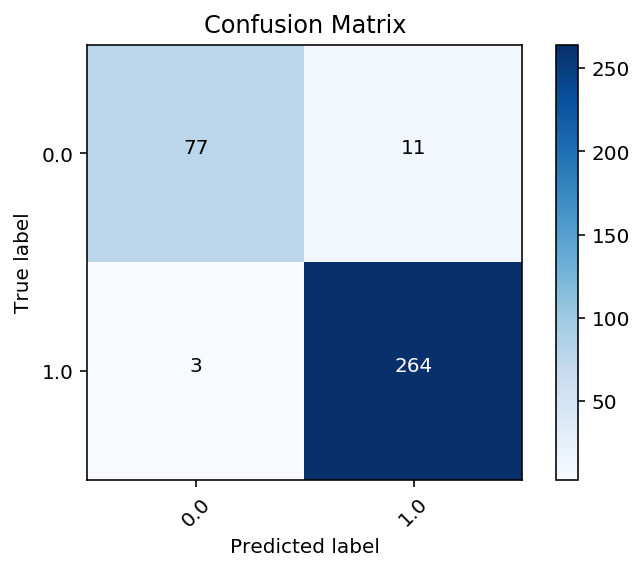

In [591]:
classifier = DecisionTreeClassifier(random_state=432)  
classifier.fit(X_train, y_train) 
y_pred = classifier.predict(X_test) 
     
display_accuracy(y_test, y_pred)

In [575]:
palestrina = test_df.loc[test_df['composer']==1]
bach = test_df.loc[test_df['composer']==0]

In [600]:
class_weight = {0:5,
                1:1}

Accuracy is :92.95774647887323

AUC is :0.93

F1 Score is: 0.9518304431599229


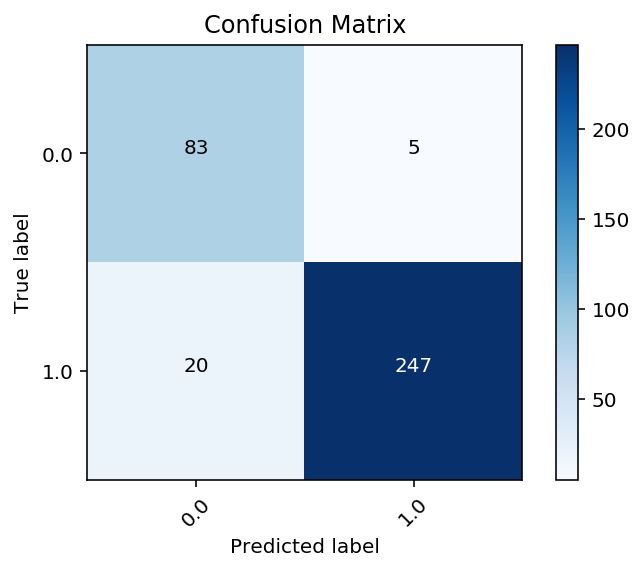

In [601]:
forest = RandomForestClassifier(random_state=35, n_estimators=1000, max_depth= 3,class_weight=class_weight)
forest.fit(X_train, y_train)
y_pred = forest.predict(X_test)
display_accuracy(y_test, y_pred)


In [577]:
bach.shape[0]

453

In [578]:
palestrina.shape[0]

1318

In [606]:
test_df.to_csv()

',Am0beat1,A-m0beat1,Gm0beat1,G-m0beat1,Fm0beat1,Em0beat1,E-m0beat1,Dm0beat1,D-m0beat1,Cm0beat1,Bm0beat1,B-m0beat1,Am0beat2,A-m0beat2,Gm0beat2,G-m0beat2,Fm0beat2,Em0beat2,E-m0beat2,Dm0beat2,D-m0beat2,Cm0beat2,Bm0beat2,B-m0beat2,Am0beat3,A-m0beat3,Gm0beat3,G-m0beat3,Fm0beat3,Em0beat3,E-m0beat3,Dm0beat3,D-m0beat3,Cm0beat3,Bm0beat3,B-m0beat3,Am0beat4,A-m0beat4,Gm0beat4,G-m0beat4,Fm0beat4,Em0beat4,E-m0beat4,Dm0beat4,D-m0beat4,Cm0beat4,Bm0beat4,B-m0beat4,Am1beat1,A-m1beat1,Gm1beat1,G-m1beat1,Fm1beat1,Em1beat1,E-m1beat1,Dm1beat1,D-m1beat1,Cm1beat1,Bm1beat1,B-m1beat1,Am1beat2,A-m1beat2,Gm1beat2,G-m1beat2,Fm1beat2,Em1beat2,E-m1beat2,Dm1beat2,D-m1beat2,Cm1beat2,Bm1beat2,B-m1beat2,Am1beat3,A-m1beat3,Gm1beat3,G-m1beat3,Fm1beat3,Em1beat3,E-m1beat3,Dm1beat3,D-m1beat3,Cm1beat3,Bm1beat3,B-m1beat3,Am1beat4,A-m1beat4,Gm1beat4,G-m1beat4,Fm1beat4,Em1beat4,E-m1beat4,Dm1beat4,D-m1beat4,Cm1beat4,Bm1beat4,B-m1beat4,Am2beat1,A-m2beat1,Gm2beat1,G-m2beat1,Fm2beat1,Em2beat1,E-m2beat1,Dm2beat1,D-m2beat1,Cm2beat1,

In [617]:
palestrina.sum()[:55]

Am0beat1       0.0
A-m0beat1      0.0
Gm0beat1       0.0
G-m0beat1      0.0
Fm0beat1       0.0
Em0beat1       0.0
E-m0beat1      0.0
Dm0beat1       0.0
D-m0beat1      0.0
Cm0beat1       0.0
Bm0beat1       0.0
B-m0beat1      0.0
Am0beat2       0.0
A-m0beat2      0.0
Gm0beat2       0.0
G-m0beat2      0.0
Fm0beat2       0.0
Em0beat2       0.0
E-m0beat2      0.0
Dm0beat2       0.0
D-m0beat2      0.0
Cm0beat2       0.0
Bm0beat2       0.0
B-m0beat2      0.0
Am0beat3       0.0
A-m0beat3      0.0
Gm0beat3       0.0
G-m0beat3      0.0
Fm0beat3       0.0
Em0beat3       0.0
E-m0beat3      0.0
Dm0beat3       0.0
D-m0beat3      0.0
Cm0beat3       0.0
Bm0beat3       0.0
B-m0beat3      0.0
Am0beat4       0.0
A-m0beat4      0.0
Gm0beat4       0.0
G-m0beat4      0.0
Fm0beat4       0.0
Em0beat4       0.0
E-m0beat4      0.0
Dm0beat4       0.0
D-m0beat4      0.0
Cm0beat4       0.0
Bm0beat4       0.0
B-m0beat4      0.0
Am1beat1      38.0
A-m1beat1     12.0
Gm1beat1     522.0
G-m1beat1      6.0
Fm1beat1    

In [618]:
test_df.head()

,Am0beat1,A-m0beat1,Gm0beat1,G-m0beat1,Fm0beat1,Em0beat1,E-m0beat1,Dm0beat1,D-m0beat1,Cm0beat1,...,E-m7beat4,Dm7beat4,D-m7beat4,Cm7beat4,Bm7beat4,B-m7beat4,part,composer,C-m7beat4,C-m5beat2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,NaN,0.0,NaN,NaN
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,NaN,0.0,NaN,NaN
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,NaN,0.0,NaN,NaN
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,NaN,0.0,NaN,NaN
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,NaN,0.0,NaN,NaN


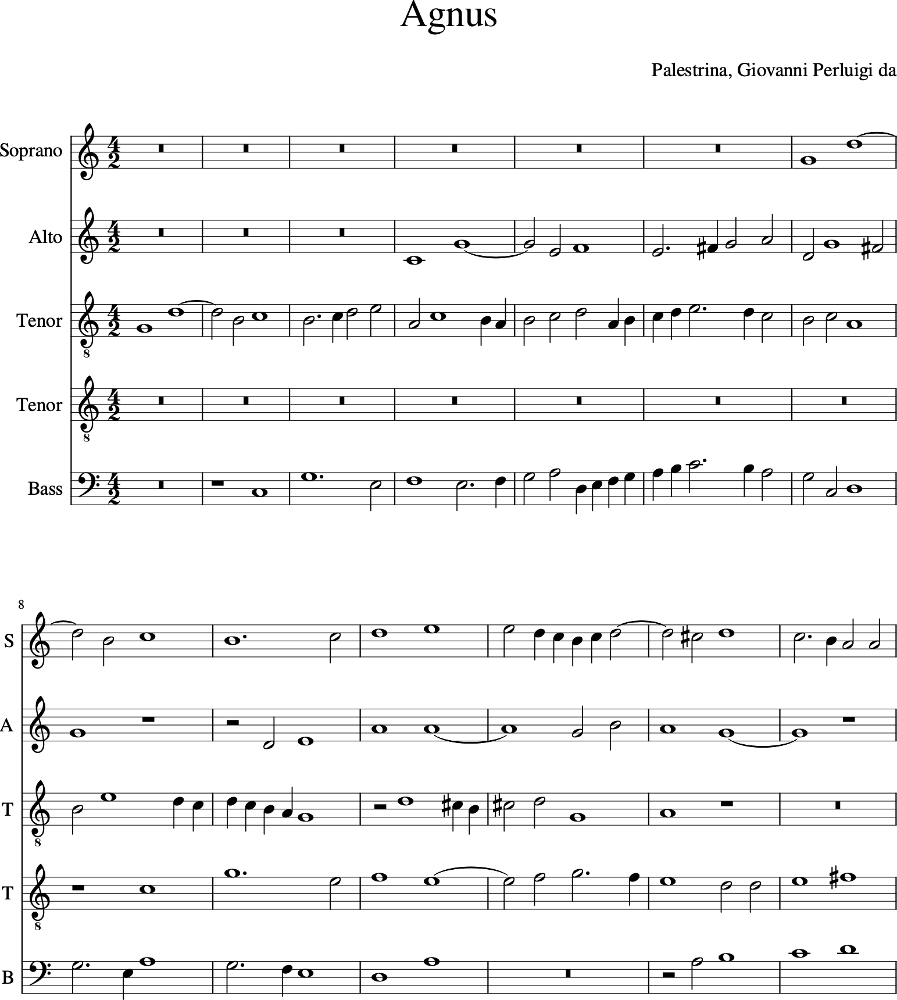

In [620]:
palestrina_scores[0].show()

In [623]:
len(test_df.columns)

388

In [624]:
test_df.shape

(1771, 388)

In [625]:
palestrina.shape


(1318, 388)